# House Prices - Advanced Regression Techniques

In this notebook we will create a model to predict house prices for the **Kaggle** competition [House Prices - Advanced Regression Techniques](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques).  

This project uses the Ames Housing dataset provided as part of the Kaggle competition:  
*Anna Montoya and DataCanary. House Prices - Advanced Regression Techniques. Kaggle, 2016.*  
The dataset is used strictly for non-commercial, educational purposes.  

And the evaluation metric used will be the Root Mean Squared Error (RMSE), on the log transformed price.  

The competition provides the following:  
- **train.csv**
> Training dataset comprised of the house's features and their sale price
- **test.csv**
> Test dataset with only the house's features but not their sale price.  
> Will act as unseen data and the final submitted prediction will be done on it.
- **data_description.txt**
> Text file describing each feature and their possible values (when categorical).


Our real objective with this project is not to create the best performing model possible, but to create different types of models and approaches, and compare their performances.  
For this, we will first do EDA on the data as well as some preprocessing and feature engineering, and then build models using the prepared data, compare them, and make a final prediction with the chosen one.

## 1. Setup

### 1.1 Imports

Before we start we need to import the resources (libraries, modules, etc.) that we will be using.  
For clarity, all imports used in this notebook will be done on this cell.  

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Due to current compatibility issues with Blackwell series GPUs, and for reproducibility purposes
import os
os.environ['CUDA_VISIBLE_DEVICES'] = ''

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import root_mean_squared_error
import joblib

# TensorFlow Decision Forests (TFDF)
import tensorflow_decision_forests as tfdf

# CatBoost 
from catboost import CatBoostRegressor, Pool

# TensorFlow
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Concatenate, Normalization, StringLookup, CategoryEncoding
from tensorflow.keras.models import Model
from tensorflow.keras.metrics import RootMeanSquaredError

### 1.2 Global settings

We will set a fixed random seed for reproducibility.

In [2]:
# Set random seed for reproducibility (for Python, NumPy, and TensorFlow)
tf.keras.utils.set_random_seed(33)

As the data provided has many features, we will set up **Pandas** to display all columns and rows, making it easier to explore the data.

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### 1.3 Data loading

We will load the datasets provided, **train.csv** and **test.csv**, as **Pandas** dataframes:  

In [4]:
trainrawdata_path = '../data/raw/train.csv' # Relative path to the training dataset
traindf = pd.read_csv(trainrawdata_path)

In [5]:
testrawdata_path = '../data/raw/test.csv' # Relative path to the test dataset
testdf = pd.read_csv(testrawdata_path)

## 2. EDA

### 2.1 Initial exploration

In [6]:
traindf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
testdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

We can see that our training dataset has 1460 entries, with 79 features (81 columns but one is **Id** and another is the target variable **SalePrice**).  
Similarly, the test dataset provided has 1459 entries, with 79 features (80 columns couting **Id**), and as mentioned earlier, without target variable.  

Features are stored as 3 different data types: **int64**, **float64** and **object** (string).

In both datasets there seems to be missing data in some features, which we will explore and deal with later.

Let's take a quick look at a few examples of our data to see what we are dealing with:

In [ ]:
traindf.head(10)

After this first look we see that we have a mixed set of data, some columns are quantitative (numerical) like our target variable **SalePrice** or **LotArea** while many others are qualitative (categorical).  
Some of the categorical features are nominal but there are also ordinal variables like **OverallCond** which rates from 1 to 10 the overall condition of the house.

### 2.2 Target variable analysis

Our target variable is **SalePrice**, a numerical variable which shows the price at what each house got sold, in US Dollars.  
We should take a first look at its distribution:  

In [9]:
traindf['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

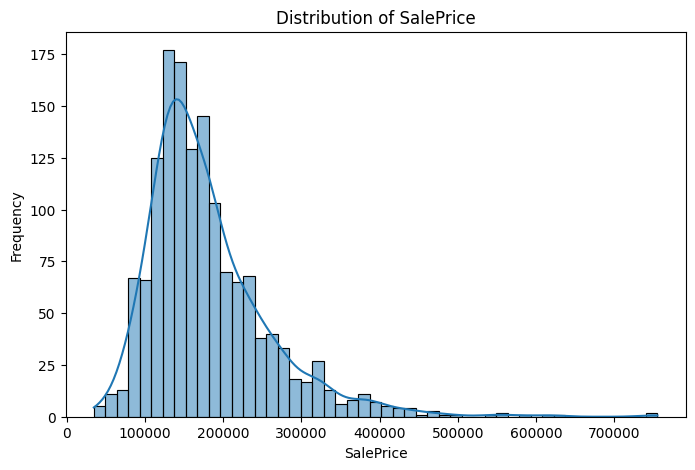

Skewness of SalePrice: 1.8828757597682129
Kurtosis of SalePrice: 6.536281860064529


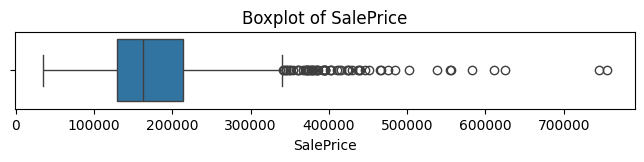

In [10]:
# Histogram of SalePrice
plt.figure(figsize=(8, 5))
sns.histplot(traindf['SalePrice'], kde=True)
plt.title('Distribution of SalePrice')
plt.xlabel('SalePrice')
plt.ylabel('Frequency')
plt.show()
# Calculate skewness and kurtosis
print(f'Skewness of SalePrice: {traindf['SalePrice'].skew()}')
print(f'Kurtosis of SalePrice: {traindf['SalePrice'].kurt()}')
# Boxplot of SalePrice
plt.figure(figsize=(8, 1))
sns.boxplot(x=traindf['SalePrice'])
plt.title('Boxplot of SalePrice')
plt.show()

**SalePrice** has a strongly right-skewed distribution (skew = 1.88) with a heavy right tail, confirmed by the high kurtosis value (6.54) and the boxplot.  
This is expected for housing prices, where most properties are sold around a typical value, and only a few are significantly more expensive.  
The average sale price is $180,921.20, with values ranging from $34,900.00 to $755,000.00.

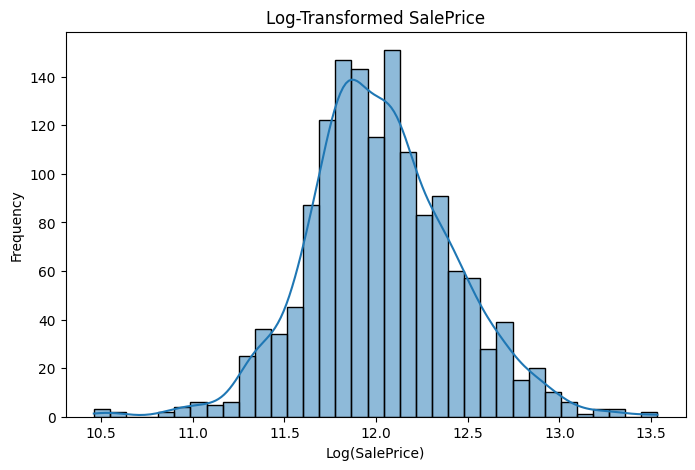

Skewness of log(SalePrice): 0.12134661989685333
Kurtosis of log(SalePrice): 0.809519155707878


In [11]:
# Histogram of log(SalePrice)
plt.figure(figsize=(8, 5))
sns.histplot(np.log1p(traindf['SalePrice']), kde=True)
plt.title('Log-Transformed SalePrice')
plt.xlabel('Log(SalePrice)')
plt.ylabel('Frequency')
plt.show()
# Calculate skewness and kurtosis
print(f'Skewness of log(SalePrice): {np.log1p(traindf['SalePrice']).skew()}')
print(f'Kurtosis of log(SalePrice): {np.log1p(traindf['SalePrice']).kurt()}')

The log-transformed SalePrice shows a nearly normal distribution.  
Skew = 0.12 and kurtosis = 0.81 indicate that even though not perfectly normal, the shape is close enough to be treated as such.  

We will use the log-transformed target for training to reduce the impact of errors on very cheap or very expensive houses, and to improve model stability.  
This is also required by the competition, as the evaluation is based on RMSE of the log-transformed prices.

### 2.3 Missing Values Analysis & Handling

Some of the models we will be using can deal with missing values natively, while others like those based on Neural Networks, cannot.  
For a fair comparison, we will prepare the data so that every model has the same starting point.

#### 2.3.1 Missing values on training dataset

Now lets look at which features have missing values and how many each have.

In [12]:
traindf.isnull().sum().sort_values(ascending=False)[lambda x: x > 0]

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
MasVnrType       872
FireplaceQu      690
LotFrontage      259
GarageQual        81
GarageFinish      81
GarageType        81
GarageYrBlt       81
GarageCond        81
BsmtFinType2      38
BsmtExposure      38
BsmtCond          37
BsmtQual          37
BsmtFinType1      37
MasVnrArea         8
Electrical         1
dtype: int64

As per the **data_description.txt** file, many of these features use NA as intented value, meaning 'None'.  
But there are other variables where that is not the case, like **GarageYrBlt** or **MasVnrArea**.  

As there are not that many features with missing values, lets explore them manually and deal with them accordingly.

**PoolQC** is a categorical variable which describes the quality of the pool, NA is not one of the categories but given that there is no category for 'No pool', those 1453 missing values should mean that those 1453 houses have no pool.  

We can confirm this looking at how many houses have 0 pool area and checking if those entries are the same as the ones with **PoolQC** missing values.

In [13]:
(traindf['PoolArea'] == 0).sum()

np.int64(1453)

In [14]:
traindf[(traindf['PoolArea'] == 0) & (traindf['PoolQC'].isnull())].shape

(1453, 81)

Now lets transform empty values into a string 'None' to avoid issues with missing values downstream.

In [15]:
traindf['PoolQC'] = traindf['PoolQC'].fillna('None')
traindf['PoolQC'].unique()

array(['None', 'Ex', 'Fa', 'Gd'], dtype=object)

**MiscFeature** is also a categorical variable with NA as intended value for None, lets compare it with **MiscVal** which represents the value of said feature.

In [16]:
(traindf['MiscVal'] == 0).sum()

np.int64(1408)

In [17]:
traindf[(traindf['MiscVal'] == 0) & (traindf['MiscFeature'].isnull())].shape

(1406, 81)

There seems to be 2 instances of **MiscVal** 0 more than the number of entries with **MiscFeature** as NA.  

In [ ]:
traindf[(traindf['MiscVal'] == 0) & (traindf['MiscFeature'].notna())]

As there are only 2 entries, we will drop them and replace the NA values of the rest of **MiscFeature** with 'None'.

In [19]:
traindf = traindf.drop(index=traindf[(traindf['MiscVal'] == 0) & (traindf['MiscFeature'].notna())].index)

In [20]:
traindf['MiscFeature'] = traindf['MiscFeature'].fillna('None')
traindf['MiscFeature'].unique()

array(['None', 'Shed', 'Gar2', 'Othr', 'TenC'], dtype=object)

Both **Alley** and **Fence** also use NA as None. This time there is no information to crosscheck, so we will assume all NA values are correct.

In [21]:
traindf['Alley'] = traindf['Alley'].fillna('None')
traindf['Alley'].unique()

array(['None', 'Grvl', 'Pave'], dtype=object)

In [22]:
traindf['Fence'] = traindf['Fence'].fillna('None')
traindf['Fence'].unique()

array(['None', 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

**MasVnrType** is a categorical variable that describes the type of masonry veneer, and **MasVnrArea** is a numerical variable that measures its area in square feet.  
For the type there is a None category but with None instead of NA. Lets check its values:

In [23]:
(traindf['MasVnrArea'] == 0).sum()

np.int64(859)

In [24]:
traindf['MasVnrArea'].isnull().sum()

np.int64(8)

In [25]:
traindf['MasVnrType'].isnull().sum()

np.int64(870)

There seems to be some type of inconsistency here, as we have 870 missing values on **MasVnrType**, 8 missing values on **MasVnrArea**, and 859 values of 0 area.  
We should first check which rows have unexpected values.

In [ ]:
traindf[(traindf['MasVnrArea'] > 0) & (traindf['MasVnrType'].isnull())]

In [ ]:
traindf[(traindf['MasVnrArea'].isnull())]

In [ ]:
traindf[(traindf['MasVnrArea'] == 0) & ~(traindf['MasVnrType'].isnull())]

We can see 4 different cases here:  
> 8 entries where both type and area are NA  
> 2 entries where type is NA but where the area is 1.0, which would not make sense as that area value is too small  
> 3 entries where type is NA but where the area has a reasonable value  
> 2 entries where there is a valid type but the area is 0  

We are going to drop the entries with both values missing, and the two with 1.0 as area, because they are only 10 entries (<1% of the total).  

As for the other two cases, we are going to replace the missing values with the mode of the type from its neighborhood, and with the median area of the neighborhood.  

In [29]:
traindf = traindf.drop(index=traindf[(traindf['MasVnrType'].isnull()) & (traindf['MasVnrArea'].isnull())].index)
traindf = traindf.drop(index=traindf[(traindf['MasVnrArea'] == 1.0)].index)

In [30]:
# Create boolean mask for those rows where MasVnrType is NaN and MasVnrArea is not 0
mask1 = traindf['MasVnrType'].isna() & (traindf['MasVnrArea'] != 0)

# Create boolean mask for those rows where MasVnrType has a valid value and MasVnrArea is 0
mask2 = ~traindf['MasVnrType'].isna() & (traindf['MasVnrArea'] == 0)

# Group by Neighborhood and get the mode of MasVnrType by Neighborhood and the median of MasVnrArea.
MasVnrType_mode_Neighborhood = (traindf.groupby('Neighborhood')['MasVnrType'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
MasVnrArea_median_Neighborhood = traindf.groupby('Neighborhood')['MasVnrArea'].median()

# Map the mode values to the original DataFrame
traindf.loc[mask1, 'MasVnrType'] = traindf.loc[mask1, 'Neighborhood'].map(MasVnrType_mode_Neighborhood)
traindf.loc[mask2, 'MasVnrArea'] = traindf.loc[mask2, 'Neighborhood'].map(MasVnrArea_median_Neighborhood)

Lets check whether all the missing values remaining matches the number of properties without masonry veneer.

In [ ]:
print(traindf['MasVnrType'].isnull().sum())
print((traindf['MasVnrArea'] == 0).sum())
traindf[(traindf['MasVnrArea'] == 0) & ~(traindf['MasVnrType'].isnull())]

We can see there is still an entry with valid veneer type but area 0, this means that the median of that neighborhood is 0.  
As it is only one entry, our safest approach is to just drop this one entry.

In [32]:
traindf = traindf.drop(index=traindf[(traindf['MasVnrArea'] == 0) & ~(traindf['MasVnrType'].isnull())].index)

Now we will replace the NA values in type by 'None'.

In [33]:
traindf['MasVnrType'] = traindf['MasVnrType'].fillna('None')
traindf['MasVnrType'].unique()

array(['BrkFace', 'None', 'Stone', 'BrkCmn'], dtype=object)

**FireplaceQu** has NA as None, and the amount should match the amount of 0 **Fireplaces**.  
If so, we will just replace those NA with 'None'.

In [34]:
(traindf['FireplaceQu'].isnull()).sum()

np.int64(684)

In [35]:
(traindf['Fireplaces'] == 0).sum()

np.int64(684)

In [36]:
traindf[(traindf['Fireplaces'] == 0) & (traindf['FireplaceQu'].isnull())].shape

(684, 81)

In [37]:
traindf['FireplaceQu'] = traindf['FireplaceQu'].fillna('None')
traindf['FireplaceQu'].unique()

array(['None', 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

**LotFrontage** shows the linear feet of street connected to the house.  
As there is a big number of missing values (~17%), dropping them would not be reasonable.  
Instead, we will replace those values by the median of the neighborhood.

In [38]:
# Create boolean mask for those rows where LotFrontage is NA.
mask = traindf['LotFrontage'].isna()

# Group by Neighborhood and get the mode of LotFrontage by Neighborhood
LotFrontage_median_Neighborhood = traindf.groupby('Neighborhood')['LotFrontage'].median()

# Map the mode values to the original DataFrame
traindf.loc[mask, 'LotFrontage'] = traindf.loc[mask, 'Neighborhood'].map(LotFrontage_median_Neighborhood)

In [39]:
(traindf['LotFrontage'].isnull()).sum()

np.int64(0)

Now we will check the garage related variables.
We have 81 missing values on **GarageQual, GarageType, GarageFinish, GarageYrBlt, GarageExposure**.  
All those are categorical and have NA as legitimate value for 'no garage', except **GarageYrBlt** which is numerical (year the garage was built).  

Besides those, we can see two more variables related to the garage, **GarageArea** and **GarageCars** which are numerical variables.

Now we should check that those 81 missing values on each feature, they all match 81 unique entries, that at the same time should have all of them 0 in both Area and Cars.

In [40]:
(traindf['GarageCars'] == 0).sum()

np.int64(81)

In [41]:
(traindf['GarageArea'] == 0).sum()

np.int64(81)

In [42]:
traindf[(traindf['GarageArea'] == 0) & (traindf['GarageCars'] == 0) & (traindf['GarageQual'].isnull()) 
        & (traindf['GarageType'].isnull()) & (traindf['GarageFinish'].isnull()) 
        & (traindf['GarageCond'].isnull()) & (traindf['GarageYrBlt'].isnull())].shape

(81, 81)

After checking this we can safely replace NA values on the categorical variables with 'None', and for **GarageYrBlt** we will replace with -1 as a placeholder to indicate there is no garage.

In [43]:
for var in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    traindf[var] = traindf[var].fillna('None')
    print(f'Unique values in {var}: {traindf[var].unique()}')
traindf['GarageYrBlt'] = traindf['GarageYrBlt'].fillna(-1)
(traindf['GarageYrBlt'] == -1).sum()

Unique values in GarageType: ['Attchd' 'Detchd' 'BuiltIn' 'CarPort' 'None' 'Basment' '2Types']
Unique values in GarageFinish: ['RFn' 'Unf' 'Fin' 'None']
Unique values in GarageQual: ['TA' 'Fa' 'Gd' 'None' 'Ex' 'Po']
Unique values in GarageCond: ['TA' 'Fa' 'None' 'Gd' 'Po' 'Ex']


np.int64(81)

As far as basement related variables, we have 11 in total:
> **BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2**, these 5 categorical features use NA as value for 'no basement', and those are the ones that show missing values.  
> **BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF**, these 4 numerical features describe the area in square feet of the different sections of the basement, they have no missing values.  
> **BsmtFullBath, BsmtHalfBath**, these 2 numerical features describe the amount of full and half bathrooms that there are in the basement, they have no missing values.  

We expect to see that those entries with missing values in all 5 categorical features, should have 0 as value in all the numerical variables.  
First we will check that and replace the missing values with 'None' and then we can focus in the rest of the missing values.

In [44]:
BsmtCatCols = ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']
mask = traindf[BsmtCatCols].isnull().all(axis=1)

print('Basement 1 area: ', 
      traindf[mask]['BsmtFinSF1'].value_counts())

print('Basement 2 area: ', 
      traindf[mask]['BsmtFinSF2'].value_counts())

print('Unfinished basement area: ', 
      traindf[mask]['BsmtUnfSF'].value_counts())

print('Basement total area: ', 
      traindf[mask]['TotalBsmtSF'].value_counts())

print('Basement full bathrooms: ', 
      traindf[mask]['BsmtFullBath'].value_counts())

print('Basement half bathrooms: ', 
      traindf[mask]['BsmtHalfBath'].value_counts())

Basement 1 area:  BsmtFinSF1
0    37
Name: count, dtype: int64
Basement 2 area:  BsmtFinSF2
0    37
Name: count, dtype: int64
Unfinished basement area:  BsmtUnfSF
0    37
Name: count, dtype: int64
Basement total area:  TotalBsmtSF
0    37
Name: count, dtype: int64
Basement full bathrooms:  BsmtFullBath
0    37
Name: count, dtype: int64
Basement half bathrooms:  BsmtHalfBath
0    37
Name: count, dtype: int64


With that we can safely replace in those 37 entries the missing value with 'None'.

In [45]:
traindf.loc[mask, BsmtCatCols] = traindf.loc[mask, BsmtCatCols].fillna('None')

Lets check what missing values remain.

In [46]:
traindf.isnull().sum().sort_values(ascending=False)[lambda x: x > 0]

BsmtExposure    1
BsmtFinType2    1
Electrical      1
dtype: int64

In [ ]:
traindf[traindf['BsmtExposure'].isnull() | traindf['BsmtFinType2'].isnull()]

We can see that there is one entry with **BsmtFinType2** empty even though there is surface area and the other values make sense, and another entry where **BsmtExposure**'s value is missing even though the rest of the values indicate that there is an unfinished basement. Both cases seem to be missing information, not empty on purpose.  

Given that it is only 2 entries, we will drop them.

In [48]:
traindf = traindf.drop(index=traindf[traindf['BsmtExposure'].isnull() | traindf['BsmtFinType2'].isnull()].index)

As for the entry with the **Electrical** feature missing, we will drop it too.

In [49]:
traindf = traindf.drop(index=traindf[traindf['Electrical'].isnull()].index)

Before we proceed lets check all missing values have been dealt with:

In [50]:
traindf.isnull().sum().sort_values(ascending=False)[lambda x: x > 0]

Series([], dtype: int64)

An empty list means there are no more missing values in our data.

In [51]:
traindf.shape

(1444, 81)

We have lost in total 16 rows (~1%), but now we have a clean dataset that will not give us problems when we implement any models that cannot deal with missing values natively.

Lets save the cleaned dataset into a CSV file before proceeding with the next steps.

In [52]:
train_clean_output_path = '../data/processed/train_clean.csv'  # Output file path
traindf.to_csv(train_clean_output_path, index=False)

#### 2.3.2 Missing values on test dataset

Now we will repeat the same operations with the test dataset provided.  
But this time we cannot drop any row, as we need to make a prediction for all entries for the **Kaggle** submission.  

We will start by loading the test set.

In [53]:
testdf.isnull().sum().sort_values(ascending=False)[lambda x: x > 0]

PoolQC          1456
MiscFeature     1408
Alley           1352
Fence           1169
MasVnrType       894
FireplaceQu      730
LotFrontage      227
GarageYrBlt       78
GarageCond        78
GarageFinish      78
GarageQual        78
GarageType        76
BsmtCond          45
BsmtQual          44
BsmtExposure      44
BsmtFinType1      42
BsmtFinType2      42
MasVnrArea        15
MSZoning           4
BsmtHalfBath       2
Utilities          2
Functional         2
BsmtFullBath       2
BsmtFinSF1         1
Exterior1st        1
TotalBsmtSF        1
BsmtUnfSF          1
BsmtFinSF2         1
SaleType           1
KitchenQual        1
GarageCars         1
GarageArea         1
Exterior2nd        1
dtype: int64

We have more features with missing values in the test dataset than in the train set, but most seem to be one or two entries.  

As we cannot drop rows on the test set given that we need to make a prediction for all of them, lets first apply carefully the same transformations as with the training set and see what remains.

In [54]:
# Replace NA with 'None' in every missing PoolQC that has PoolArea = 0
mask = (testdf['PoolArea'] == 0) & (testdf['PoolQC'].isnull())
testdf.loc[mask, 'PoolQC'] = 'None'

# Replace NA with 'None' in every missing MiscFeature that has MiscVal = 0
mask = (testdf['MiscVal'] == 0) & (testdf['MiscFeature'].isnull())
testdf.loc[mask, 'MiscFeature'] = 'None'

# Replace NA with 'None' in every missing Alley and Fence
testdf['Alley'] = testdf['Alley'].fillna('None')
testdf['Fence'] = testdf['Fence'].fillna('None')

# For those with both MasVnrtype and MasVnrArea missing, we will first replace the area with the median of the neighborhood from the training set
mask = testdf['MasVnrType'].isna() & (testdf['MasVnrArea'].isna())
testdf.loc[mask, 'MasVnrArea'] = testdf.loc[mask, 'Neighborhood'].map(MasVnrArea_median_Neighborhood)
# Then replace the MasVnrType with the mode of the neighborhood from the training set on those rows with a valid MasVnrArea (>0)
mask = testdf['MasVnrType'].isna() & (testdf['MasVnrArea'] > 0)
testdf.loc[mask, 'MasVnrType'] = testdf.loc[mask, 'Neighborhood'].map(MasVnrType_mode_Neighborhood)
# And for those with MasVnrArea = 0 and MasVnrType missing, we will replace the type with 'None'
mask = testdf['MasVnrType'].isna() & (testdf['MasVnrArea'] == 0)
testdf.loc[mask, 'MasVnrType'] = 'None'

# Replace NA with 'None' in every missing FireplaceQu that has Fireplaces = 0
mask = (testdf['Fireplaces'] == 0) & (testdf['FireplaceQu'].isnull())
testdf.loc[mask, 'FireplaceQu'] = 'None'

# Replace NA with the median LotFrontage of the neighborhood from the training set
mask = testdf['LotFrontage'].isna()
testdf.loc[mask, 'LotFrontage'] = testdf.loc[mask, 'Neighborhood'].map(LotFrontage_median_Neighborhood)

# Replace NA with 'None' in every missing categorical Garage variables, with -1 in GarageYrBlt and with 0 in GarageArea and GarageCars
# But only for those entries where all Garage variables mean there is no garage
mask = (
    ((testdf['GarageArea'].isnull()) | (testdf['GarageArea'] == 0)) &
    ((testdf['GarageCars'].isnull()) | (testdf['GarageCars'] == 0)) &
    (testdf['GarageQual'].isnull()) &
    (testdf['GarageType'].isnull()) &
    (testdf['GarageFinish'].isnull()) &
    (testdf['GarageCond'].isnull()) &
    ((testdf['GarageYrBlt'].isnull()) | (testdf['GarageYrBlt'] == 0))
)

for var in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    testdf.loc[mask, var] = 'None'
testdf.loc[mask, 'GarageYrBlt'] = -1
testdf.loc[mask, 'GarageArea'] = 0
testdf.loc[mask, 'GarageCars'] = 0



# Replace NA with 'None' in every missing categorical Basement variables, and with 0 in the numerical ones
# But only for those entries where all Basement variables mean there is no basement
mask = (
    ((testdf['BsmtFinSF1'].isnull()) | (testdf['BsmtFinSF1'] == 0)) &
    ((testdf['BsmtFinSF2'].isnull()) | (testdf['BsmtFinSF2'] == 0)) &
    ((testdf['BsmtUnfSF'].isnull()) | (testdf['BsmtUnfSF'] == 0)) &
    ((testdf['TotalBsmtSF'].isnull()) | (testdf['TotalBsmtSF'] == 0)) &
    ((testdf['BsmtFullBath'].isnull()) | (testdf['BsmtFullBath'] == 0)) &
    ((testdf['BsmtHalfBath'].isnull()) | (testdf['BsmtHalfBath'] == 0)) &
    (testdf['BsmtQual'].isnull()) &
    (testdf['BsmtCond'].isnull()) &
    (testdf['BsmtExposure'].isnull()) &
    (testdf['BsmtFinType1'].isnull()) &
    (testdf['BsmtFinType2'].isnull())
)
for var in ['BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2']:
    testdf.loc[mask, var] = 'None'
for var in ['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath']:
    testdf.loc[mask, var] = 0

Afther those transformations the missing values remaining are the following.

In [55]:
testdf.isnull().sum().sort_values(ascending=False)[lambda x: x > 0]

MSZoning        4
BsmtCond        3
PoolQC          3
Utilities       2
BsmtQual        2
BsmtExposure    2
GarageFinish    2
GarageQual      2
GarageCond      2
Functional      2
GarageYrBlt     2
GarageArea      1
Exterior1st     1
KitchenQual     1
GarageCars      1
Exterior2nd     1
MiscFeature     1
SaleType        1
dtype: int64

In [56]:
testdf.isnull().any(axis=1).sum()

np.int64(22)

Most missing values have been cleaned, but there are a few remnants over 22 entries that we will deal with manually.  

Using the information provided in data_description.txt we will proceed with the following:

- **MSZoning** we will replace missing values with the mode by neighborhood from the training set
- **PoolQC** we will replace missing values with the mode by neighborhood from the training set (we previously already replaced those with 0 **PoolArea** by 'None')
- **Utilities** we will replace missing values with the mode by neighborhood from the training set
- **Functional** we will replace missing values with 'Typ' (From documentation: Assume typical unless deductions are warranted)
- **Exterior1st** we will replace missing values with the mode by neighborhood from the training set
- **Exterior2nd** we will replace missing values with the mode by neighborhood from the training set
- **KitchenQual** we will replace missing values with the mode by neighborhood from the training set
- **MiscFeature** we will replace missing values with 'Other' category (we previously already replaced those with 0 **MiscVal** by 'None')
- **SaleType** we will replace missing values with the mode by neighborhood from the training set

In [57]:
mask = testdf['MSZoning'].isna()
MSZoning_mode_Neighborhood = (traindf.groupby('Neighborhood')['MSZoning'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
testdf.loc[mask, 'MSZoning'] = testdf.loc[mask, 'Neighborhood'].map(MSZoning_mode_Neighborhood)

mask = testdf['PoolQC'].isna()
PoolQC_mode_Neighborhood = (traindf.groupby('Neighborhood')['PoolQC'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
testdf.loc[mask, 'PoolQC'] = testdf.loc[mask, 'Neighborhood'].map(PoolQC_mode_Neighborhood)

mask = testdf['Utilities'].isna()
Utilities_mode_Neighborhood = (traindf.groupby('Neighborhood')['Utilities'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
testdf.loc[mask, 'Utilities'] = testdf.loc[mask, 'Neighborhood'].map(Utilities_mode_Neighborhood)

mask = testdf['Functional'].isna()
testdf.loc[mask, 'Functional'] = 'Typ'

mask = testdf['Exterior1st'].isna()
Exterior1st_mode_Neighborhood = (traindf.groupby('Neighborhood')['Exterior1st'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
testdf.loc[mask, 'Exterior1st'] = testdf.loc[mask, 'Neighborhood'].map(Exterior1st_mode_Neighborhood)

mask = testdf['Exterior2nd'].isna()
Exterior2nd_mode_Neighborhood = (traindf.groupby('Neighborhood')['Exterior2nd'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
testdf.loc[mask, 'Exterior2nd'] = testdf.loc[mask, 'Neighborhood'].map(Exterior2nd_mode_Neighborhood)

mask = testdf['KitchenQual'].isna()
KitchenQual_mode_Neighborhood = (traindf.groupby('Neighborhood')['KitchenQual'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
testdf.loc[mask, 'KitchenQual'] = testdf.loc[mask, 'Neighborhood'].map(KitchenQual_mode_Neighborhood)

mask = testdf['MiscFeature'].isna()
testdf.loc[mask, 'MiscFeature'] = 'Other'

mask = testdf['SaleType'].isna()
SaleType_mode_Neighborhood = (traindf.groupby('Neighborhood')['SaleType'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
testdf.loc[mask, 'SaleType'] = testdf.loc[mask, 'Neighborhood'].map(SaleType_mode_Neighborhood)

All we should have left are the Basement and Garage related variables.

In [58]:
testdf.isnull().sum().sort_values(ascending=False)[lambda x: x > 0]

BsmtCond        3
GarageFinish    2
GarageYrBlt     2
GarageQual      2
BsmtQual        2
BsmtExposure    2
GarageCond      2
GarageArea      1
GarageCars      1
dtype: int64

In [59]:
testdf.isnull().any(axis=1).sum()

np.int64(9)

They are only 9 entries, lets explore them:

In [ ]:
testdf[testdf.isnull().any(axis=1)]

We can see there is one entry where even though there is **GarageType** defined, the rest of the information related to the garage is missing, so we are going to assume there is no garage on the property and the type was a data error.  

The rest of the entries show enough information about basement and garage, so we will replace the missing parts using the mode by neighborhood on the categorical variables and the median on the numerical ones.

In [61]:
# First lets deal with the row where we are assuming there is no garage
row_label = testdf[testdf['GarageCars'].isnull()].index[0]

# Now lets change the rest of the garage variables
for var in ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']:
    testdf.loc[row_label, var] = 'None'
testdf.loc[row_label, 'GarageArea'] = 0.0
testdf.loc[row_label, 'GarageCars'] = 0.0
testdf.loc[row_label, 'GarageYrBlt'] = -1

# Now for the rest, lets replace the missing values of the categorical variables with the mode of the neighborhood from the training set
for var in ['GarageFinish', 'GarageQual', 'GarageCond', 'BsmtExposure', 'BsmtQual', 'BsmtCond']:
    mask = testdf[var].isna()
    mode = (traindf.groupby('Neighborhood')[var].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'None'))
    testdf.loc[mask, var] = testdf.loc[mask, 'Neighborhood'].map(mode)

# And for GarageYrBlt, the only numerical variable, we will replace it with the median of the neighborhood from the training set
GarageYrBlt_median_Neighborhood = traindf.groupby('Neighborhood')['GarageYrBlt'].median()
row_label = testdf[testdf['GarageYrBlt'].isnull()].index[0]
neighborhood = testdf.loc[row_label, 'Neighborhood']
testdf.loc[row_label, 'GarageYrBlt'] = GarageYrBlt_median_Neighborhood[neighborhood]

Let's do a final check to make sure all missing values have been dealt with:

In [62]:
testdf.isnull().sum().sort_values(ascending=False)[lambda x: x > 0]

Series([], dtype: int64)

And now lets save the cleaned test dataset to a file.

In [63]:
test_clean_output_path = '../data/processed/test_clean.csv'  # Output file path
testdf.to_csv(test_clean_output_path, index=False)

### 2.4 Feature analysis

We will first check how many numerical and categorical features we have.  


In [64]:
print(f'Categorical columns:\n{traindf.select_dtypes(include=['object']).columns}\n')
print(f'Numerical columns:\n{traindf.select_dtypes(include=['int64', 'float64']).columns}')

Categorical columns:
Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

Numerical columns:
Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullB

Taking a look at this, we can see that we cannot directly separate them by type, as there are some categorical features stored as numbers.  
We are going to manually check the features information on **data_description.txt** and adjust these lists.

In [65]:
cat_features = [
    'MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
    'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
    'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st',
    'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
    'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
    'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
    'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
    'MiscFeature', 'MoSold', 'SaleType', 'SaleCondition'
]

num_features = [
    'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
    'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
    'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
    'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars',
    'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
    'ScreenPorch', 'PoolArea', 'MiscVal', 'YrSold'
]

In [66]:
print(f'Number of categorical features: {len(cat_features)}')
print(f'Number of numerical features: {len(num_features)}')

Number of categorical features: 47
Number of numerical features: 32


#### 2.4.1 Numerical variables

LotFrontage:
count    1444.000000
mean       70.193213
std        22.496217
min        21.000000
25%        60.000000
50%        70.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64
Skewness: 2.2178925971882673
Kurtosis: 20.082318344646424


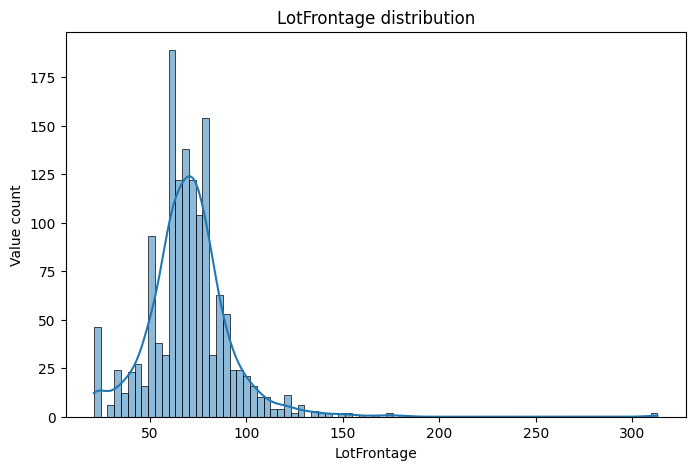

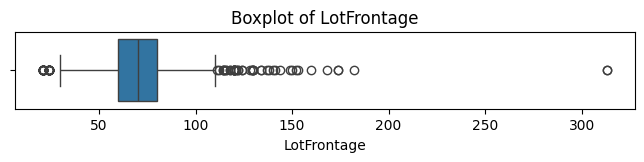

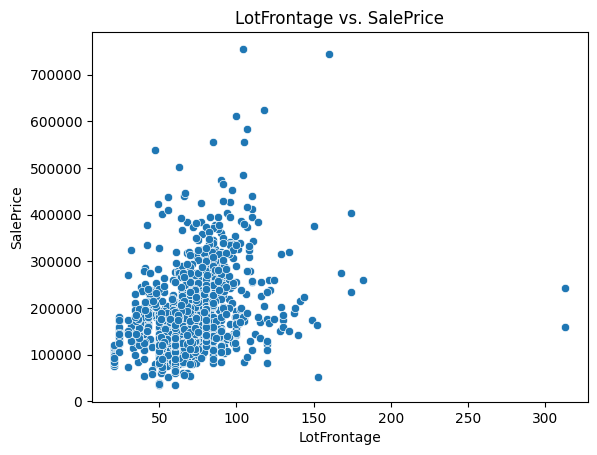

LotArea:
count      1444.000000
mean      10501.068560
std       10013.993035
min        1300.000000
25%        7500.000000
50%        9458.500000
75%       11600.000000
max      215245.000000
Name: LotArea, dtype: float64
Skewness: 12.219561716039479
Kurtosis: 202.88662125734743


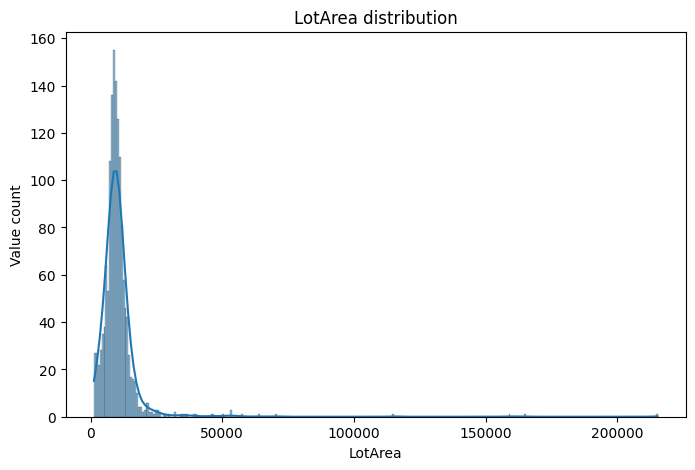

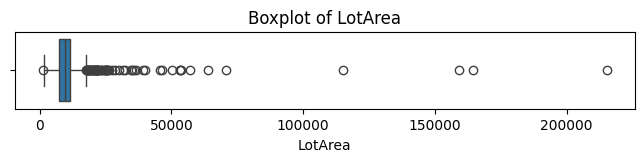

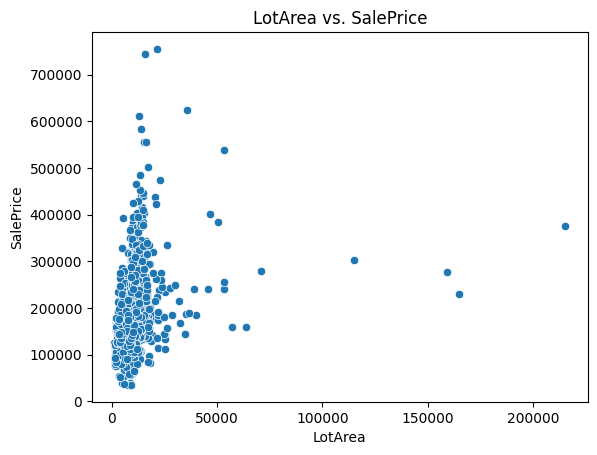

YearBuilt:
count    1444.000000
mean     1971.045014
std        30.218012
min      1872.000000
25%      1954.000000
50%      1972.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64
Skewness: -0.607188815775503
Kurtosis: -0.4464314375970373


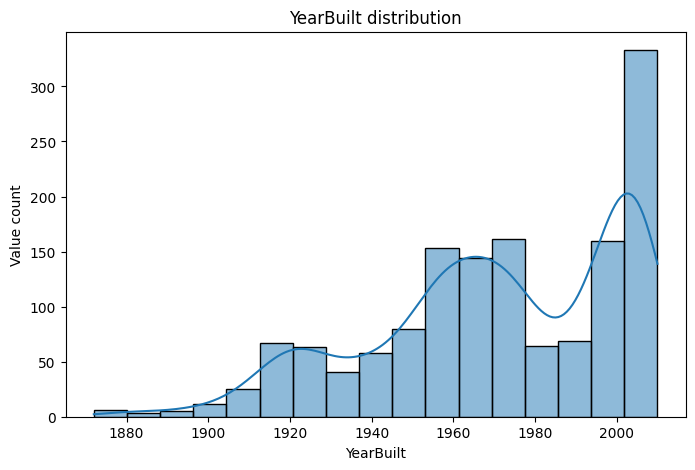

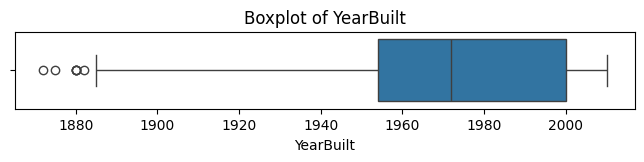

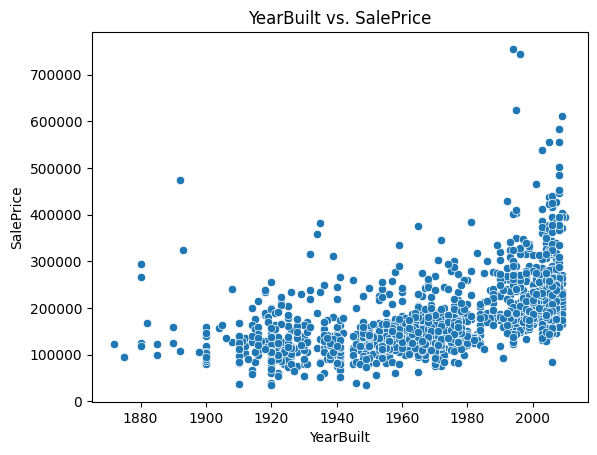

YearRemodAdd:
count    1444.000000
mean     1984.777701
std        20.644965
min      1950.000000
25%      1966.000000
50%      1993.000000
75%      2004.000000
max      2010.000000
Name: YearRemodAdd, dtype: float64
Skewness: -0.49848258598758993
Kurtosis: -1.2768475829991075


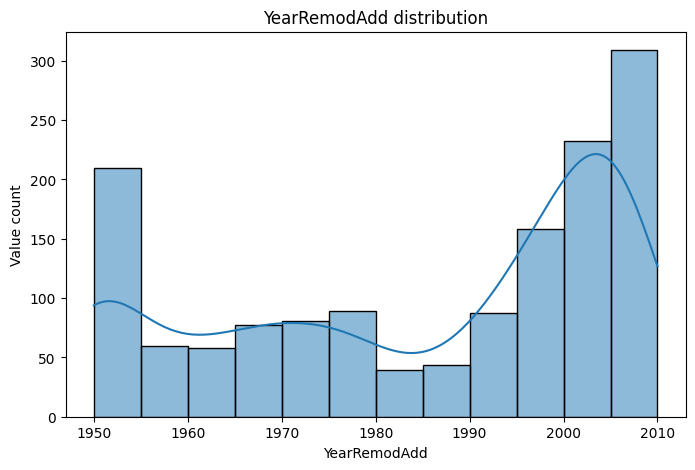

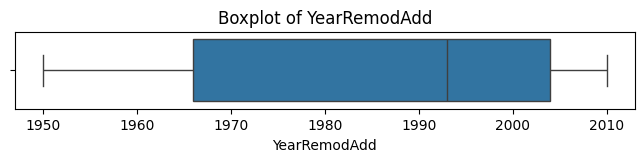

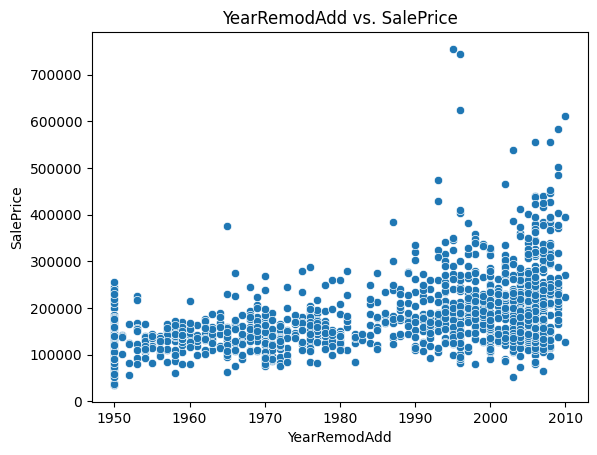

MasVnrArea:
count    1444.000000
mean      103.978532
std       181.359306
min         0.000000
25%         0.000000
50%         0.000000
75%       166.000000
max      1600.000000
Name: MasVnrArea, dtype: float64
Skewness: 2.666081815865633
Kurtosis: 10.051680199981572


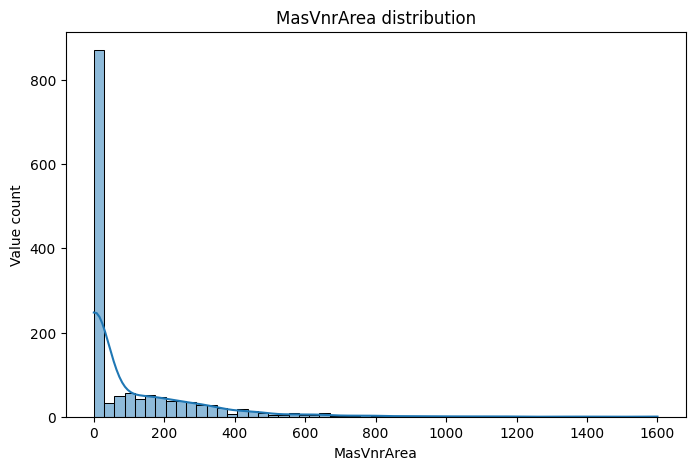

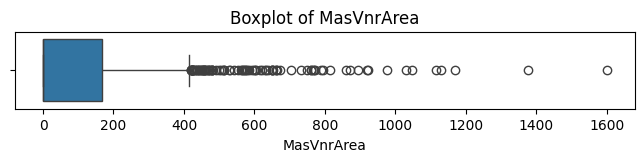

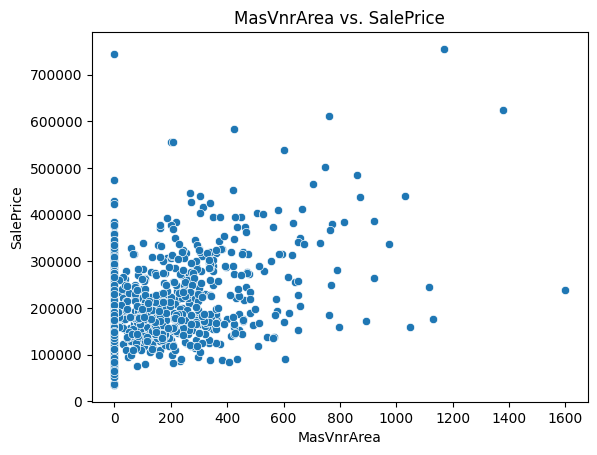

BsmtFinSF1:
count    1444.000000
mean      442.065789
std       455.624075
min         0.000000
25%         0.000000
50%       381.000000
75%       706.500000
max      5644.000000
Name: BsmtFinSF1, dtype: float64
Skewness: 1.707377063406272
Kurtosis: 11.328594071907249


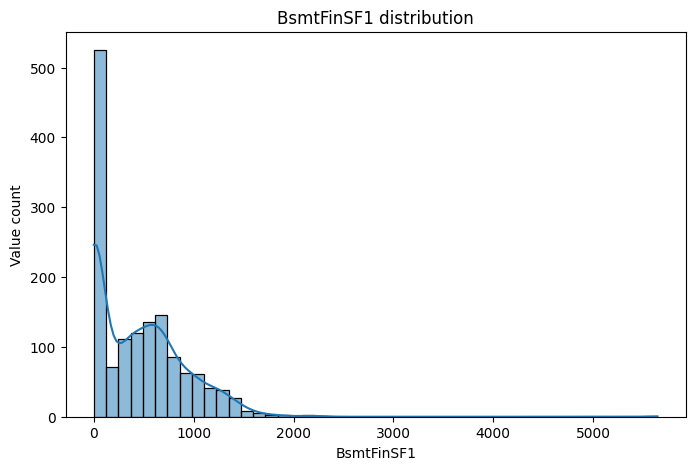

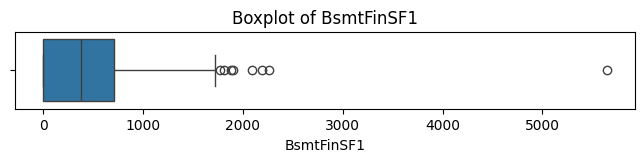

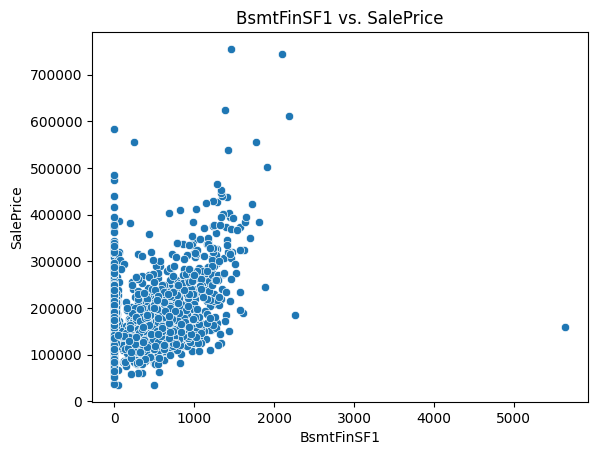

BsmtFinSF2:
count    1444.000000
mean       46.587258
std       161.688265
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1474.000000
Name: BsmtFinSF2, dtype: float64
Skewness: 4.258638956996601
Kurtosis: 20.11758747256749


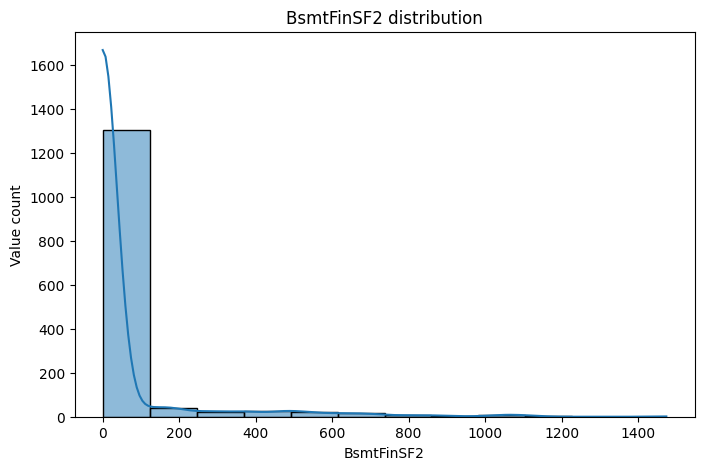

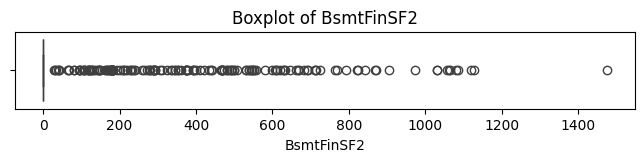

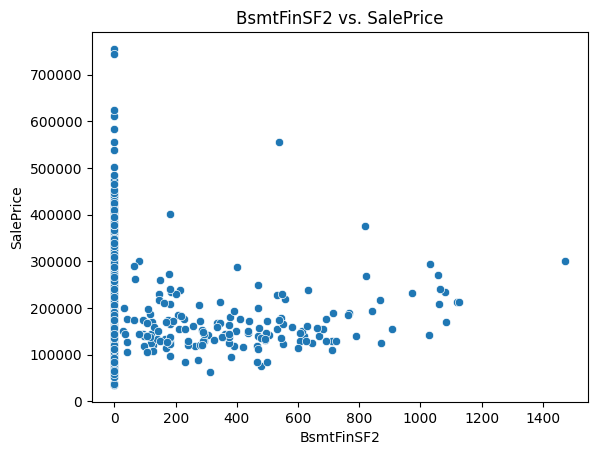

BsmtUnfSF:
count    1444.000000
mean      566.177978
std       442.232669
min         0.000000
25%       219.750000
50%       477.500000
75%       806.500000
max      2336.000000
Name: BsmtUnfSF, dtype: float64
Skewness: 0.9217158004573708
Kurtosis: 0.4783633651298178


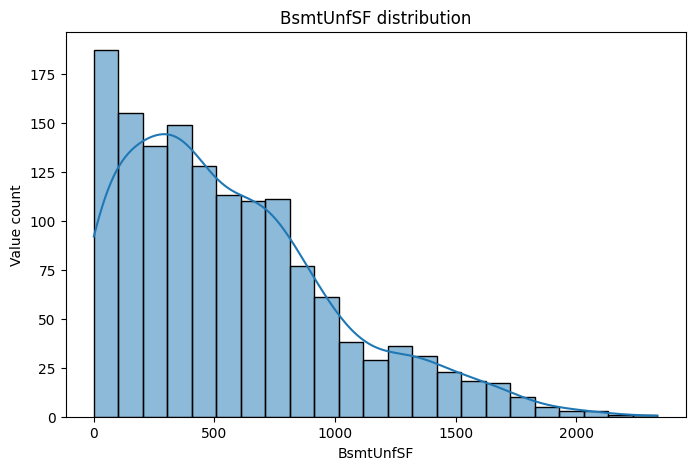

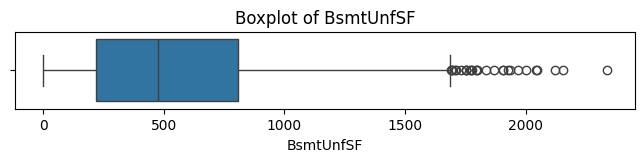

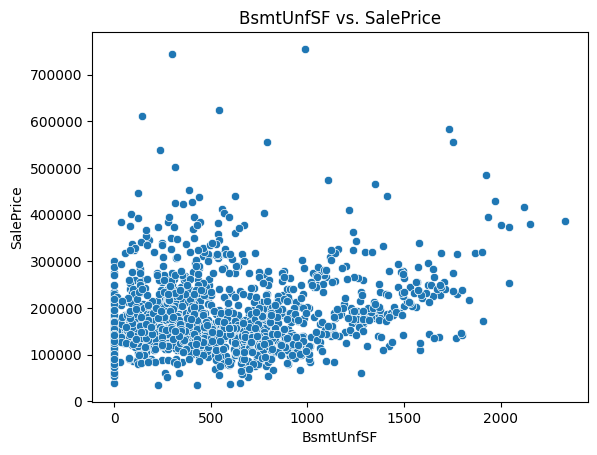

TotalBsmtSF:
count    1444.000000
mean     1054.831025
std       435.033747
min         0.000000
25%       794.000000
50%       991.000000
75%      1296.250000
max      6110.000000
Name: TotalBsmtSF, dtype: float64
Skewness: 1.4999197349436568
Kurtosis: 13.571347586820444


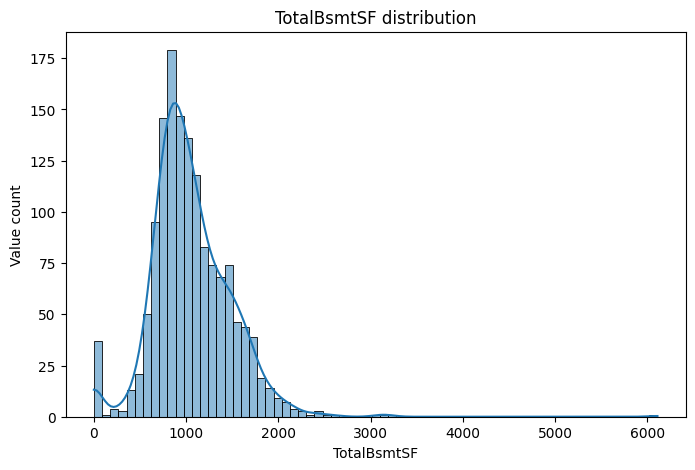

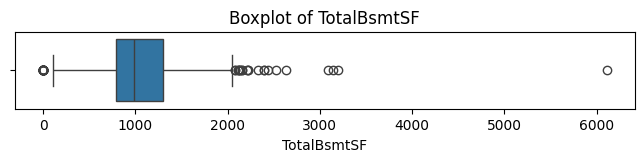

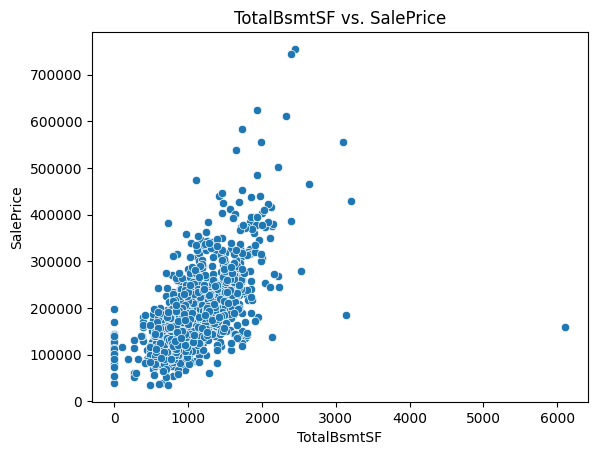

1stFlrSF:
count    1444.000000
mean     1161.533241
std       385.448285
min       334.000000
25%       882.000000
50%      1086.000000
75%      1391.000000
max      4692.000000
Name: 1stFlrSF, dtype: float64
Skewness: 1.3743013280801692
Kurtosis: 5.832652306053843


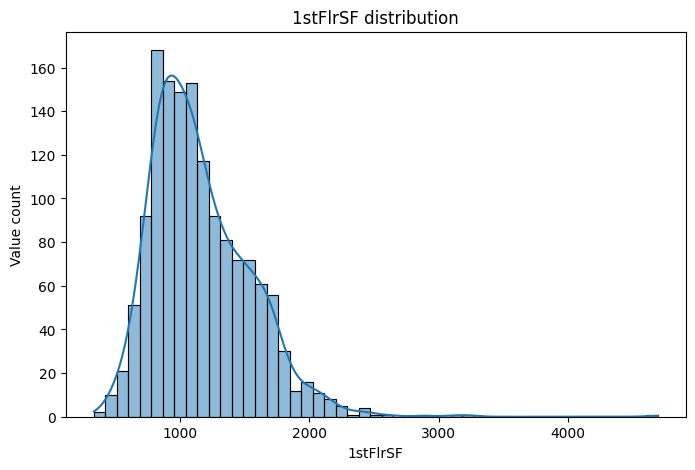

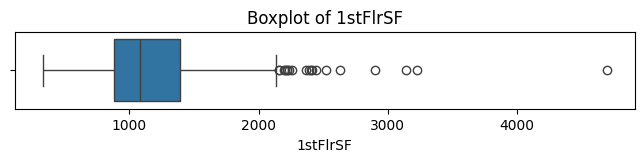

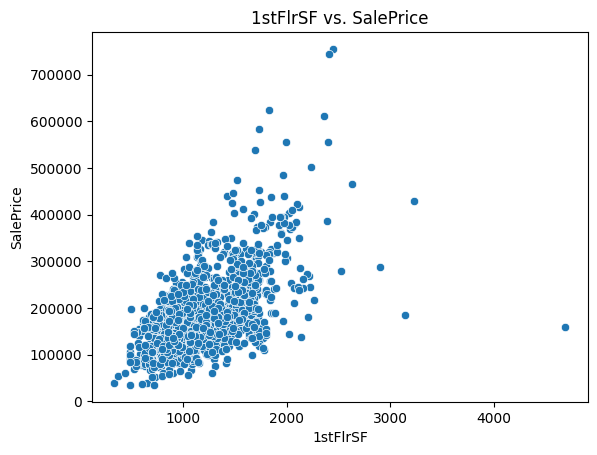

2ndFlrSF:
count    1444.000000
mean      346.969529
std       436.180644
min         0.000000
25%         0.000000
50%         0.000000
75%       728.000000
max      2065.000000
Name: 2ndFlrSF, dtype: float64
Skewness: 0.814092554182407
Kurtosis: -0.5446796179326139


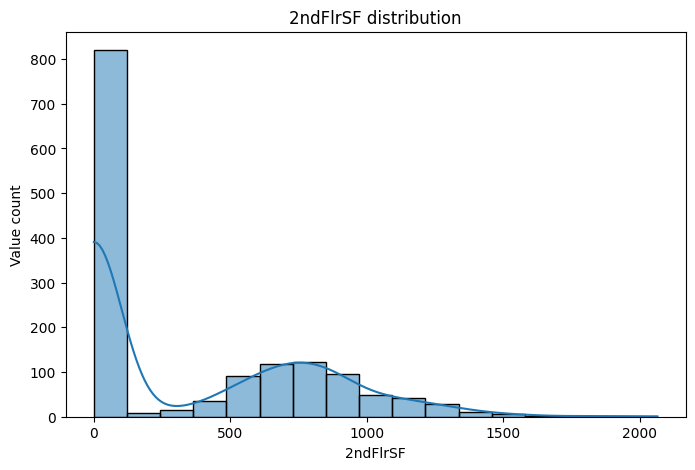

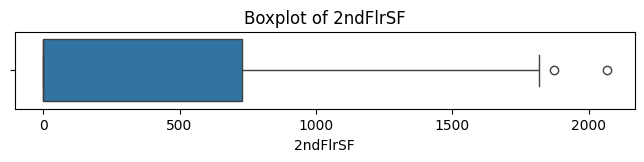

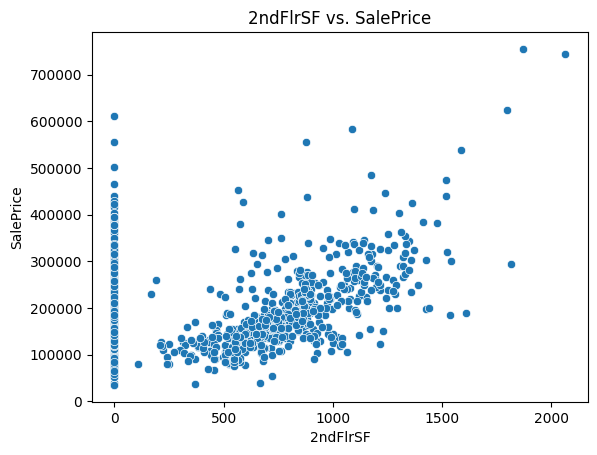

LowQualFinSF:
count    1444.000000
mean        5.748615
std        48.524320
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       572.000000
Name: LowQualFinSF, dtype: float64
Skewness: 9.102844491562932
Kurtosis: 84.65084907810103


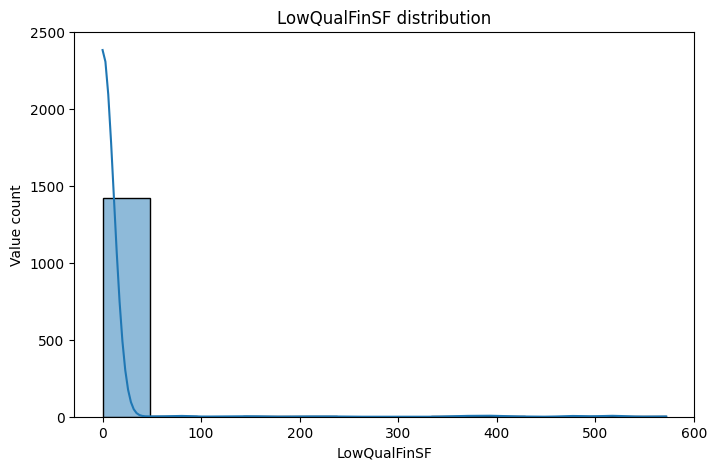

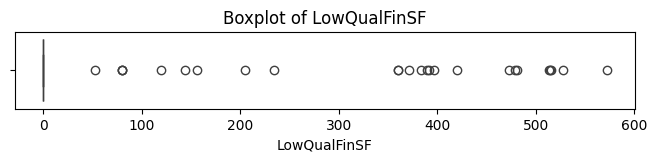

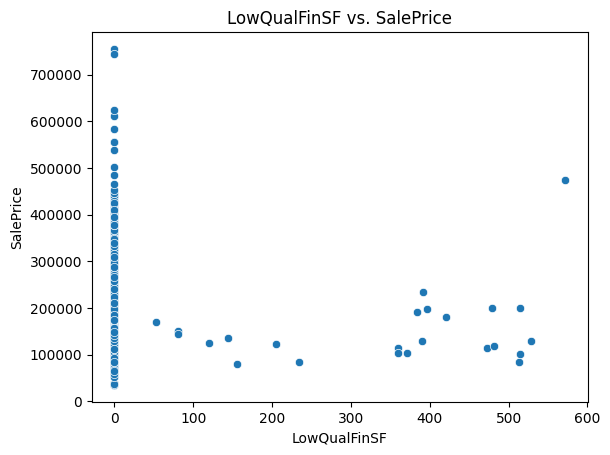

GrLivArea:
count    1444.000000
mean     1514.251385
std       525.651660
min       334.000000
25%      1128.000000
50%      1464.000000
75%      1776.000000
max      5642.000000
Name: GrLivArea, dtype: float64
Skewness: 1.3767872769871408
Kurtosis: 4.957680535043403


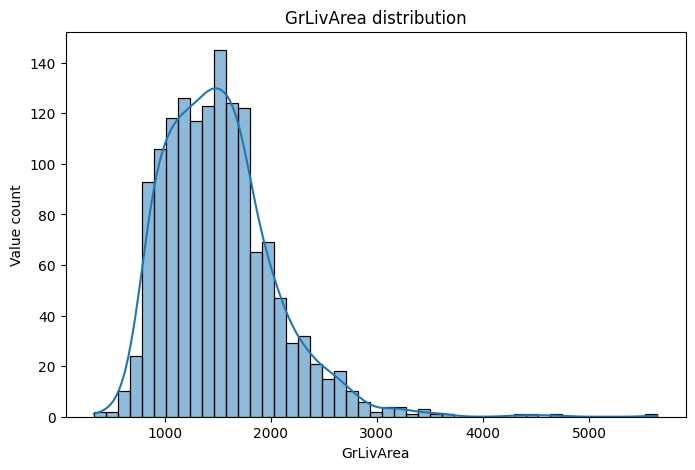

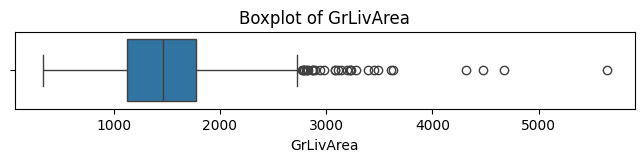

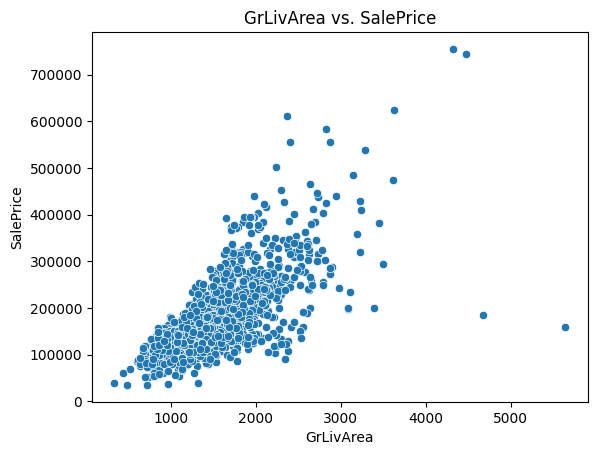

BsmtFullBath:
count    1444.000000
mean        0.424515
std         0.519056
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         3.000000
Name: BsmtFullBath, dtype: float64
Skewness: 0.6024868065855508
Kurtosis: -0.8245345126782531


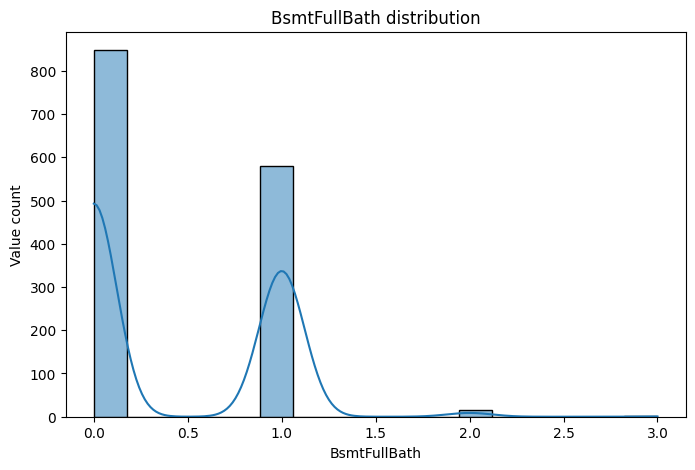

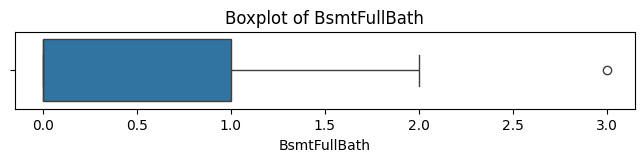

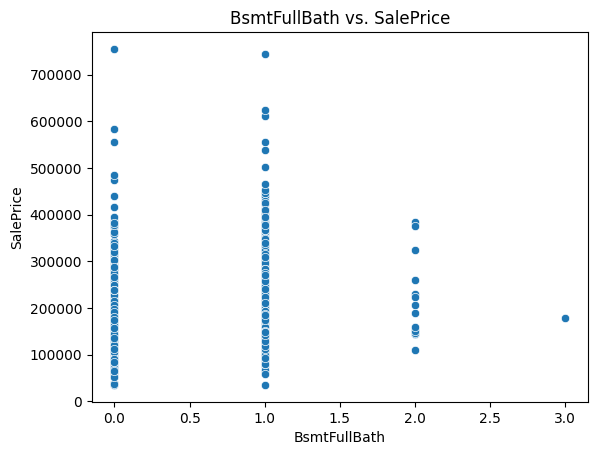

BsmtHalfBath:
count    1444.000000
mean        0.058172
std         0.239995
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: BsmtHalfBath, dtype: float64
Skewness: 4.077020518090507
Kurtosis: 16.165887665347665


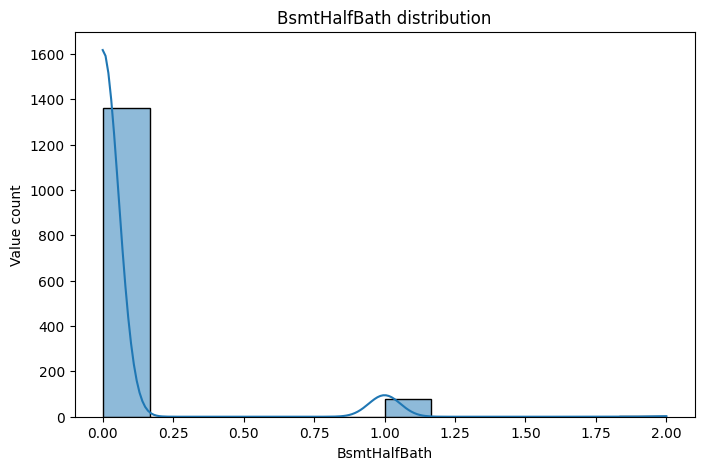

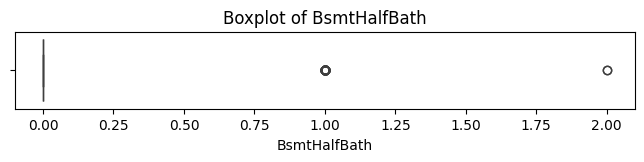

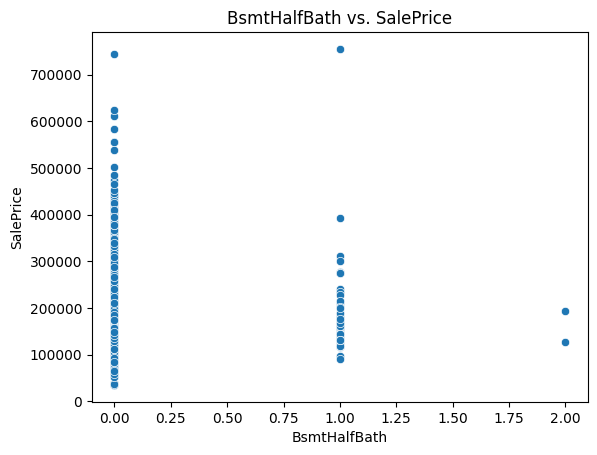

FullBath:
count    1444.000000
mean        1.562327
std         0.550556
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: FullBath, dtype: float64
Skewness: 0.0389514261822449
Kurtosis: -0.8650503813990613


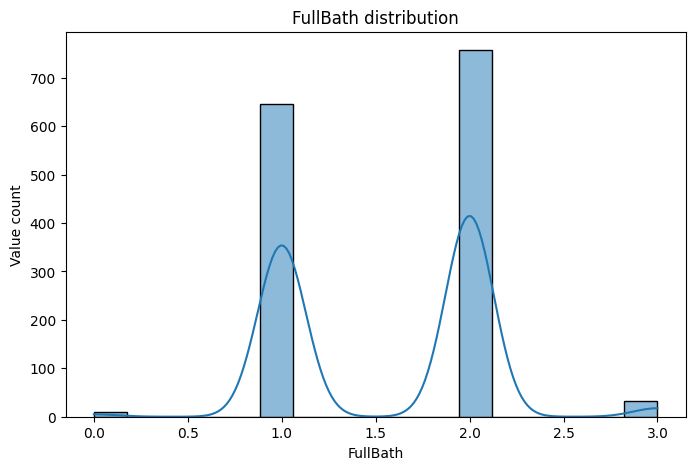

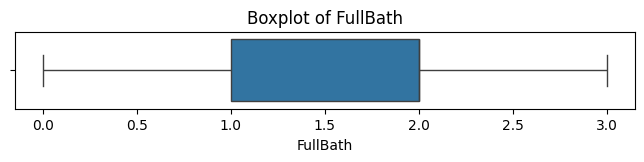

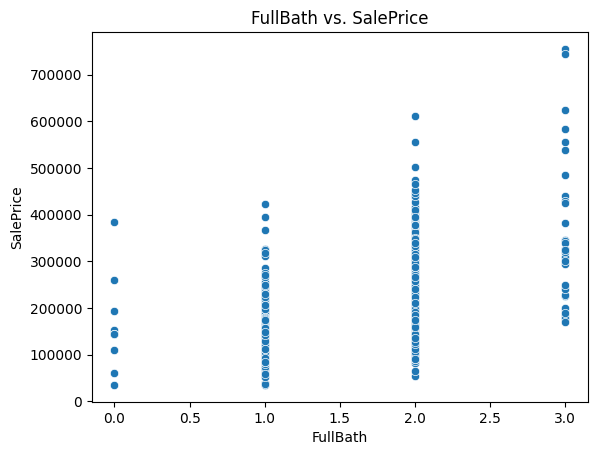

HalfBath:
count    1444.000000
mean        0.380886
std         0.501220
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: HalfBath, dtype: float64
Skewness: 0.6722676144490067
Kurtosis: -1.1073403548358687


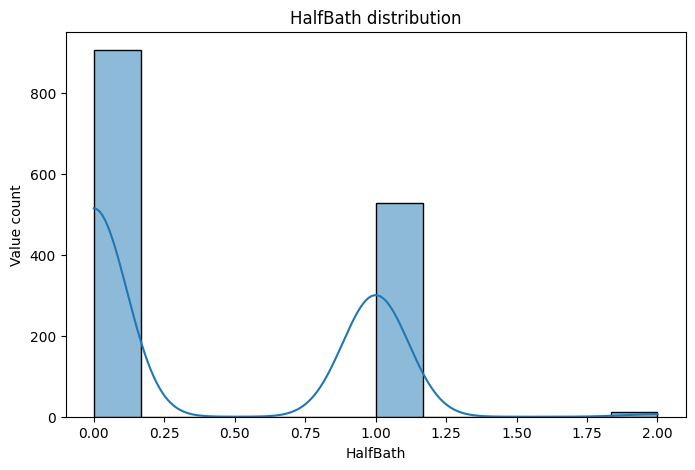

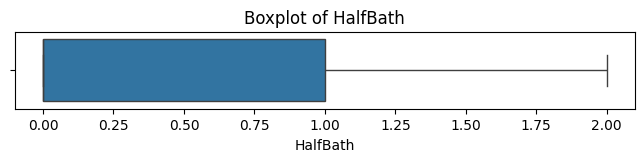

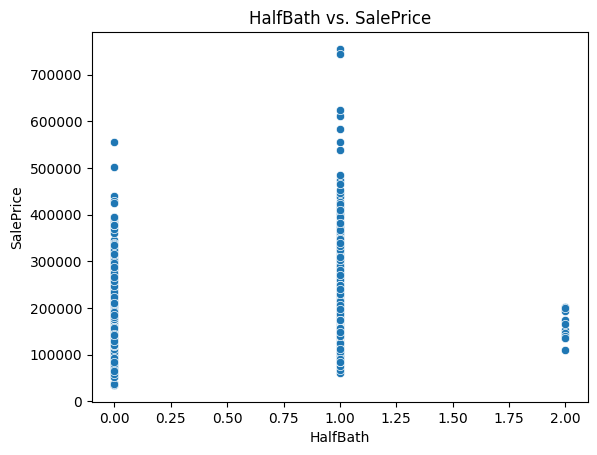

BedroomAbvGr:
count    1444.000000
mean        2.867036
std         0.815847
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         8.000000
Name: BedroomAbvGr, dtype: float64
Skewness: 0.21791166644398033
Kurtosis: 2.2562845777519


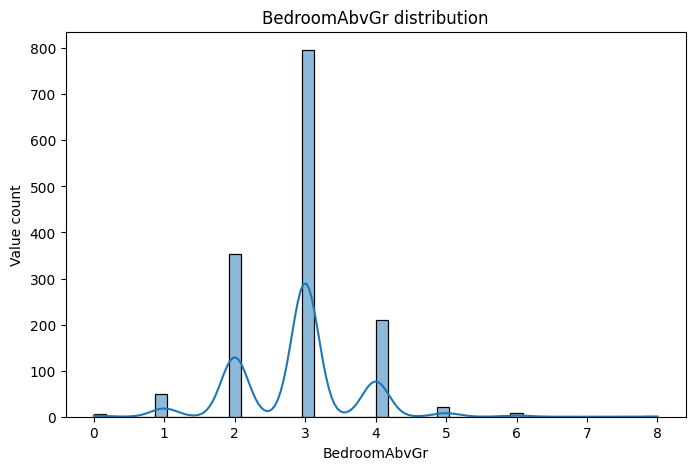

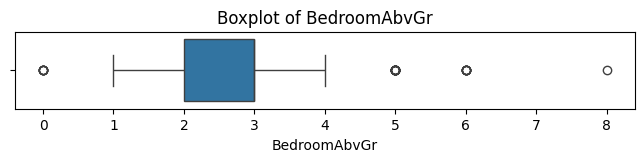

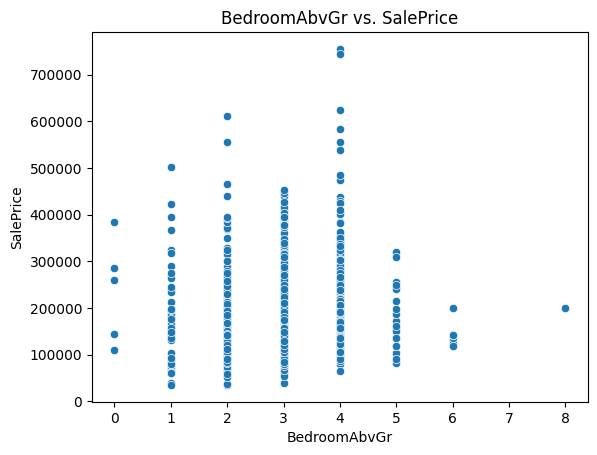

KitchenAbvGr:
count    1444.000000
mean        1.045706
std         0.218645
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: KitchenAbvGr, dtype: float64
Skewness: 4.541451695635739
Kurtosis: 22.152275401341083


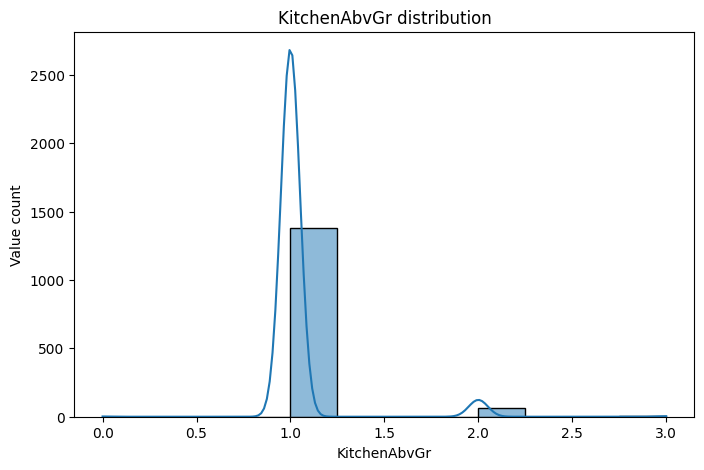

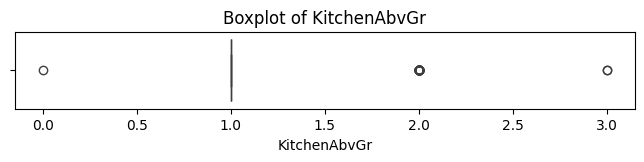

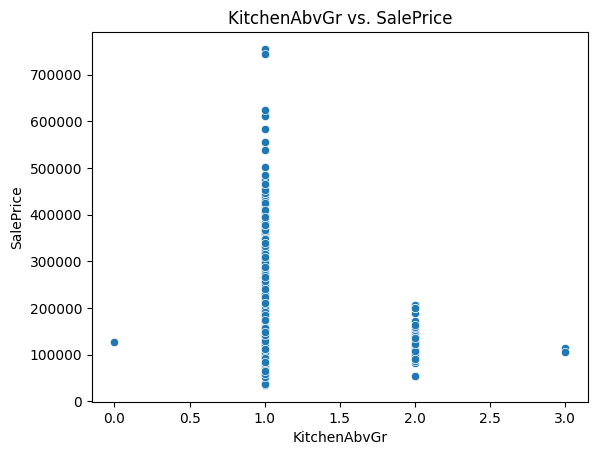

TotRmsAbvGrd:
count    1444.000000
mean        6.514543
std         1.622925
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        14.000000
Name: TotRmsAbvGrd, dtype: float64
Skewness: 0.6674720624835754
Kurtosis: 0.852721834020087


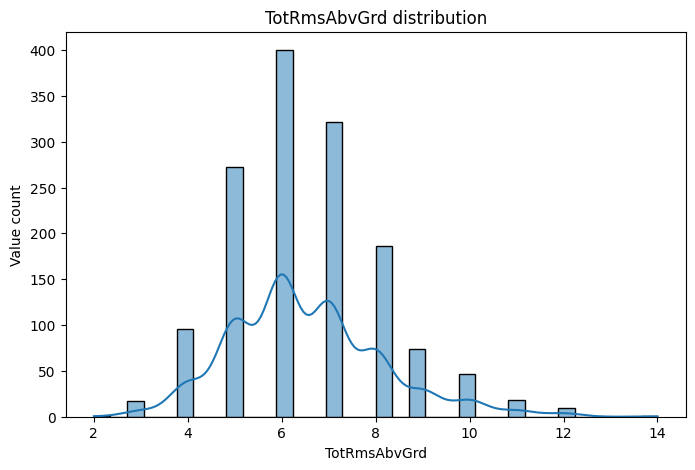

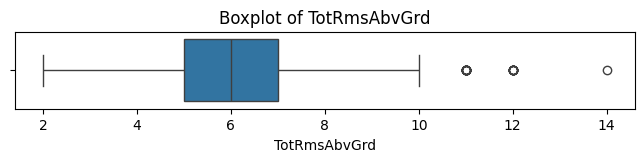

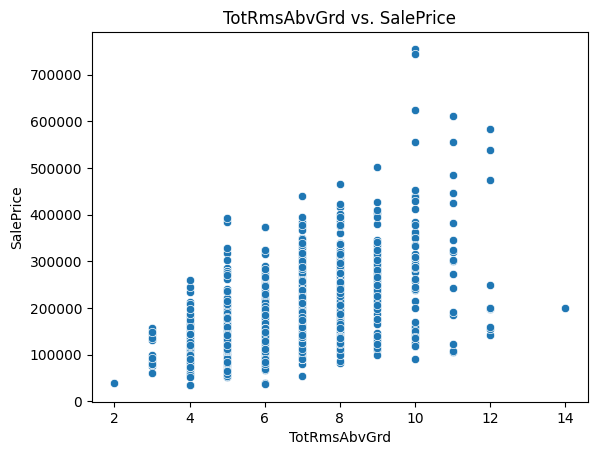

Fireplaces:
count    1444.000000
mean        0.612188
std         0.644194
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: Fireplaces, dtype: float64
Skewness: 0.6513512427417063
Kurtosis: -0.20918004690903924


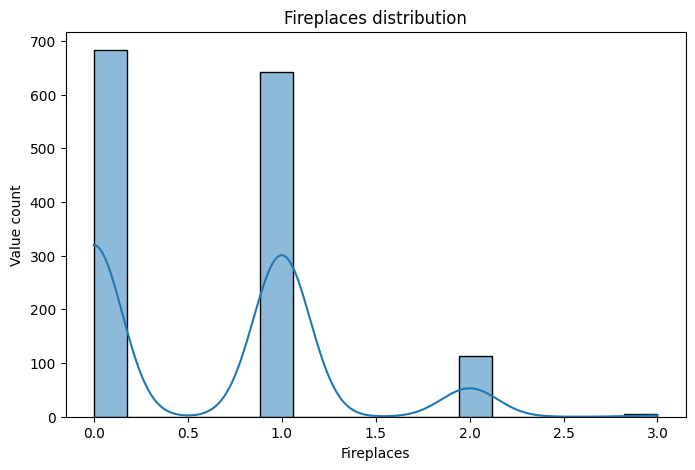

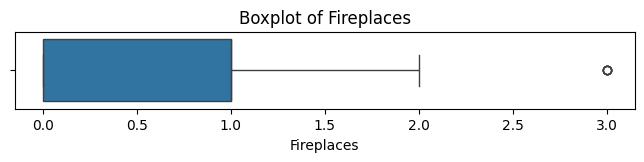

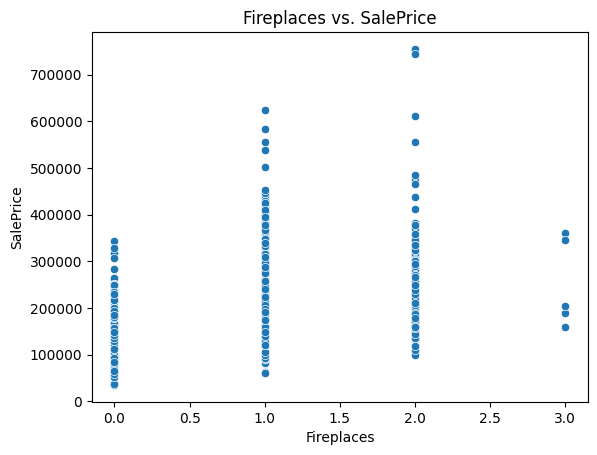

GarageYrBlt:
count    1444.000000
mean     1867.309557
std       456.242143
min        -1.000000
25%      1958.000000
50%      1977.000000
75%      2001.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64
Skewness: -3.8443853639404653
Kurtosis: 12.848320694455598


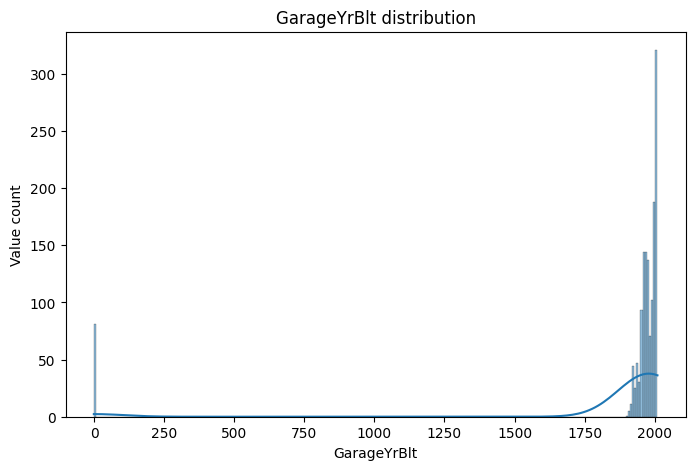

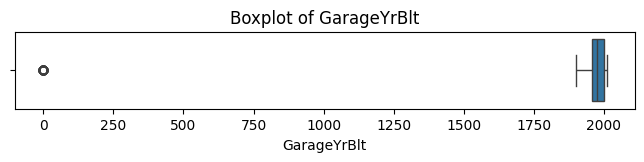

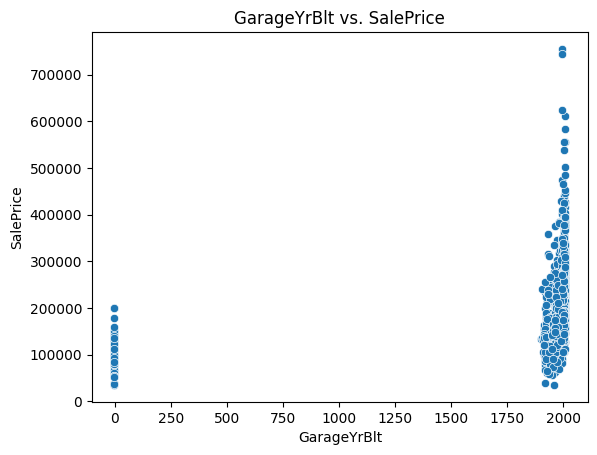

GarageCars:
count    1444.000000
mean        1.765235
std         0.748949
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: GarageCars, dtype: float64
Skewness: -0.34070101278591675
Kurtosis: 0.2124004005417679


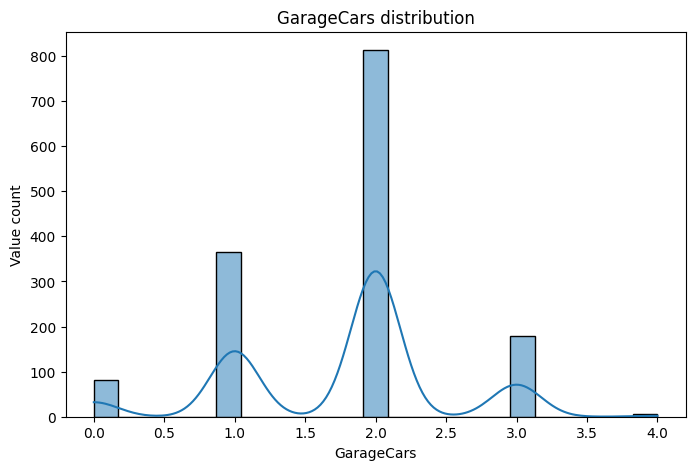

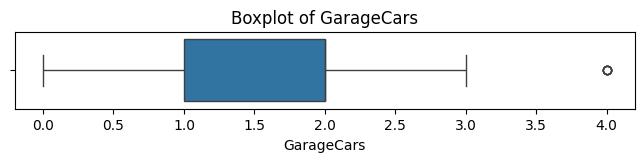

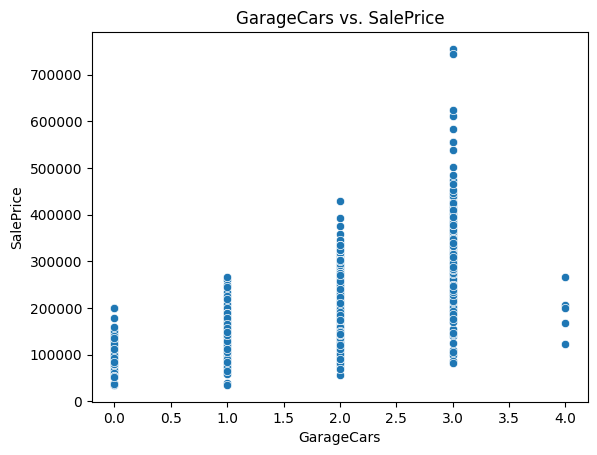

GarageArea:
count    1444.000000
mean      472.486150
std       214.203685
min         0.000000
25%       329.500000
50%       478.500000
75%       576.000000
max      1418.000000
Name: GarageArea, dtype: float64
Skewness: 0.18044576188997594
Kurtosis: 0.9155266627695009


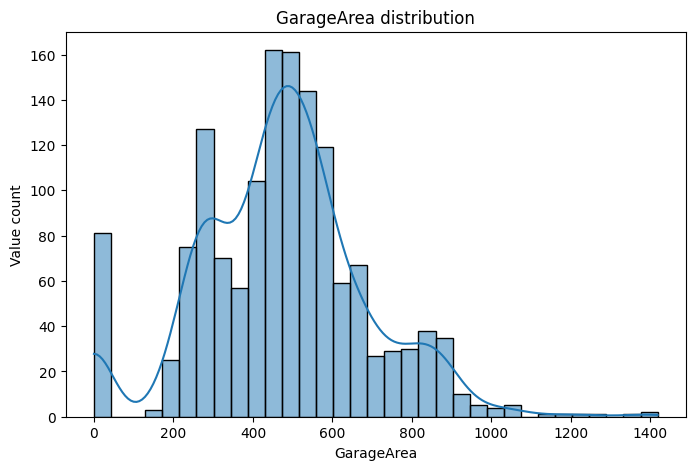

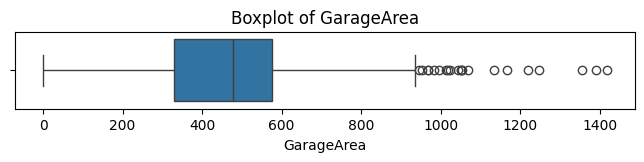

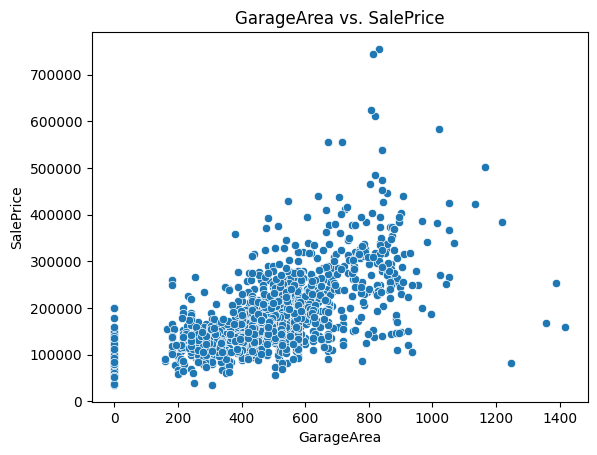

WoodDeckSF:
count    1444.000000
mean       94.566482
std       125.619707
min         0.000000
25%         0.000000
50%         0.000000
75%       168.000000
max       857.000000
Name: WoodDeckSF, dtype: float64
Skewness: 1.5399555287455204
Kurtosis: 2.9829045434637815


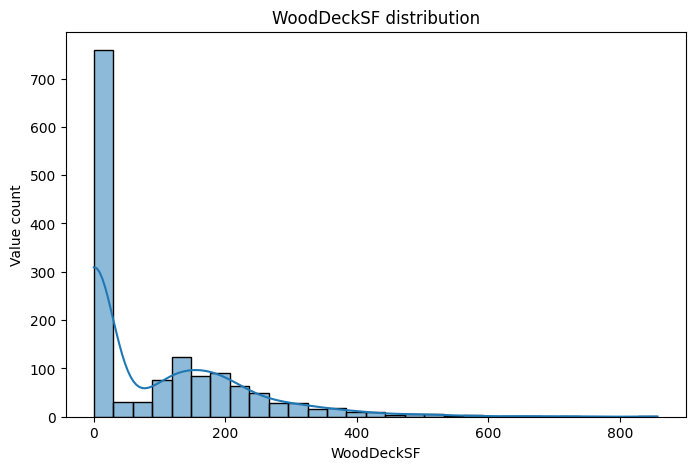

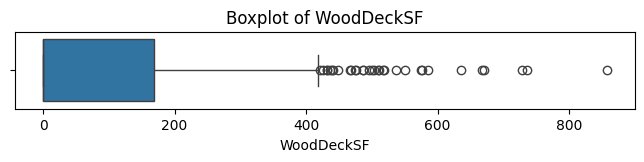

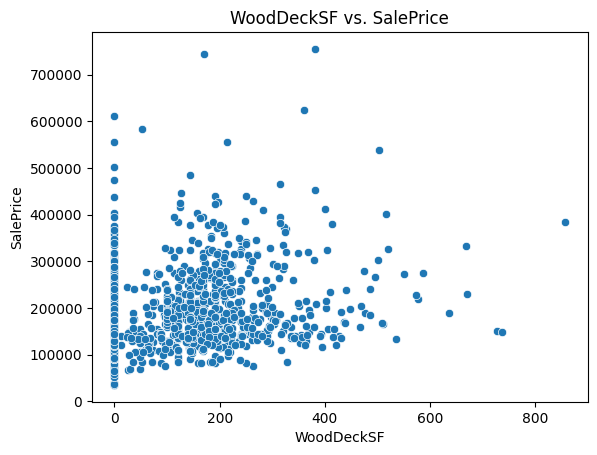

OpenPorchSF:
count    1444.000000
mean       46.545014
std        66.157669
min         0.000000
25%         0.000000
50%        25.000000
75%        68.000000
max       547.000000
Name: OpenPorchSF, dtype: float64
Skewness: 2.3810558410729974
Kurtosis: 8.634198698439874


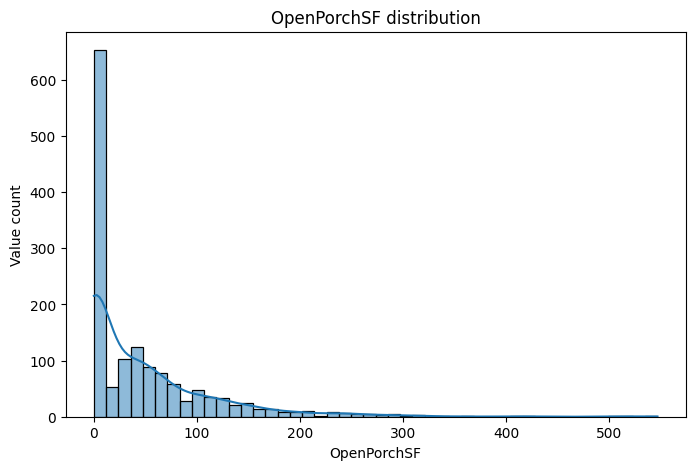

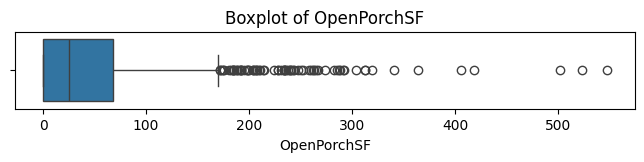

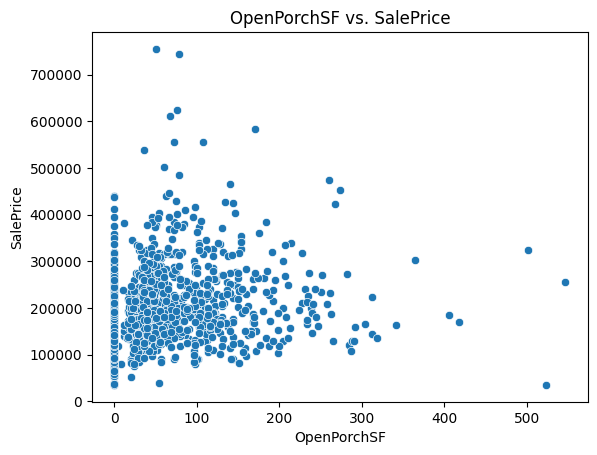

EnclosedPorch:
count    1444.000000
mean       21.958449
std        61.154177
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       552.000000
Name: EnclosedPorch, dtype: float64
Skewness: 3.096272271841593
Kurtosis: 10.486756430045071


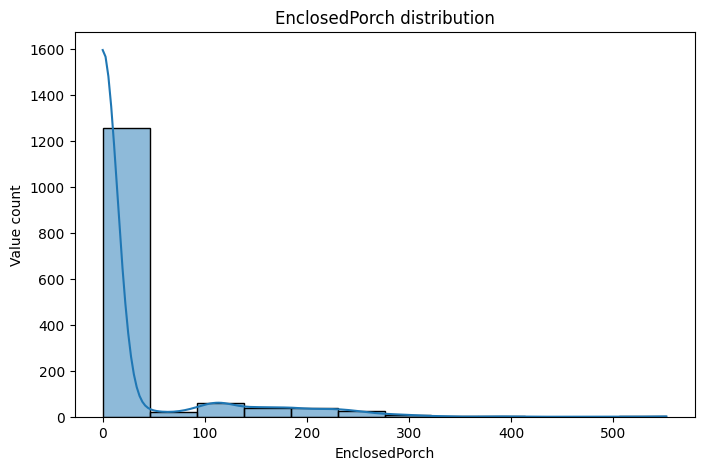

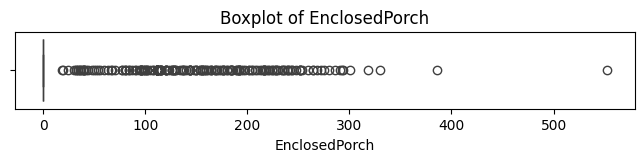

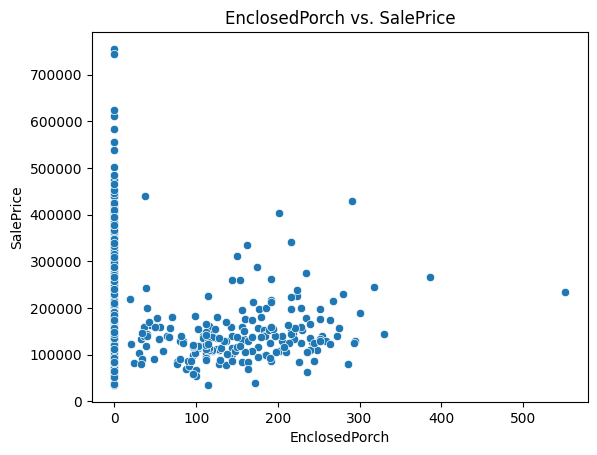

3SsnPorch:
count    1444.000000
mean        3.447368
std        29.477207
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       508.000000
Name: 3SsnPorch, dtype: float64
Skewness: 10.246313836127317
Kurtosis: 122.26382374747925


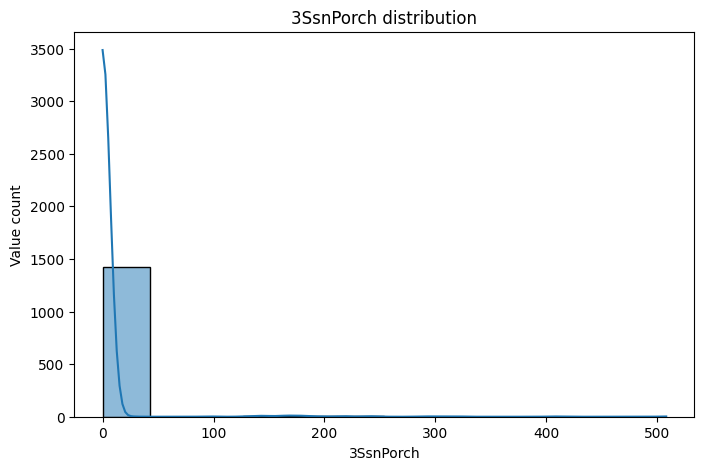

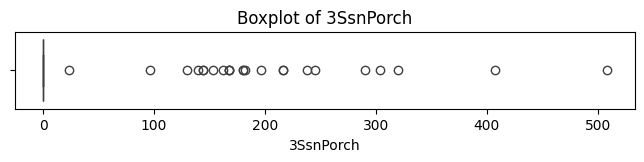

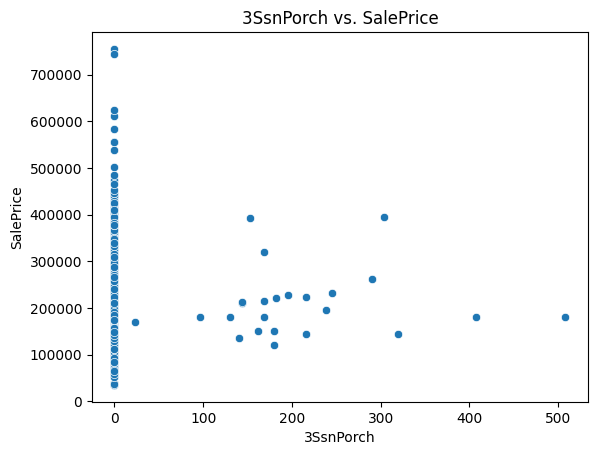

ScreenPorch:
count    1444.000000
mean       15.227839
std        56.042999
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       480.000000
Name: ScreenPorch, dtype: float64
Skewness: 4.095860644966166
Kurtosis: 18.190117965009748


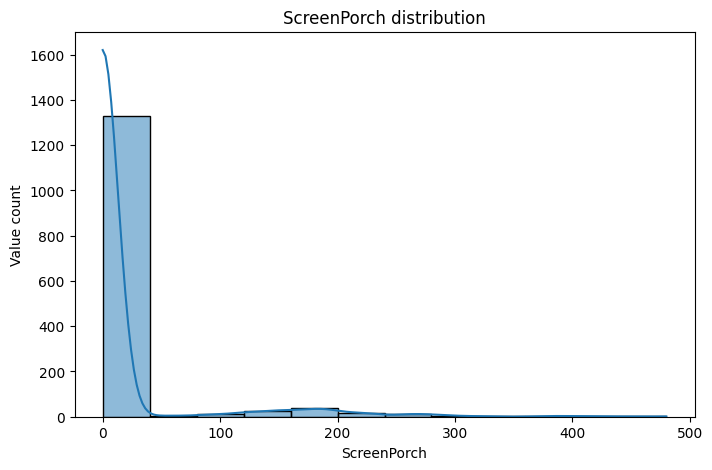

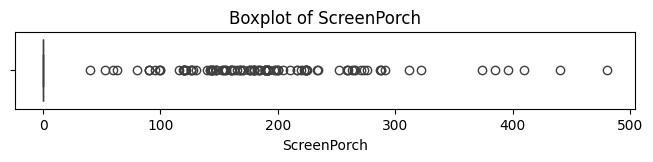

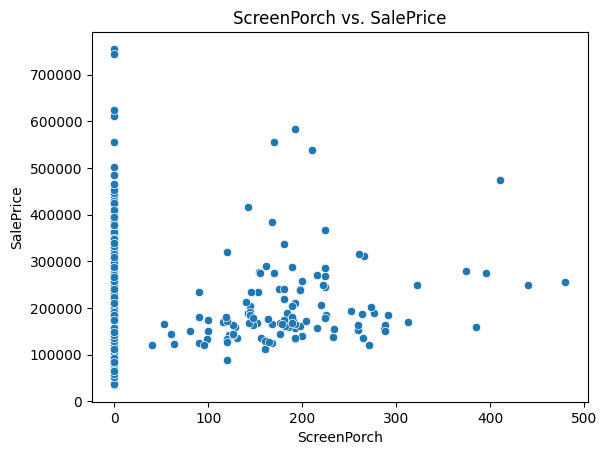

PoolArea:
count    1444.000000
mean        2.789474
std        40.398380
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       738.000000
Name: PoolArea, dtype: float64
Skewness: 14.74595348134355
Kurtosis: 220.77585639494947


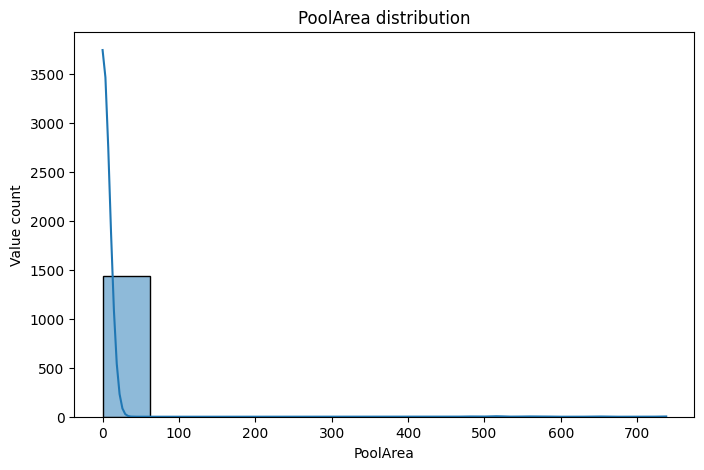

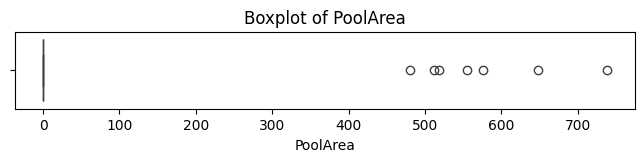

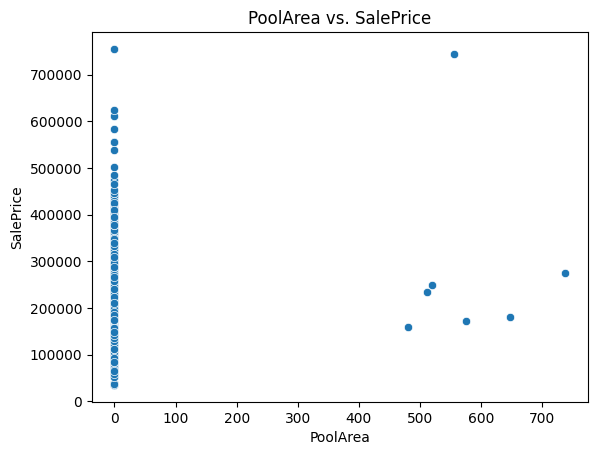

MiscVal:
count     1444.000000
mean        38.222992
std        448.974373
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      15500.000000
Name: MiscVal, dtype: float64
Skewness: 29.112311619525585
Kurtosis: 980.1260170046817


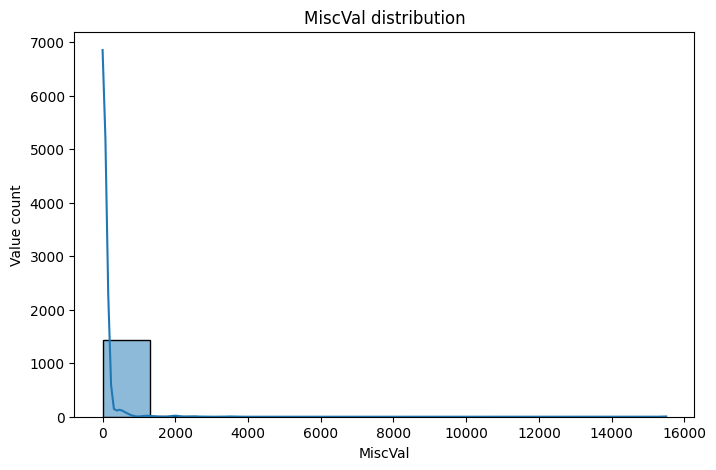

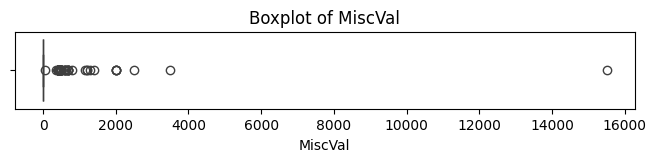

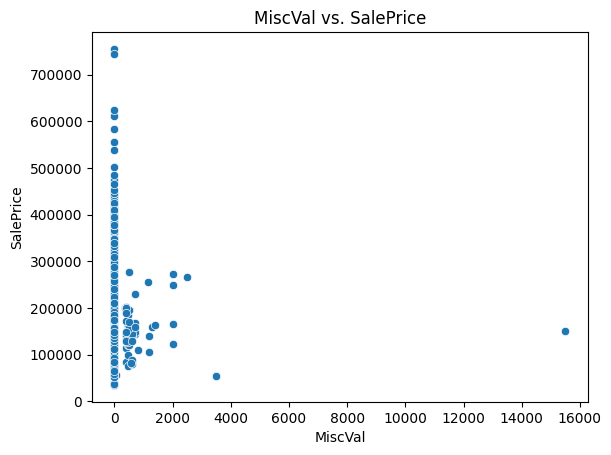

YrSold:
count    1444.000000
mean     2007.817867
std         1.329629
min      2006.000000
25%      2007.000000
50%      2008.000000
75%      2009.000000
max      2010.000000
Name: YrSold, dtype: float64
Skewness: 0.09377392268269064
Kurtosis: -1.1936603443218439


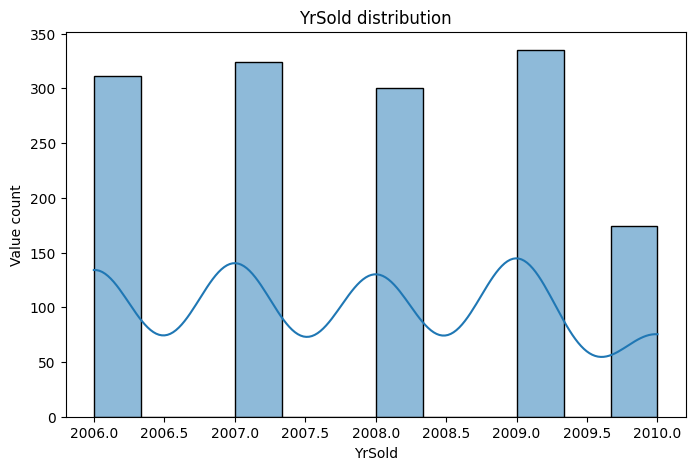

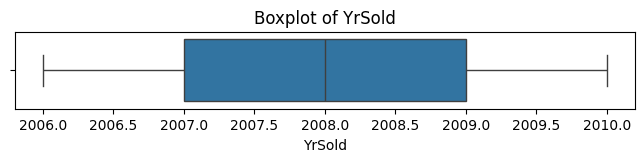

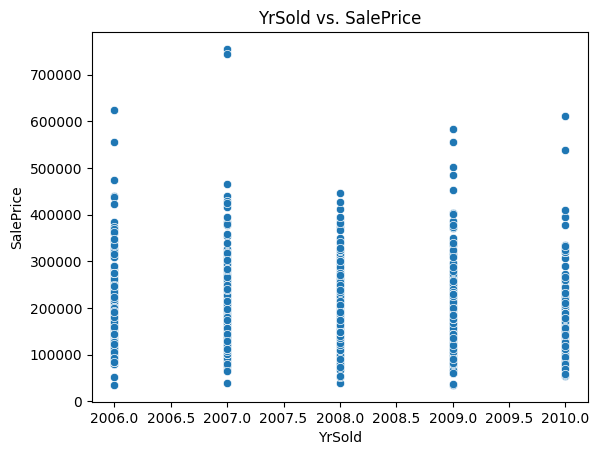

In [67]:
for col in num_features:
    print(f'{col}:')
    print(traindf[col].describe())
    print(f'Skewness: {traindf[col].skew()}')
    print(f'Kurtosis: {traindf[col].kurt()}')
    # Histogram with KDE
    plt.figure(figsize=(8, 5))
    sns.histplot(traindf[col], kde=True)
    plt.title(f'{col} distribution')
    plt.xlabel(col)
    plt.ylabel('Value count')
    plt.show()
    # Boxplot
    plt.figure(figsize=(8, 1))
    sns.boxplot(x=traindf[col])
    plt.title(f'Boxplot of {col}')
    plt.show()
    # Scatter plot against SalePrice
    sns.scatterplot(data=traindf, x=col, y=traindf['SalePrice'])
    plt.title(f'{col} vs. SalePrice')
    plt.show()

We have detected some features that could benefit from a log-transformation but we need to check how that transformation affects its distribution before we flag them as candidates:


Feature: LotFrontage
Original:
count    1444.000000
mean       70.193213
std        22.496217
min        21.000000
25%        60.000000
50%        70.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64
Skewness: 2.2178925971882673
Kurtosis: 20.082318344646424

Log-transformed:
count    1444.000000
mean        4.200650
std         0.330911
min         3.044522
25%         4.094345
50%         4.248495
75%         4.382027
max         5.746203
Name: LotFrontage, dtype: float64
Skewness: -0.9434882393543293
Kurtosis: 3.1828918340190486


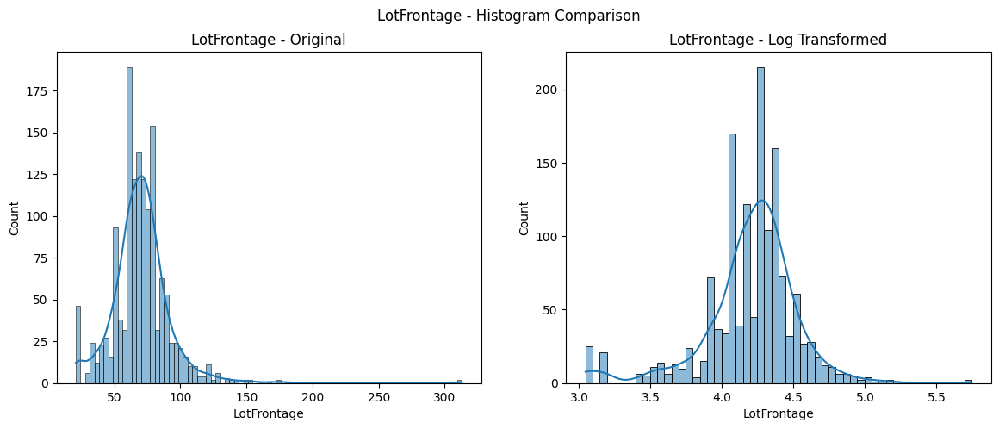

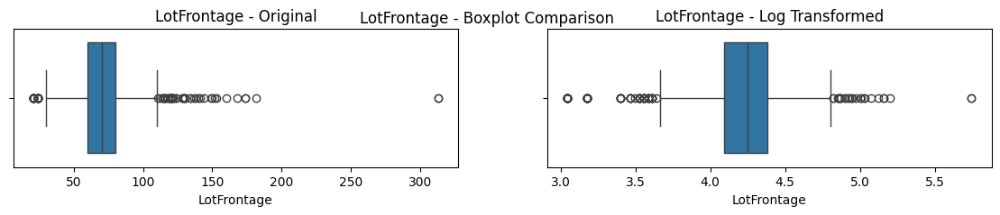

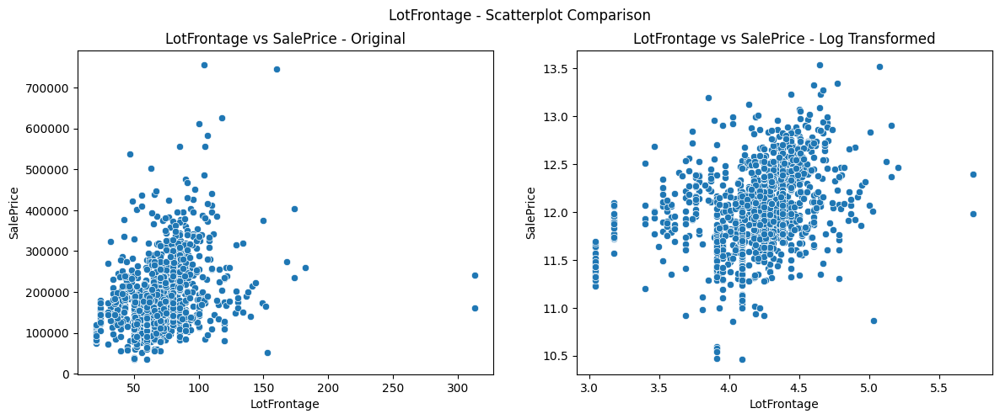


Feature: LotArea
Original:
count      1444.000000
mean      10501.068560
std       10013.993035
min        1300.000000
25%        7500.000000
50%        9458.500000
75%       11600.000000
max      215245.000000
Name: LotArea, dtype: float64
Skewness: 12.219561716039479
Kurtosis: 202.88662125734743

Log-transformed:
count    1444.000000
mean        9.108864
std         0.518050
min         7.170120
25%         8.922658
50%         9.154669
75%         9.358760
max        12.279532
Name: LotArea, dtype: float64
Skewness: -0.13904032175211067
Kurtosis: 4.727901384441822


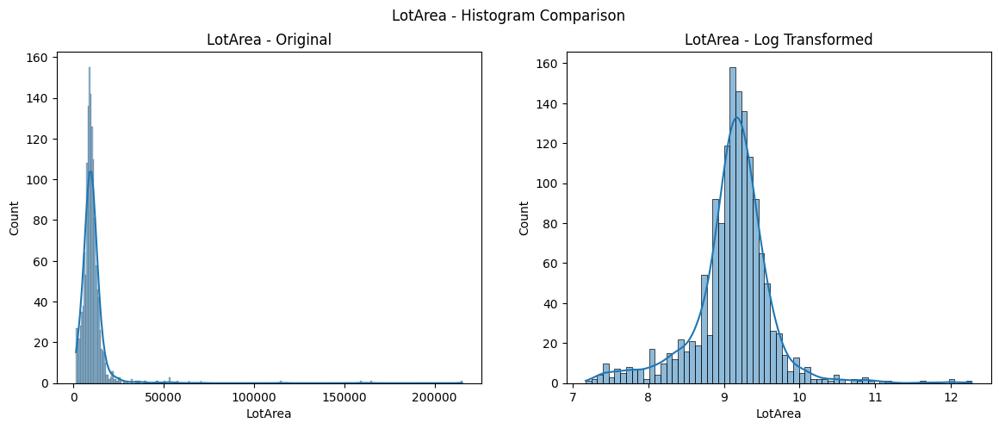

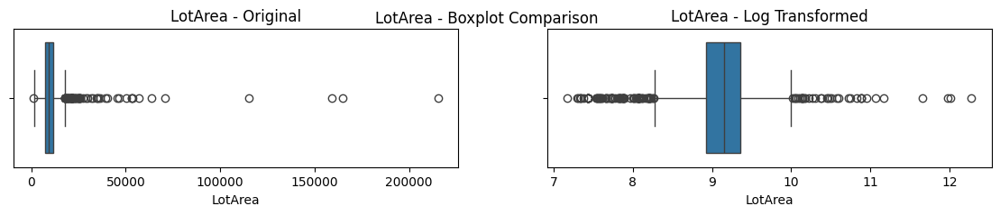

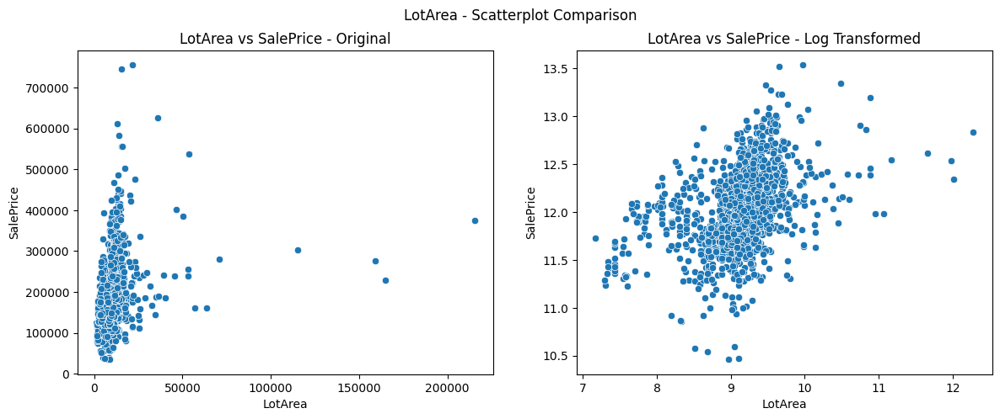


Feature: 1stFlrSF
Original:
count    1444.000000
mean     1161.533241
std       385.448285
min       334.000000
25%       882.000000
50%      1086.000000
75%      1391.000000
max      4692.000000
Name: 1stFlrSF, dtype: float64
Skewness: 1.3743013280801692
Kurtosis: 5.832652306053843

Log-transformed:
count    1444.000000
mean        7.006685
std         0.317481
min         5.811141
25%         6.782192
50%         6.990257
75%         7.237778
max         8.453614
Name: 1stFlrSF, dtype: float64
Skewness: 0.07092110774068303
Kurtosis: 0.14951683653653003


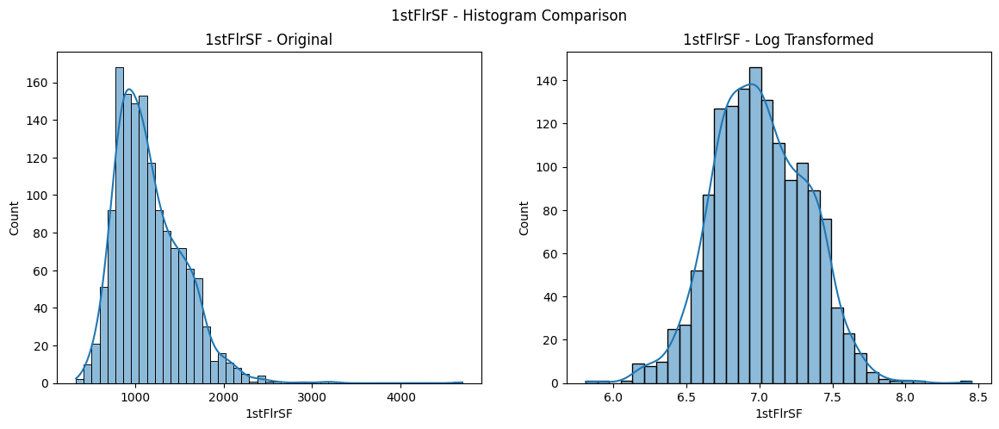

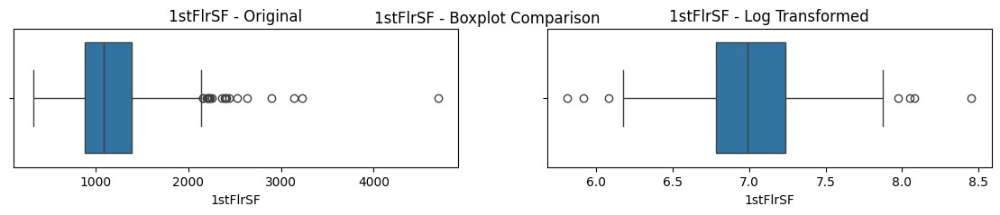

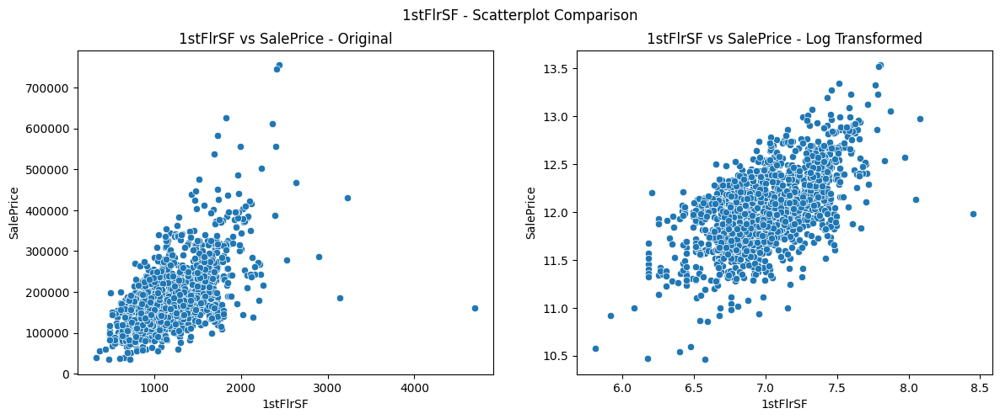


Feature: GrLivArea
Original:
count    1444.000000
mean     1514.251385
std       525.651660
min       334.000000
25%      1128.000000
50%      1464.000000
75%      1776.000000
max      5642.000000
Name: GrLivArea, dtype: float64
Skewness: 1.3767872769871408
Kurtosis: 4.957680535043403

Log-transformed:
count    1444.000000
mean        7.266912
std         0.333684
min         5.811141
25%         7.028201
50%         7.288928
75%         7.482119
max         8.637994
Name: GrLivArea, dtype: float64
Skewness: -0.004973956642449581
Kurtosis: 0.29198260312066227


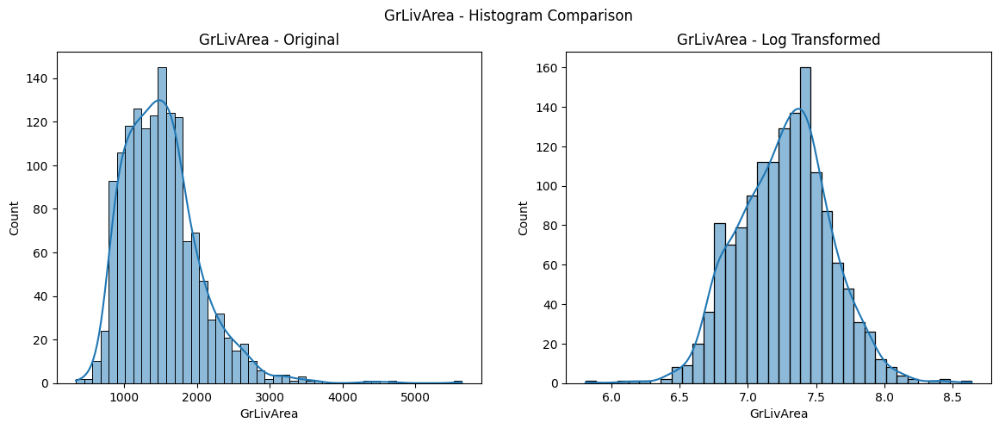

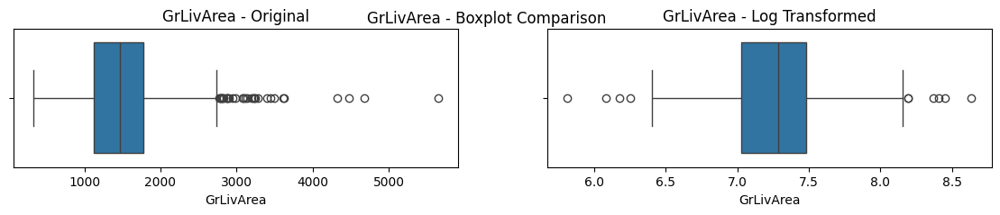

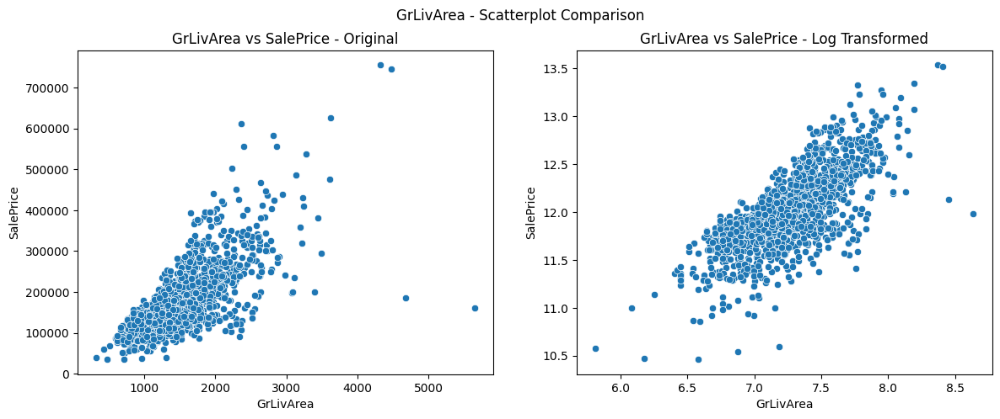


Feature: BsmtFinSF1
Original:
count    1444.000000
mean      442.065789
std       455.624075
min         0.000000
25%         0.000000
50%       381.000000
75%       706.500000
max      5644.000000
Name: BsmtFinSF1, dtype: float64
Skewness: 1.707377063406272
Kurtosis: 11.328594071907249

Log-transformed:
count    1444.000000
mean        4.225800
std         2.990483
min         0.000000
25%         0.000000
50%         5.945421
75%         6.561737
max         8.638525
Name: BsmtFinSF1, dtype: float64
Skewness: -0.6169857253056573
Kurtosis: -1.4777176169890107


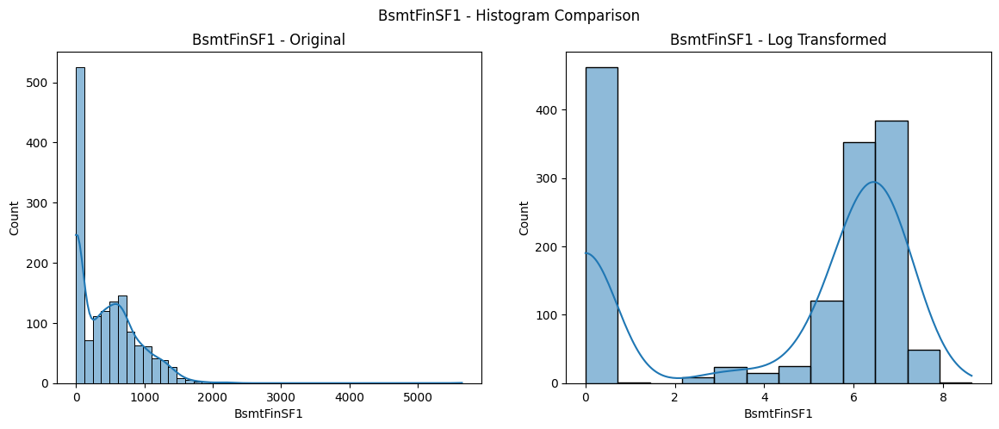

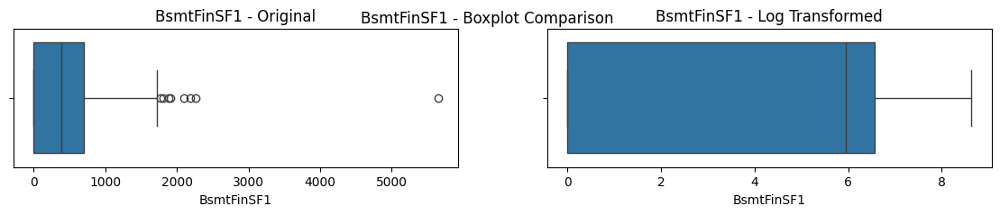

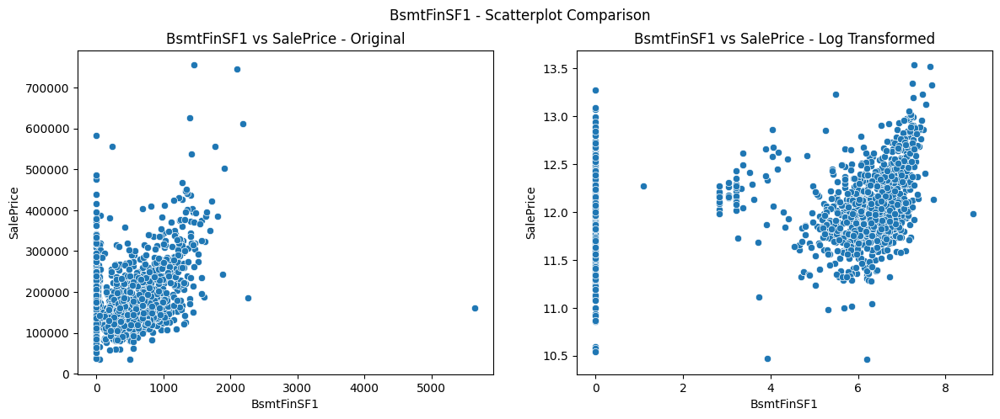


Feature: TotalBsmtSF
Original:
count    1444.000000
mean     1054.831025
std       435.033747
min         0.000000
25%       794.000000
50%       991.000000
75%      1296.250000
max      6110.000000
Name: TotalBsmtSF, dtype: float64
Skewness: 1.4999197349436568
Kurtosis: 13.571347586820444

Log-transformed:
count    1444.000000
mean        6.747204
std         1.150536
min         0.000000
25%         6.678342
50%         6.899723
75%         7.168002
max         8.717846
Name: TotalBsmtSF, dtype: float64
Skewness: -5.13951863001785
Kurtosis: 27.50171796923843


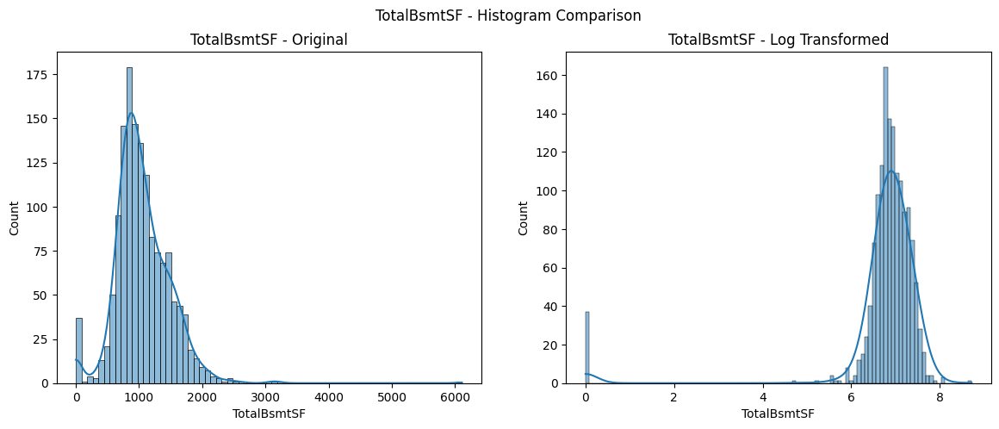

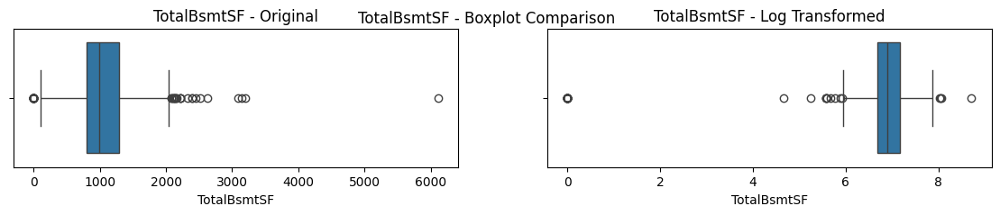

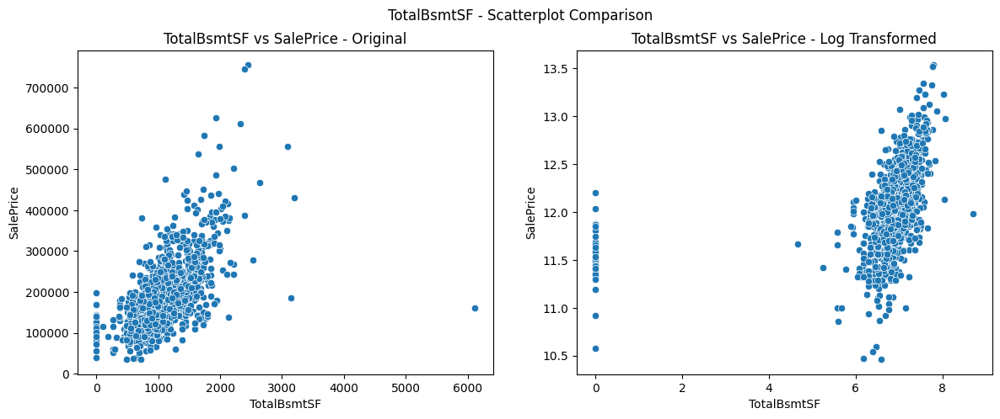

In [68]:
for col in ['LotFrontage', 'LotArea', '1stFlrSF', 'GrLivArea']:
    # Prepare data
    original = traindf[col]
    log_transformed = np.log(traindf[col])

    # Summary stats
    print(f'\nFeature: {col}')
    print('Original:')
    print(original.describe())
    print(f'Skewness: {original.skew()}')
    print(f'Kurtosis: {original.kurt()}')
    
    print('\nLog-transformed:')
    print(log_transformed.describe())
    print(f'Skewness: {log_transformed.skew()}')
    print(f'Kurtosis: {log_transformed.kurt()}')

    # Histogram comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.histplot(original, kde=True, ax=axes[0])
    axes[0].set_title(f'{col} - Original')
    sns.histplot(log_transformed, kde=True, ax=axes[1])
    axes[1].set_title(f'{col} - Log Transformed')
    plt.suptitle(f'{col} - Histogram Comparison')
    plt.show()

    # Boxplot comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 2))
    sns.boxplot(x=original, ax=axes[0])
    axes[0].set_title(f'{col} - Original')
    sns.boxplot(x=log_transformed, ax=axes[1])
    axes[1].set_title(f'{col} - Log Transformed')
    plt.suptitle(f'{col} - Boxplot Comparison')
    plt.show()

    # Scatterplot comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.scatterplot(x=original, y=traindf['SalePrice'], ax=axes[0])
    axes[0].set_title(f'{col} vs SalePrice - Original')
    sns.scatterplot(x=log_transformed, y=np.log(traindf['SalePrice']), ax=axes[1])
    axes[1].set_title(f'{col} vs SalePrice - Log Transformed')
    plt.suptitle(f'{col} - Scatterplot Comparison')
    plt.show()

for col in ['BsmtFinSF1', 'TotalBsmtSF']:
    # Prepare data
    original = traindf[col]
    log_transformed = np.log1p(traindf[col])

    # Summary stats
    print(f'\nFeature: {col}')
    print('Original:')
    print(original.describe())
    print(f'Skewness: {original.skew()}')
    print(f'Kurtosis: {original.kurt()}')
    
    print('\nLog-transformed:')
    print(log_transformed.describe())
    print(f'Skewness: {log_transformed.skew()}')
    print(f'Kurtosis: {log_transformed.kurt()}')

    # Histogram comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.histplot(original, kde=True, ax=axes[0])
    axes[0].set_title(f'{col} - Original')
    sns.histplot(log_transformed, kde=True, ax=axes[1])
    axes[1].set_title(f'{col} - Log Transformed')
    plt.suptitle(f'{col} - Histogram Comparison')
    plt.show()

    # Boxplot comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 2))
    sns.boxplot(x=original, ax=axes[0])
    axes[0].set_title(f'{col} - Original')
    sns.boxplot(x=log_transformed, ax=axes[1])
    axes[1].set_title(f'{col} - Log Transformed')
    plt.suptitle(f'{col} - Boxplot Comparison')
    plt.show()

    # Scatterplot comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.scatterplot(x=original, y=traindf['SalePrice'], ax=axes[0])
    axes[0].set_title(f'{col} vs SalePrice - Original')
    sns.scatterplot(x=log_transformed, y=np.log(traindf['SalePrice']), ax=axes[1])
    axes[1].set_title(f'{col} vs SalePrice - Log Transformed')
    plt.suptitle(f'{col} - Scatterplot Comparison')
    plt.show()

Based on univariate distribution analysis (histogram/KDE) and scatterplots against target, we have flagged several numerical features as potential candidates for log transformation or removal.  


Log-transform candidates (log(x))  
Continuous, positively skewed (skew > 1), strictly positive:  
**LotFrontage**  
**LotArea**  
**1stFlrSF**  
**GrLivArea**  

Log-transform candidates (log1p(x))  
Continuous, positively skewed, ≥0, with moderate zero presence:  
**BsmtFinSF1**  
**TotalBsmtSF**  

Low-signal candidates (possible drop)  
Variables with no apparent trend in scatterplots, low variance or value density, and no obvious interaction potential:  
**MasVnrArea**  
**BsmtFinSF2**  
**LowQualFinSF**  
**OpenPorch**  
**EnclosedPorch**  
**3SsnPorch**  
**Screenporch**  
**MiscVal**  
**YrSold**

All of these are just candidates to consider, final decisions will depend on multivariate feature correlation, collinearity analysis, and model prediction importance.
Domain-linked feature groups (e.g., basement-related) will be considered holistically before transforming or dropping any component.

#### 2.4.2 Categorical variables

In [69]:
SalePrice_IQR = traindf['SalePrice'].quantile(0.75) - traindf['SalePrice'].quantile(0.25)

MSSubClass:
- 15 unique categories
Percentage of values in top category: 36.57%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.51


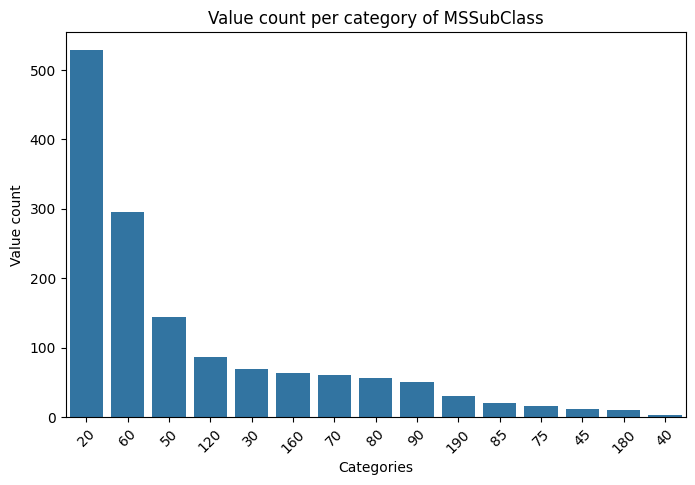

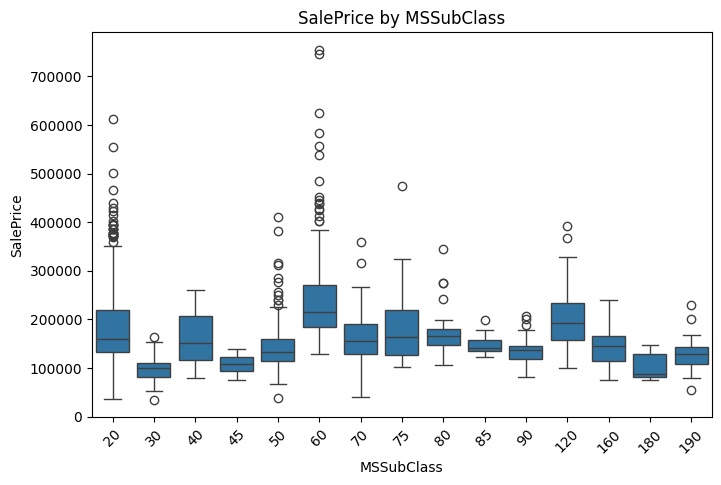

MSZoning:
- 5 unique categories
Percentage of values in top category: 78.81%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.58


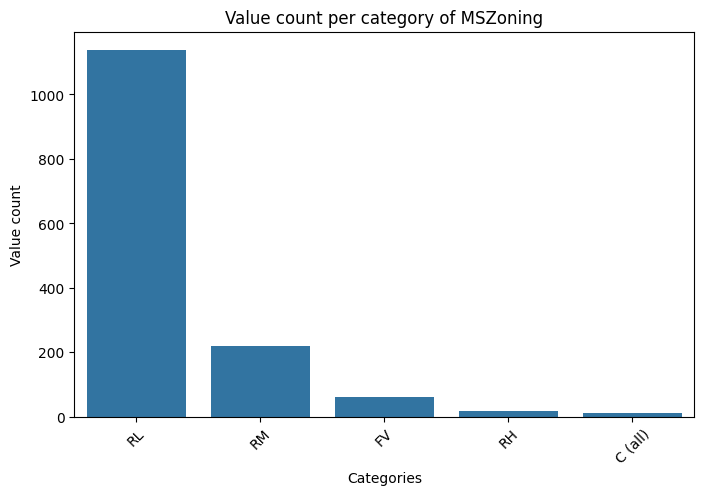

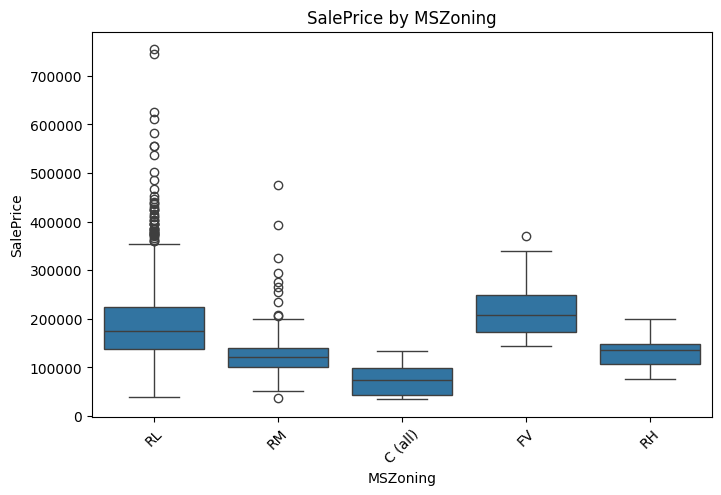

Street:
- 2 unique categories
Percentage of values in top category: 99.58%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.58


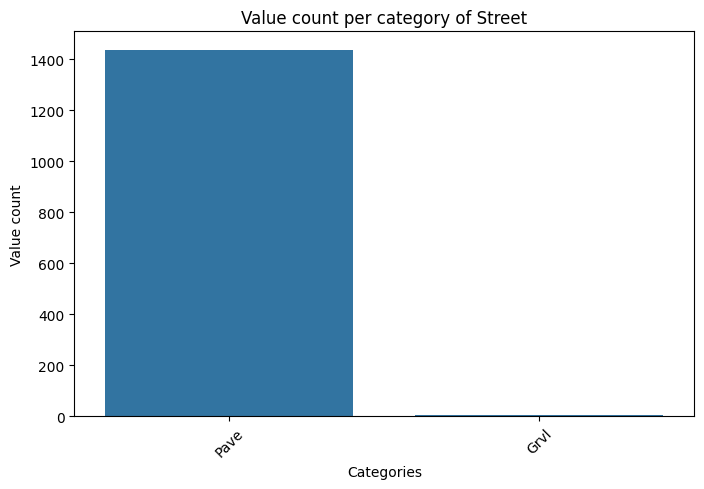

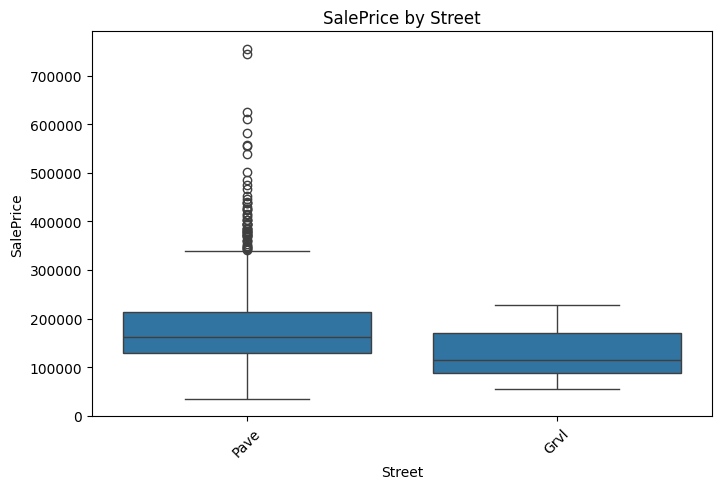

Alley:
- 3 unique categories
Percentage of values in top category: 93.77%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.63


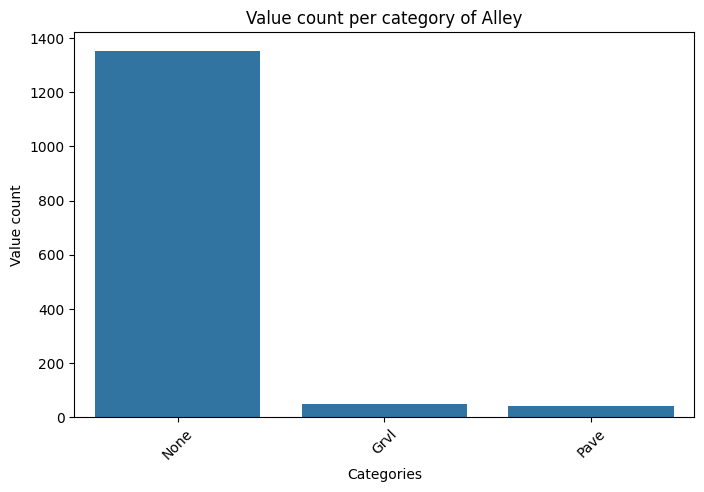

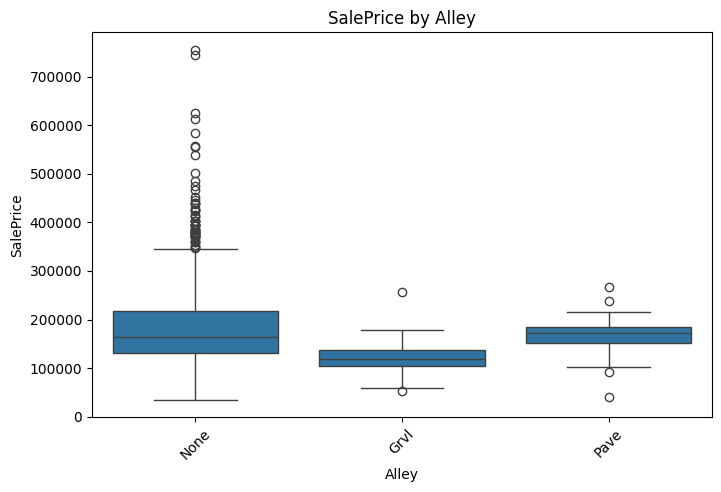

LotShape:
- 4 unique categories
Percentage of values in top category: 63.30%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.90


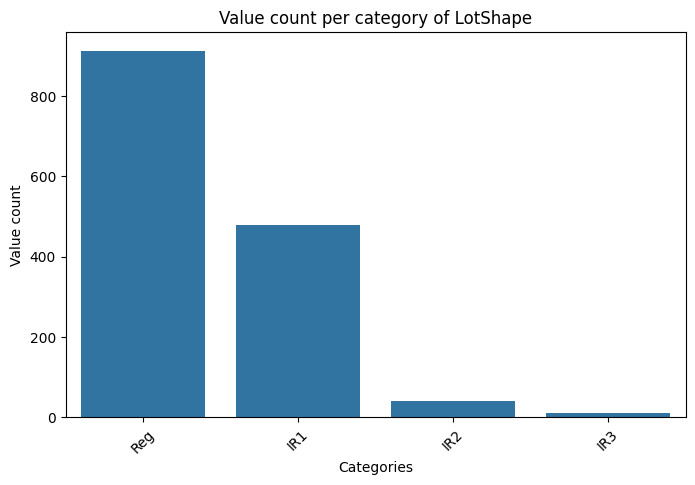

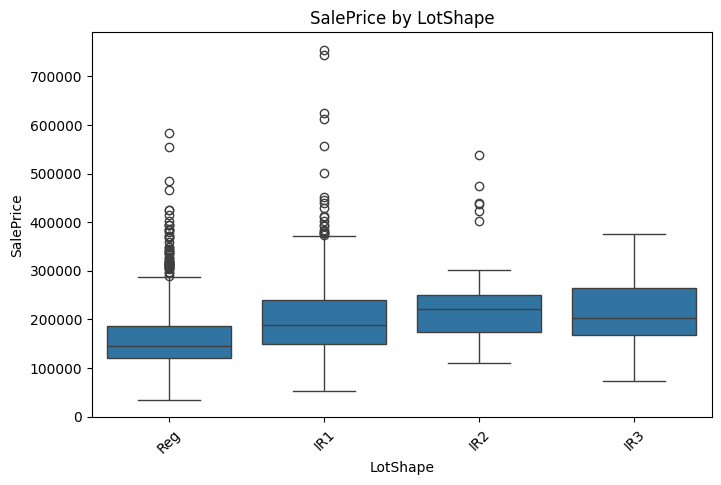

LandContour:
- 4 unique categories
Percentage of values in top category: 89.75%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.96


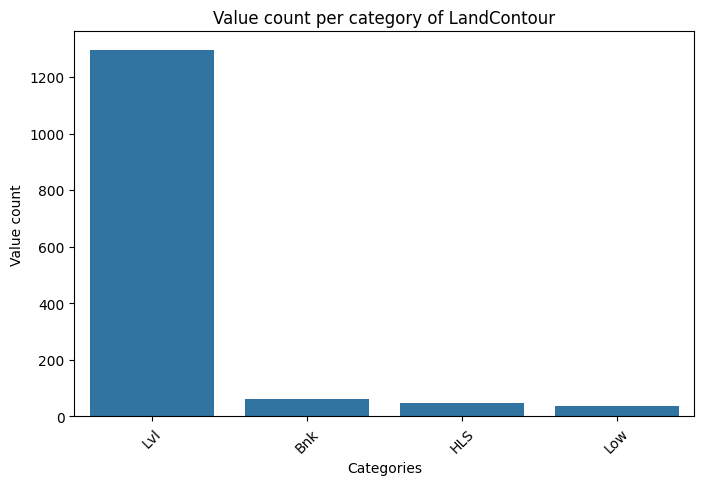

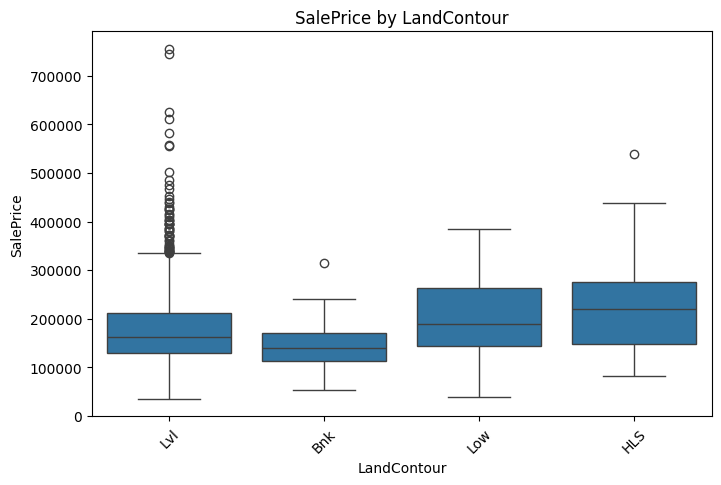

Utilities:
- 2 unique categories
Percentage of values in top category: 99.93%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.30


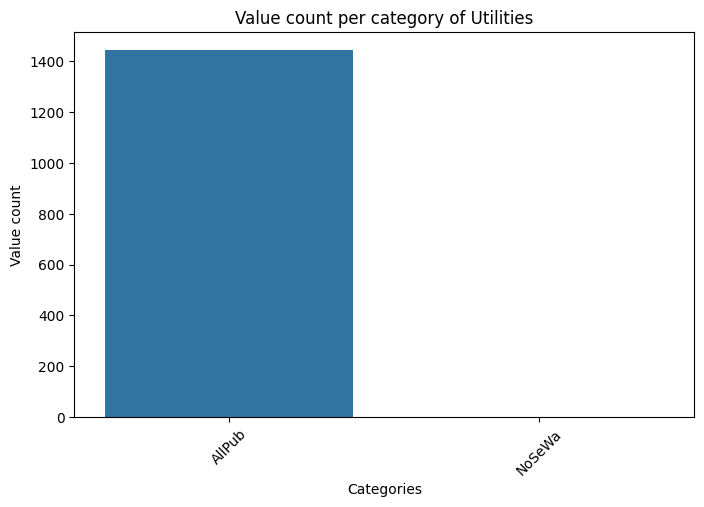

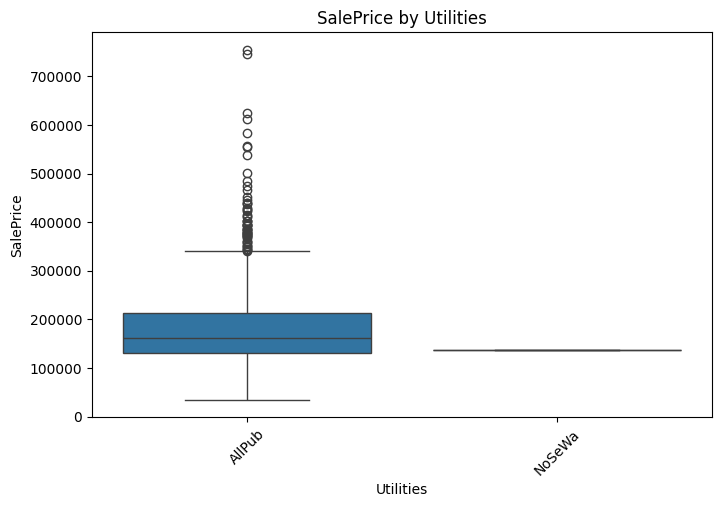

LotConfig:
- 5 unique categories
Percentage of values in top category: 71.88%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.46


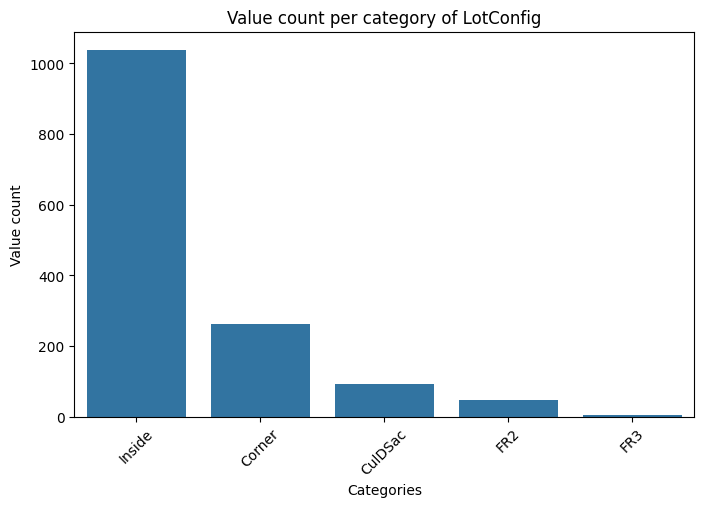

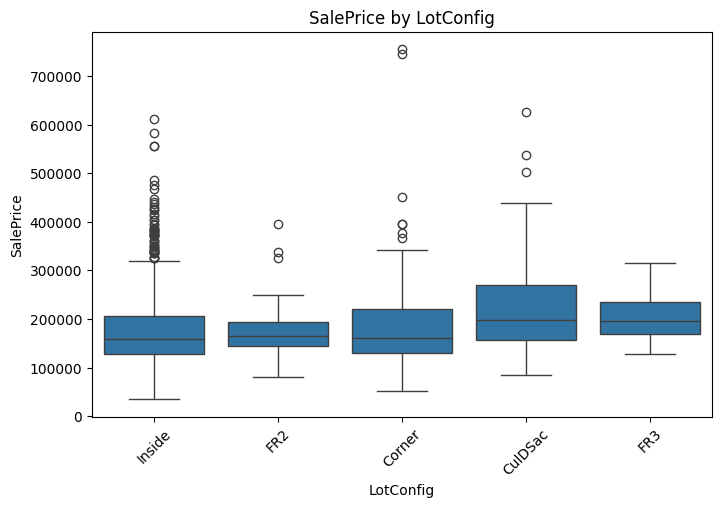

LandSlope:
- 3 unique categories
Percentage of values in top category: 94.60%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.31


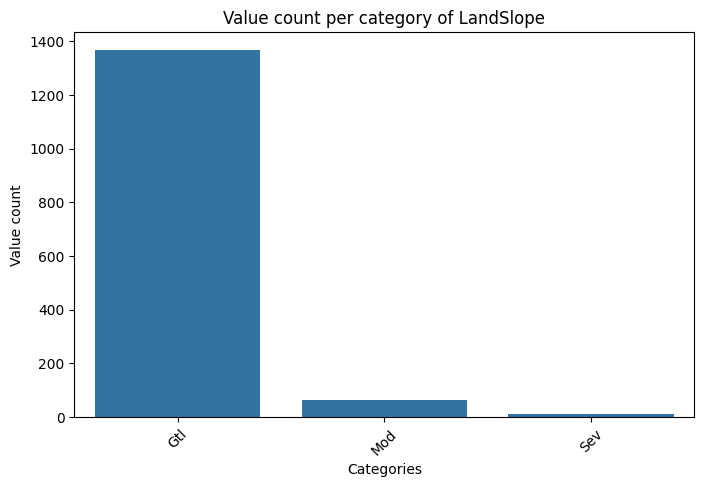

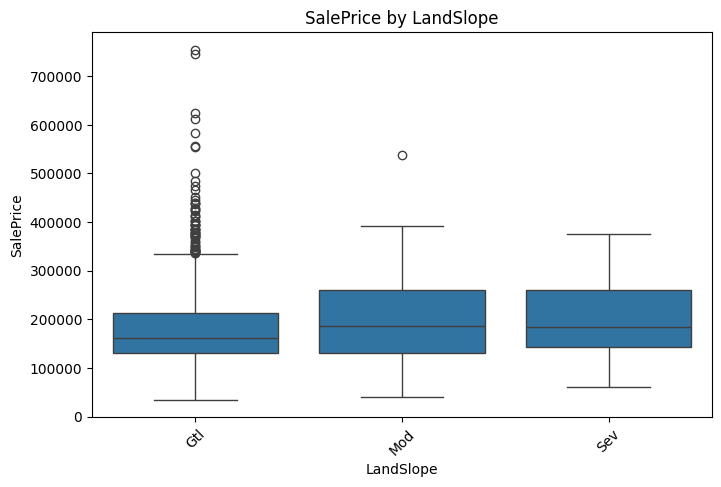

Neighborhood:
- 25 unique categories
Percentage of values in top category: 15.37%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.70


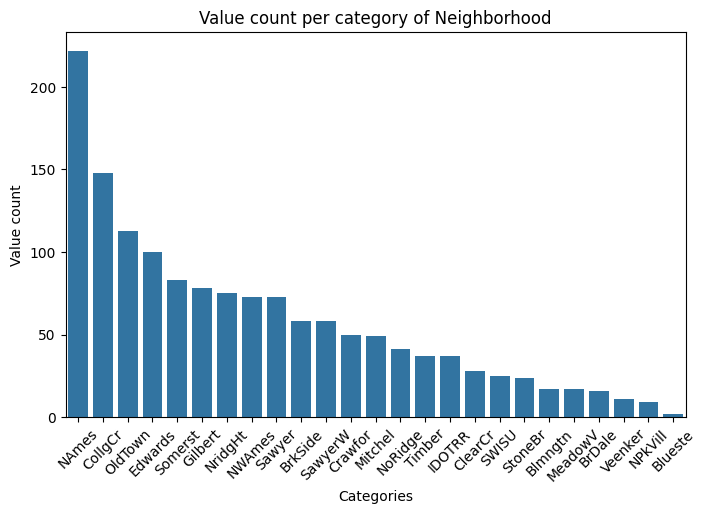

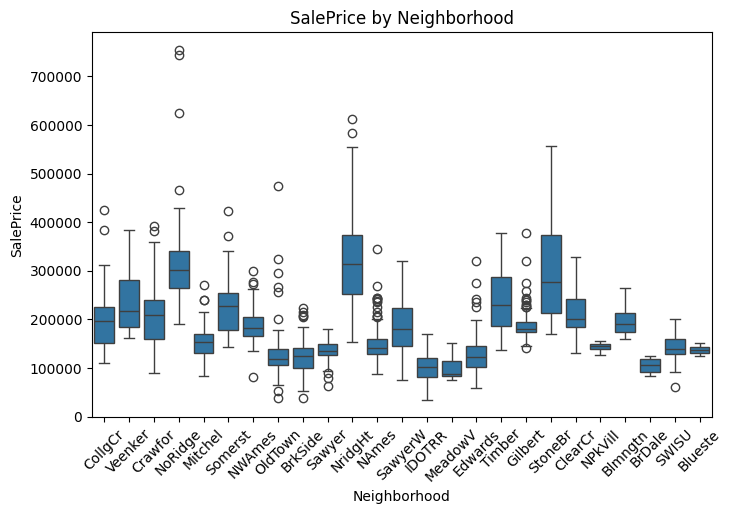

Condition1:
- 9 unique categories
Percentage of values in top category: 86.29%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.12


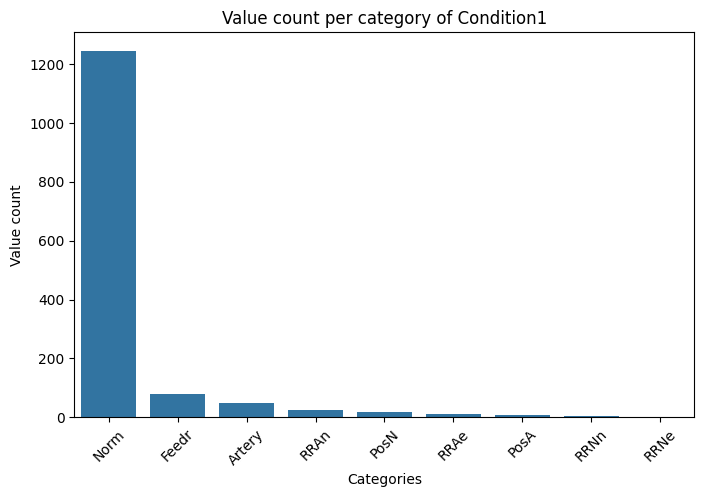

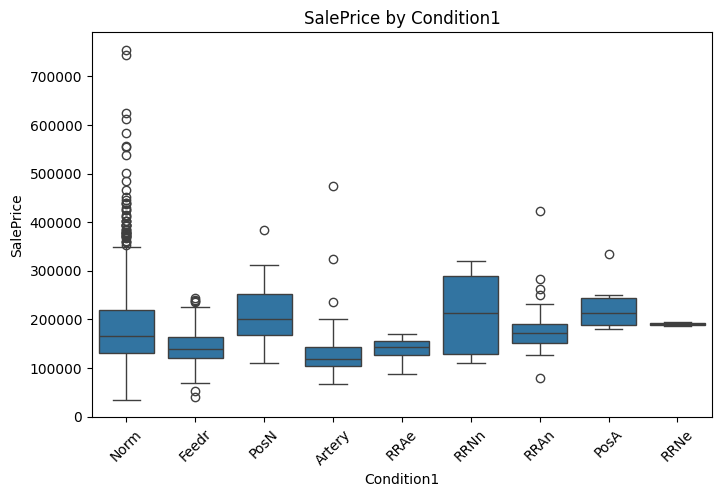

Condition2:
- 7 unique categories
Percentage of values in top category: 99.03%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.71


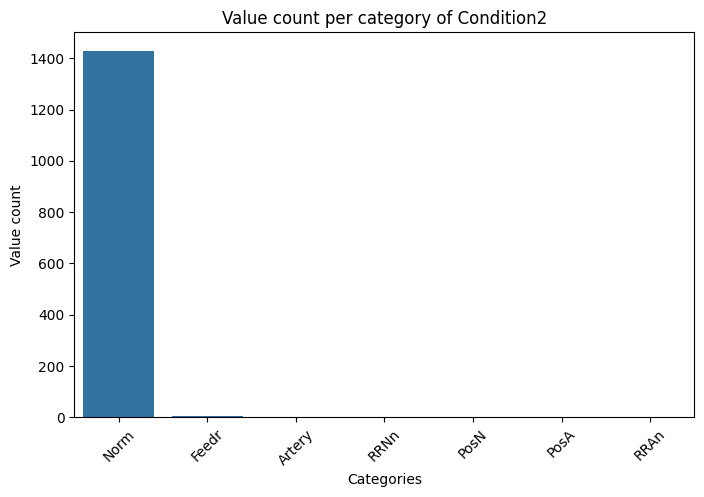

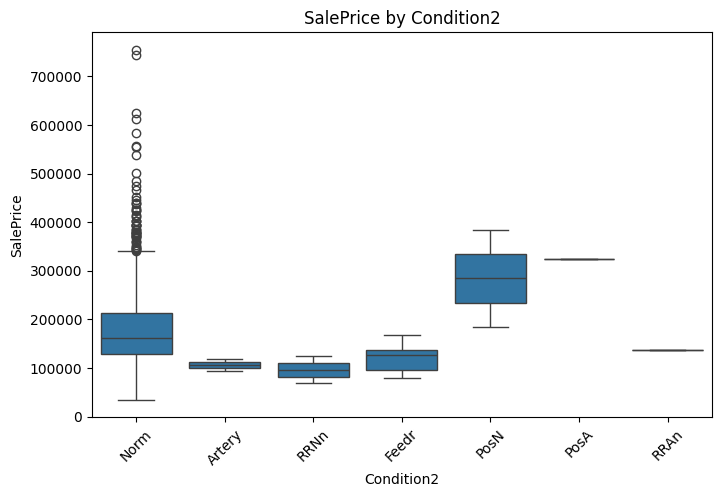

BldgType:
- 5 unique categories
Percentage of values in top category: 83.52%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.53


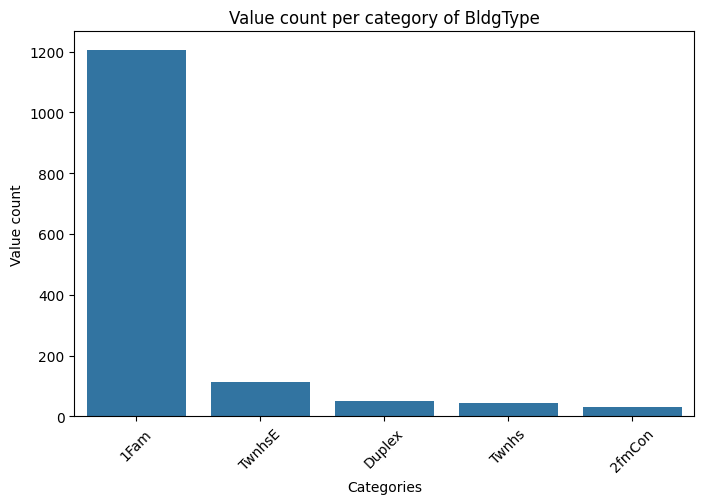

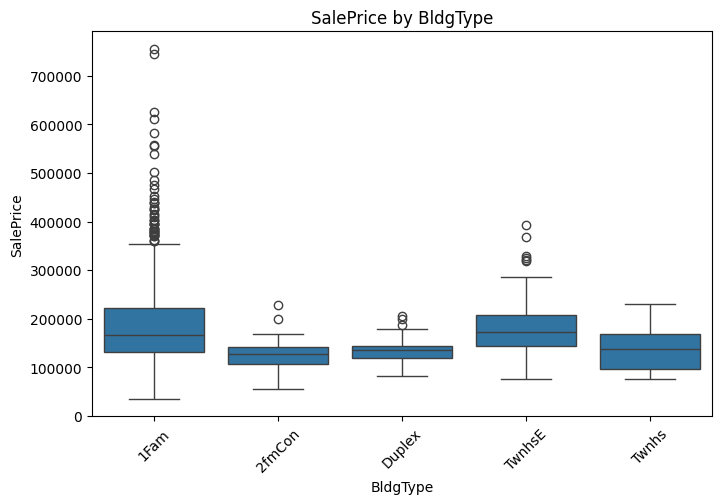

HouseStyle:
- 8 unique categories
Percentage of values in top category: 49.58%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.98


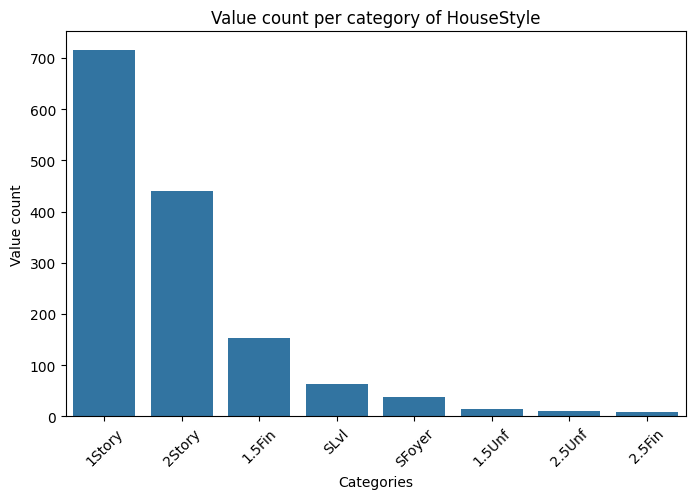

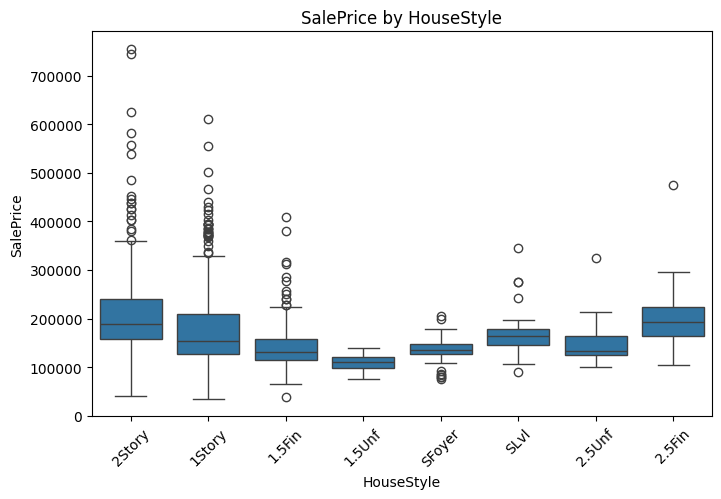

OverallQual:
- 10 unique categories
Percentage of values in top category: 27.22%
Flatness score (median range of SalePrice by category / SalePrice IQR): 4.47


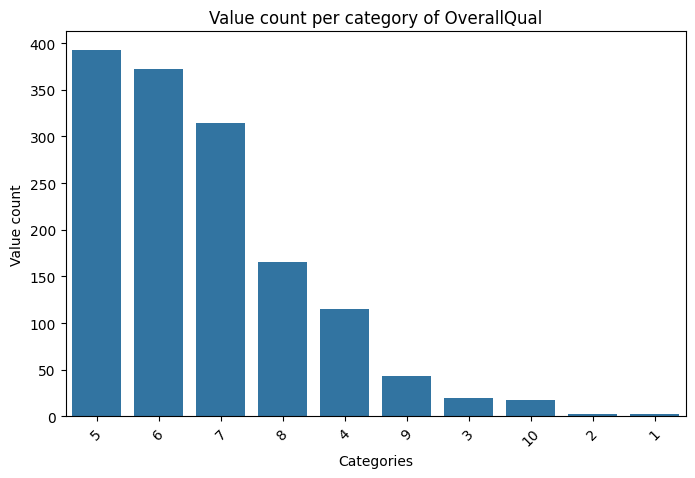

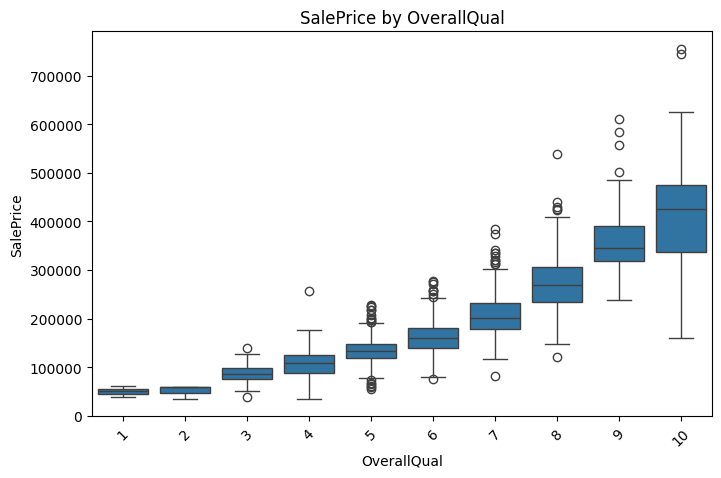

OverallCond:
- 9 unique categories
Percentage of values in top category: 56.02%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.47


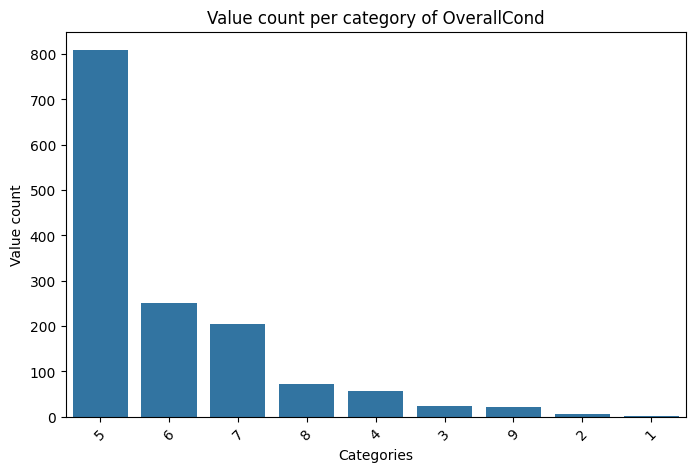

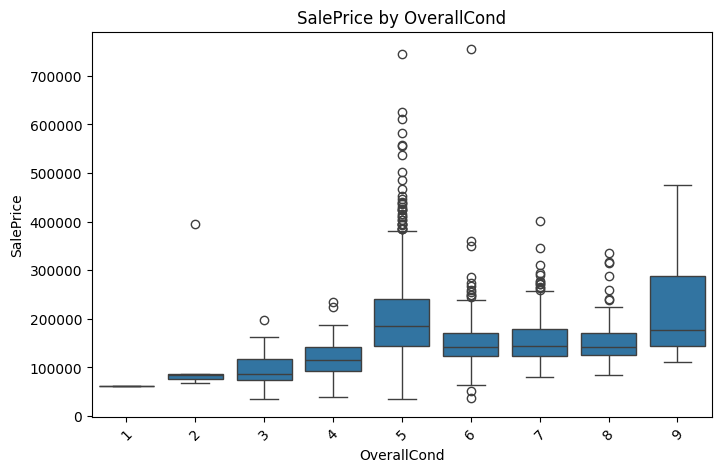

RoofStyle:
- 6 unique categories
Percentage of values in top category: 78.05%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.44


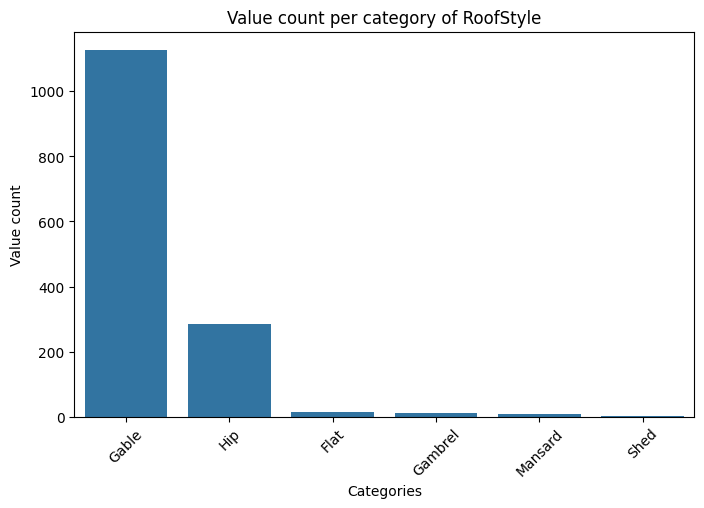

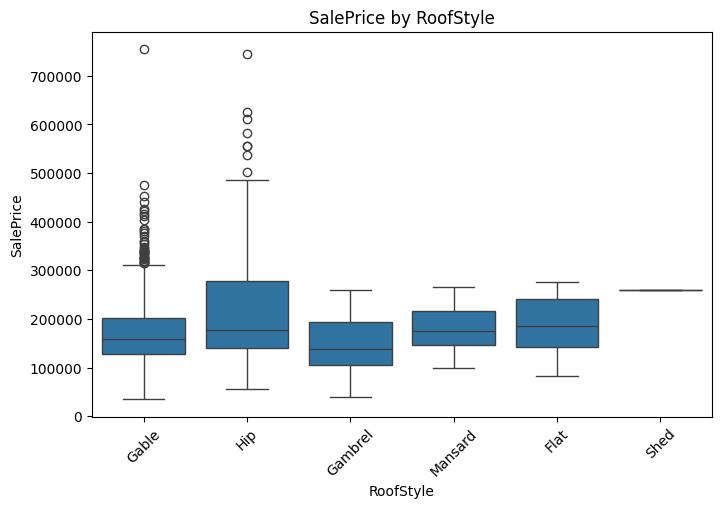

RoofMatl:
- 8 unique categories
Percentage of values in top category: 98.20%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.32


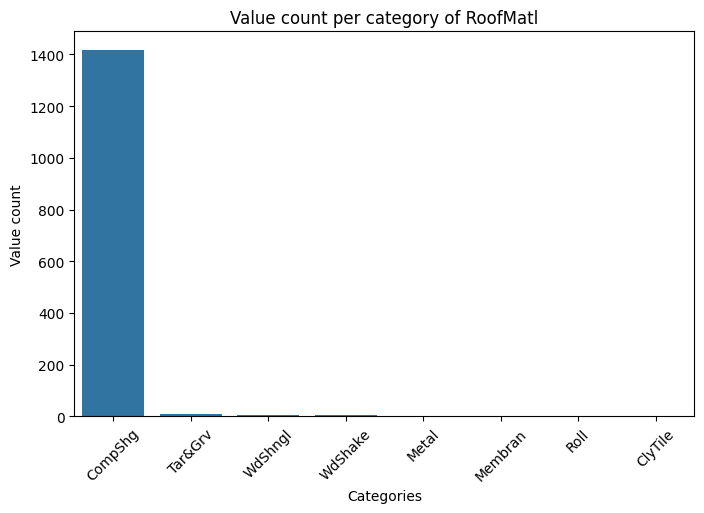

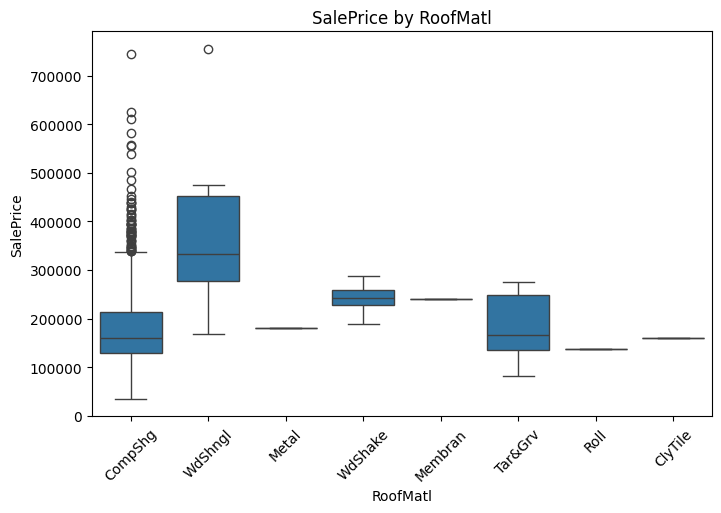

Exterior1st:
- 15 unique categories
Percentage of values in top category: 35.11%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.27


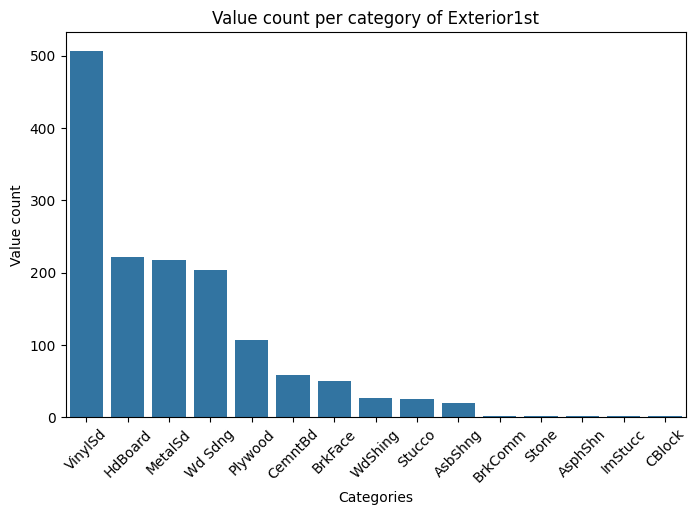

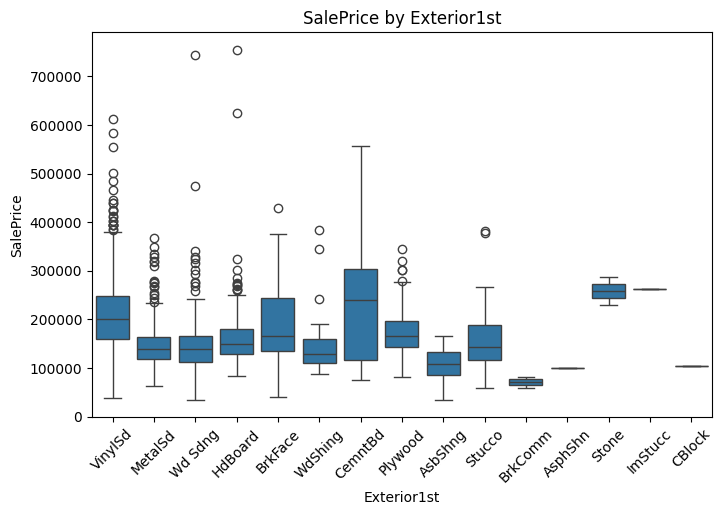

Exterior2nd:
- 16 unique categories
Percentage of values in top category: 34.35%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.54


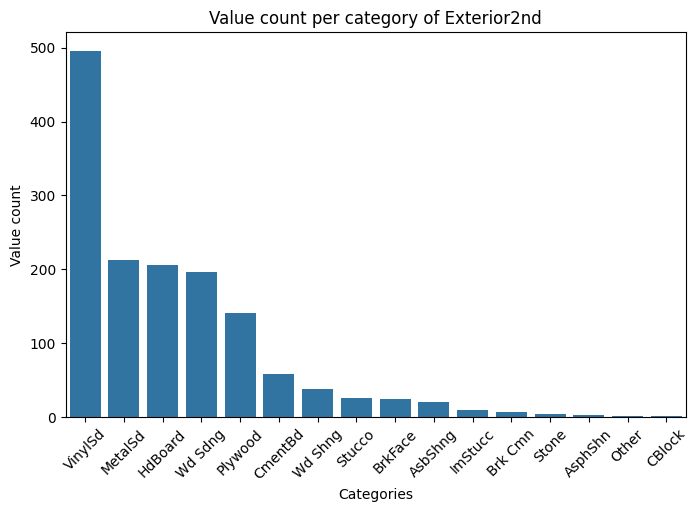

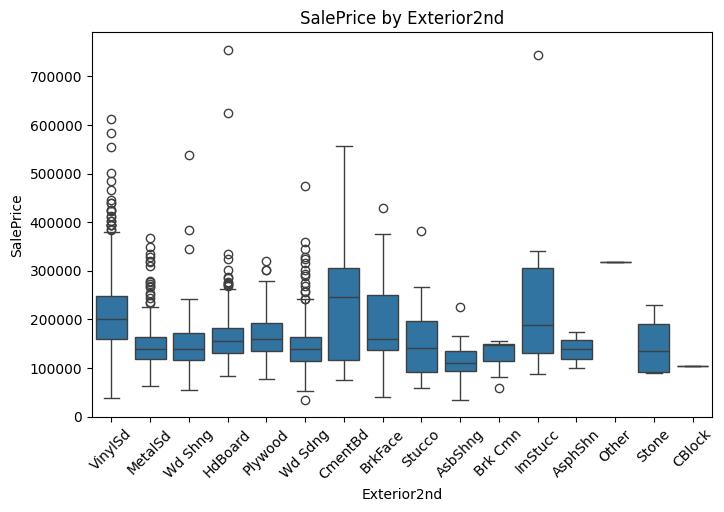

MasVnrType:
- 4 unique categories
Percentage of values in top category: 59.28%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.28


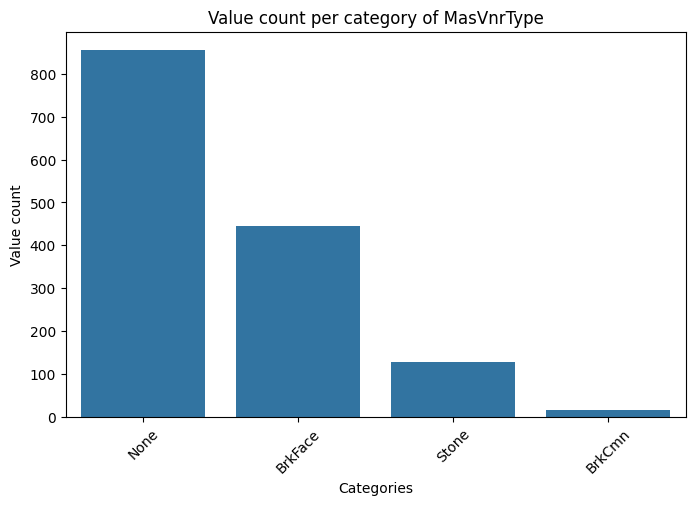

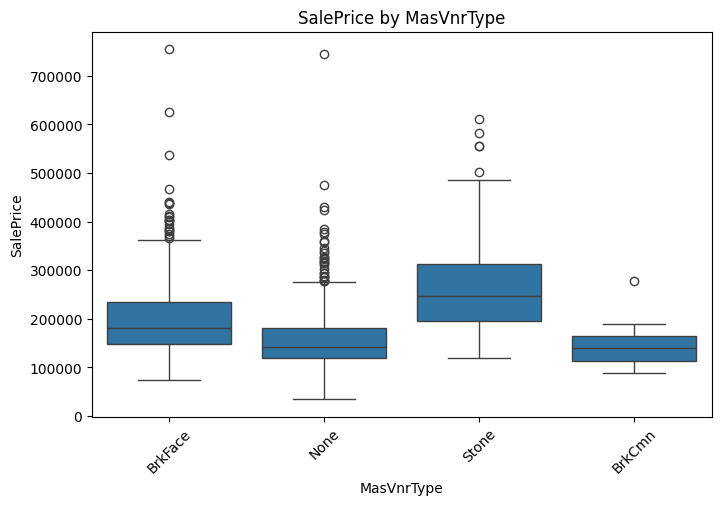

ExterQual:
- 4 unique categories
Percentage of values in top category: 62.47%
Flatness score (median range of SalePrice by category / SalePrice IQR): 3.33


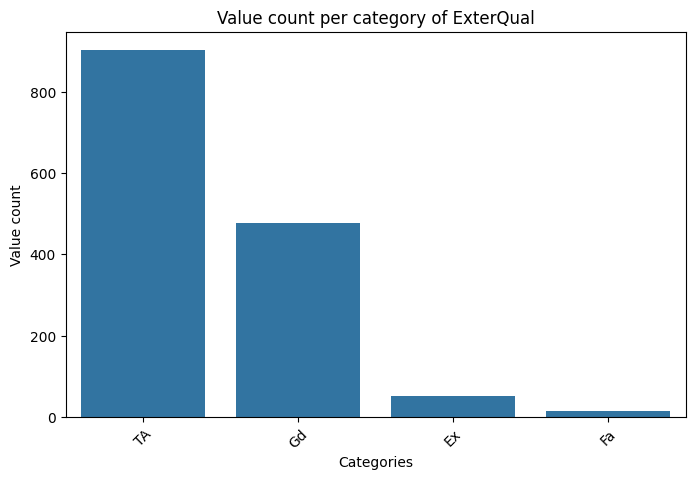

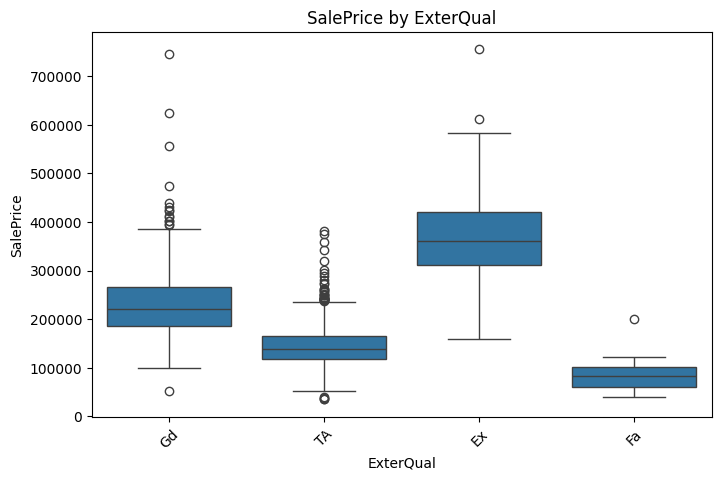

ExterCond:
- 5 unique categories
Percentage of values in top category: 87.67%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.06


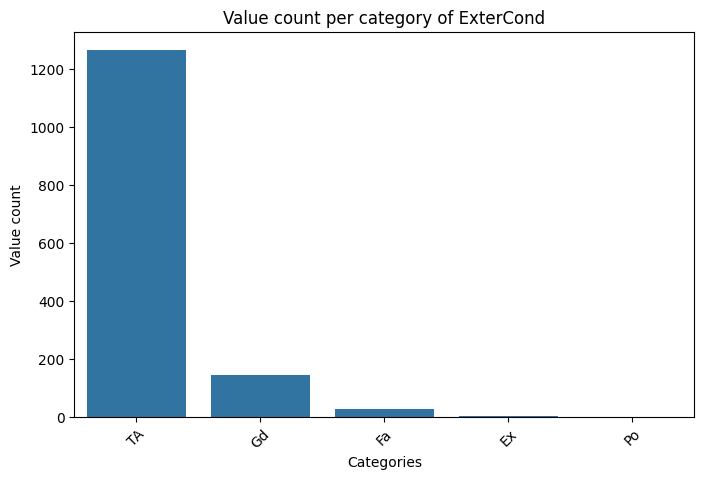

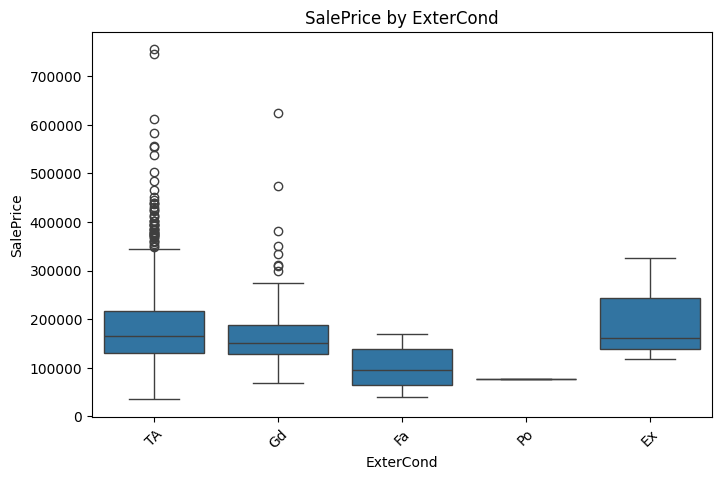

Foundation:
- 6 unique categories
Percentage of values in top category: 43.98%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.20


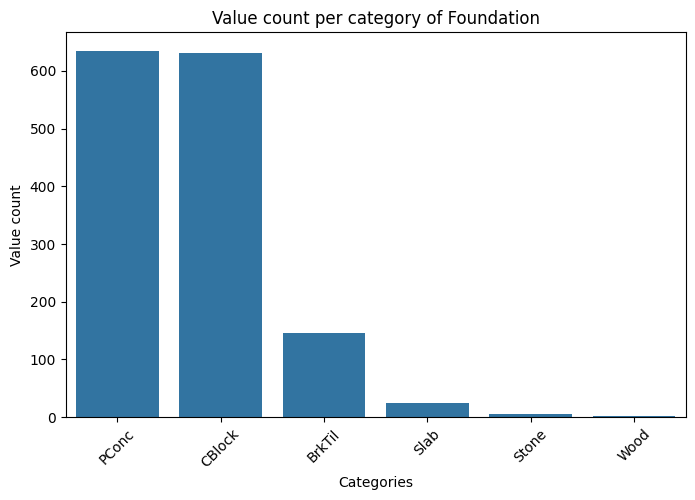

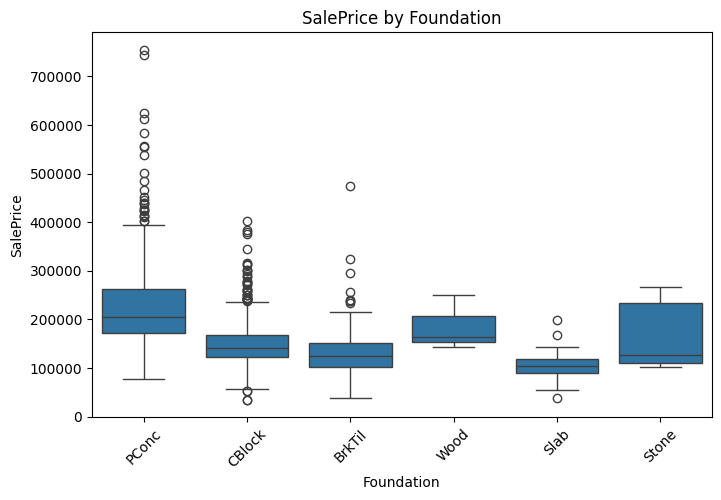

BsmtQual:
- 5 unique categories
Percentage of values in top category: 44.67%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.56


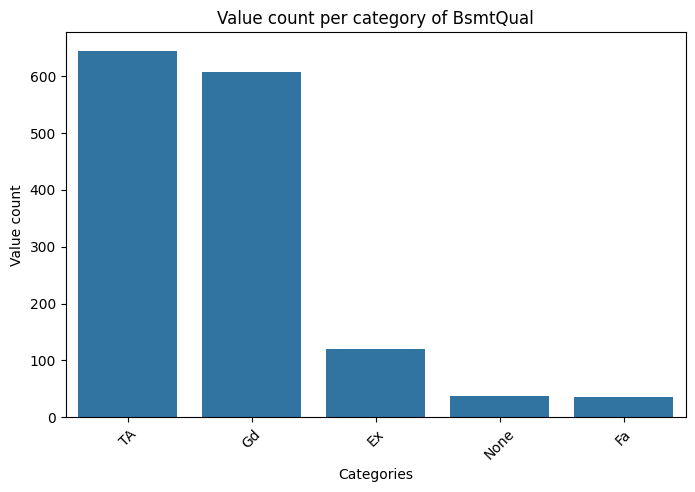

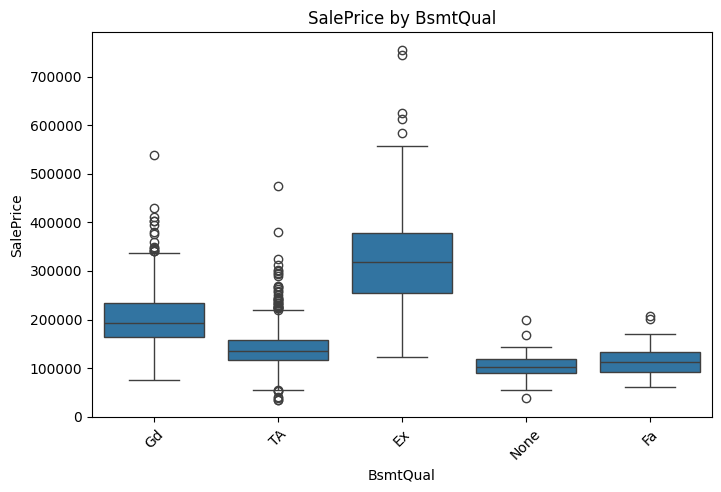

BsmtCond:
- 5 unique categories
Percentage of values in top category: 89.75%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.53


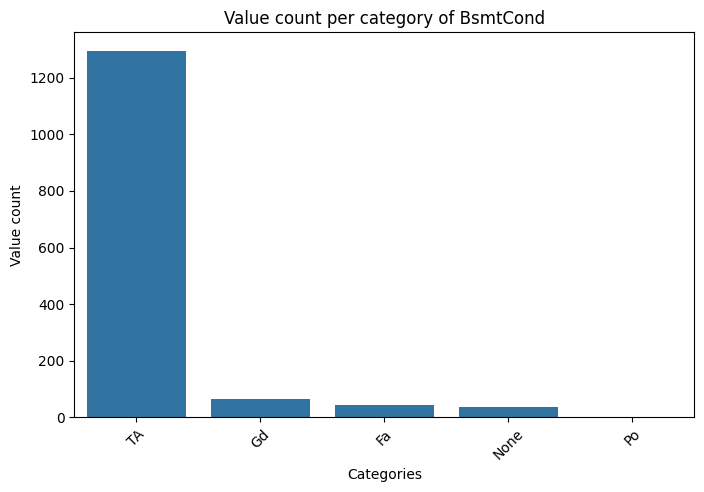

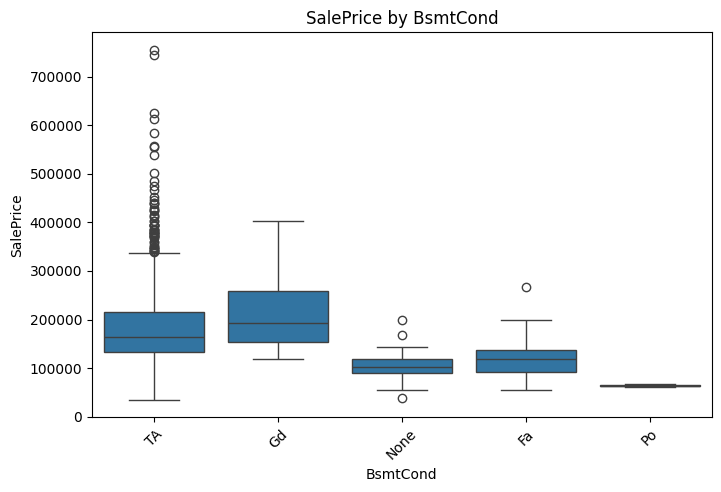

BsmtExposure:
- 5 unique categories
Percentage of values in top category: 65.10%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.46


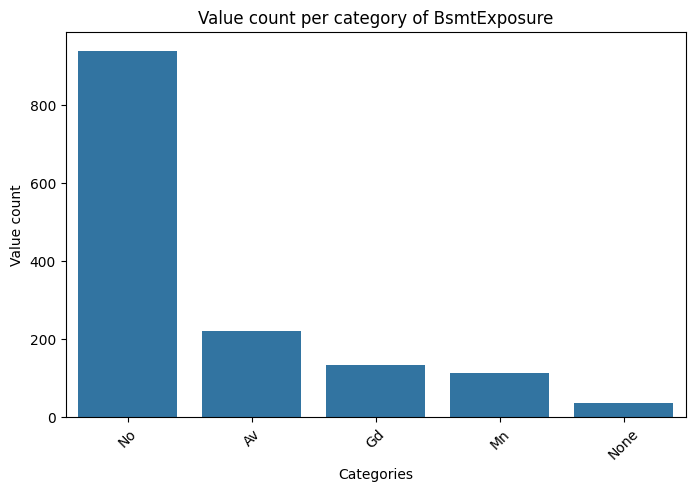

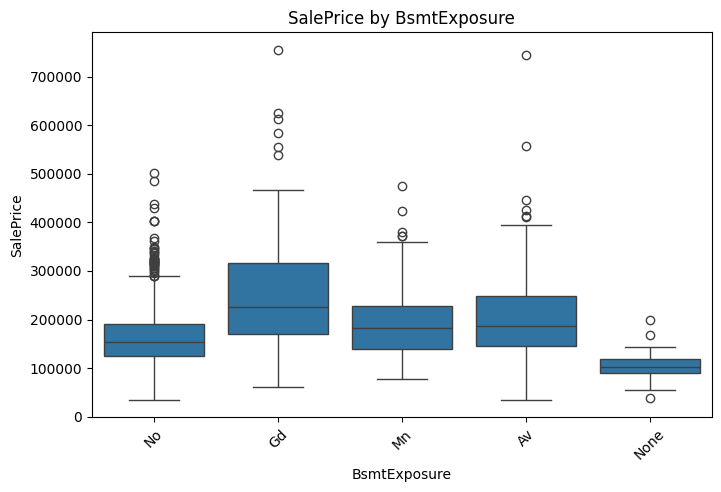

BsmtFinType1:
- 7 unique categories
Percentage of values in top category: 29.43%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.33


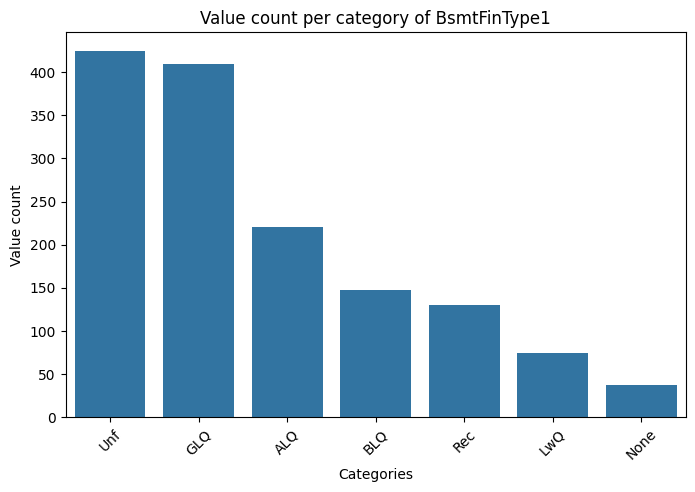

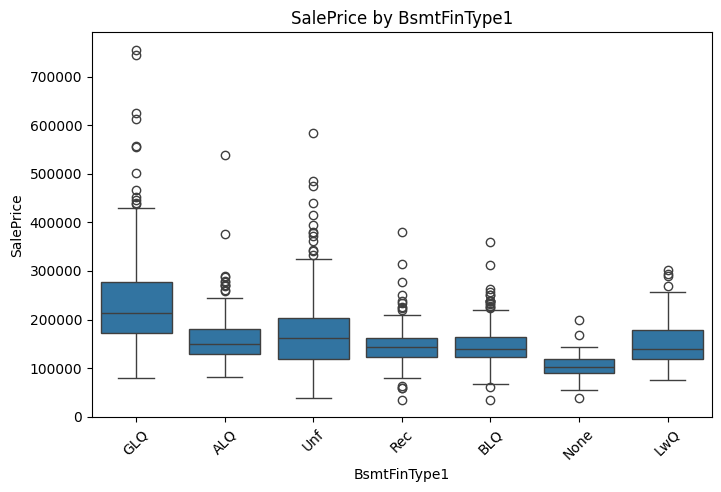

BsmtFinType2:
- 7 unique categories
Percentage of values in top category: 86.01%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.20


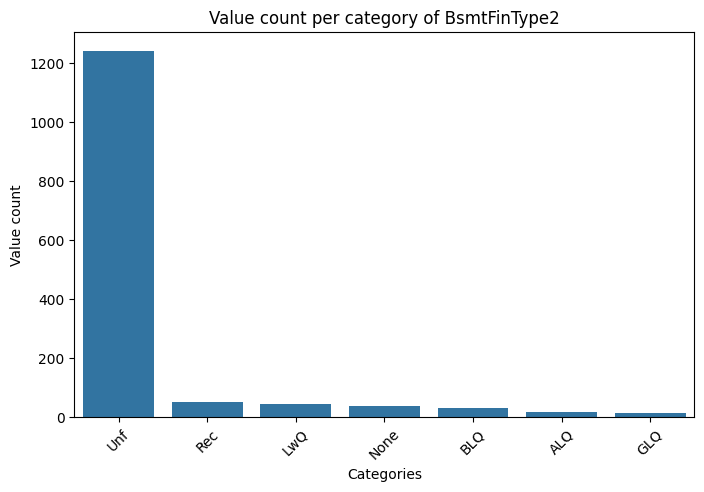

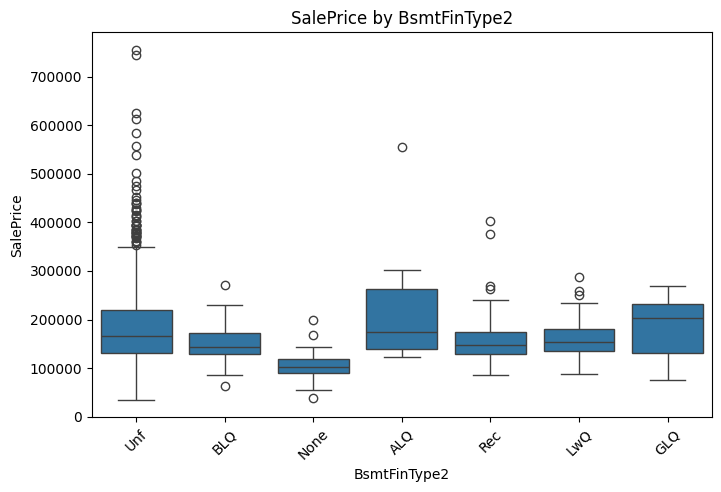

Heating:
- 6 unique categories
Percentage of values in top category: 97.78%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.09


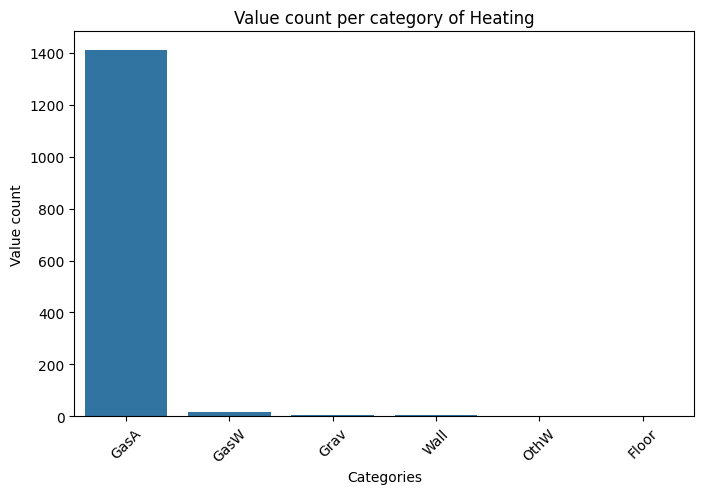

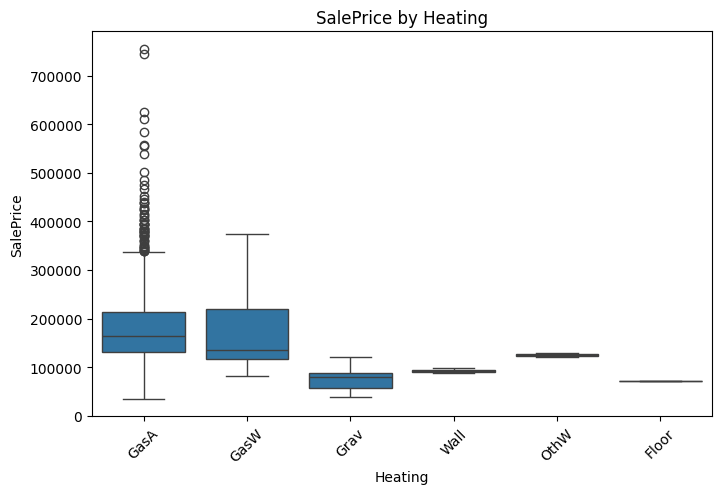

HeatingQC:
- 5 unique categories
Percentage of values in top category: 50.48%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.28


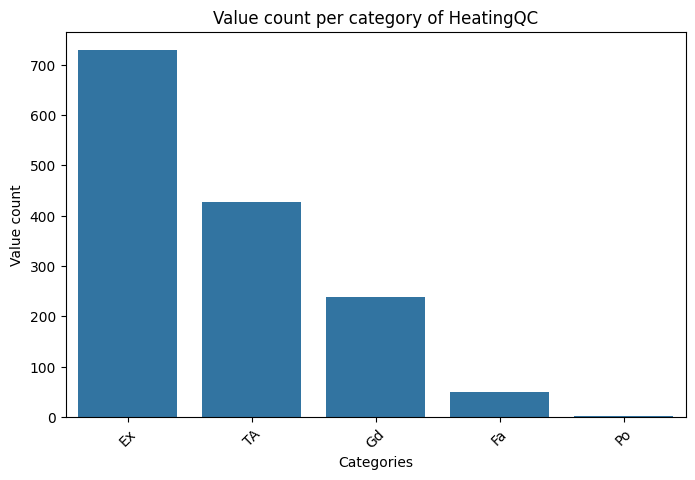

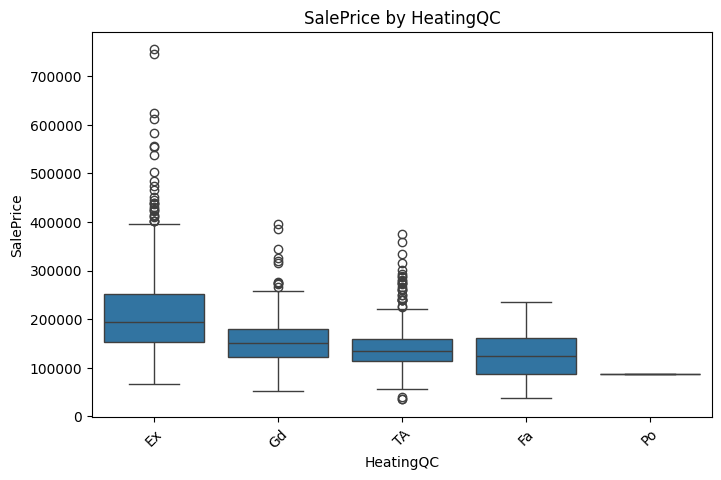

CentralAir:
- 2 unique categories
Percentage of values in top category: 93.42%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.83


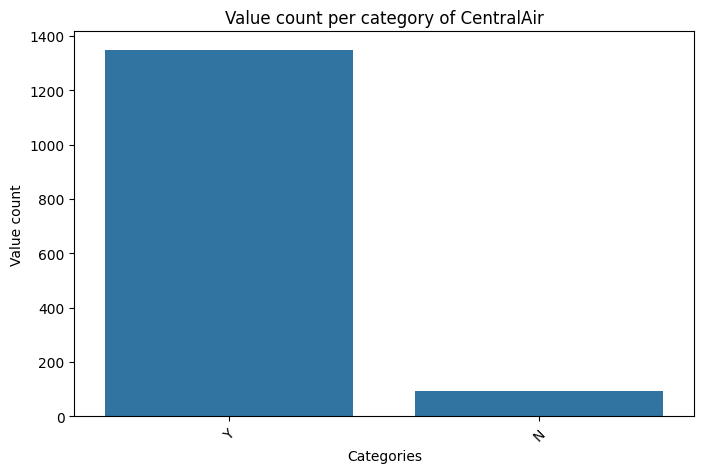

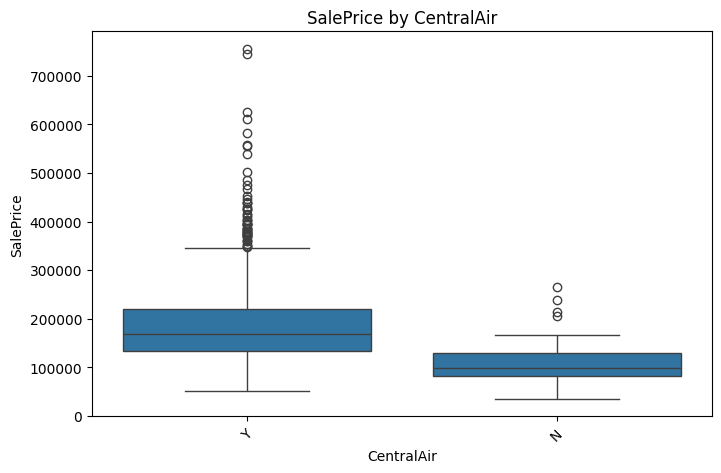

Electrical:
- 5 unique categories
Percentage of values in top category: 91.41%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.22


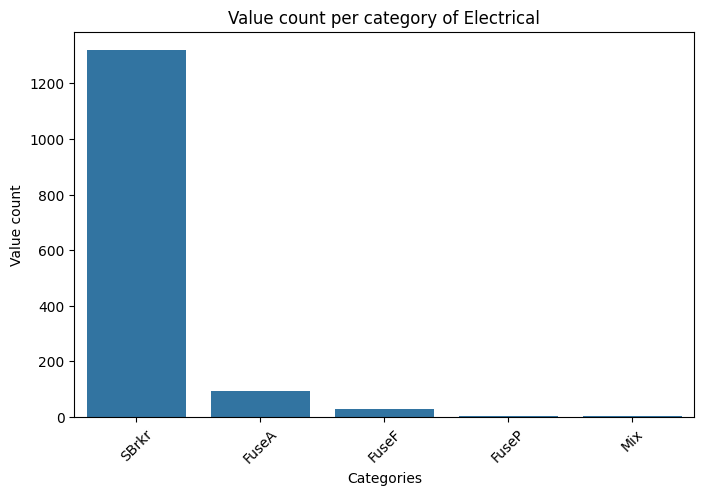

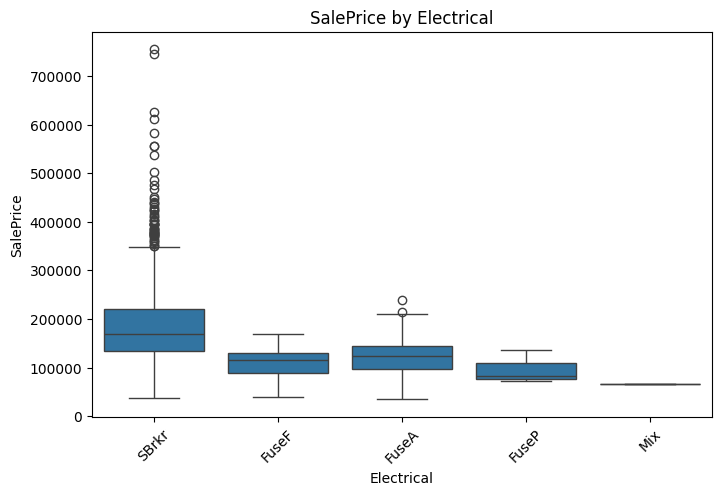

KitchenQual:
- 4 unique categories
Percentage of values in top category: 50.55%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.38


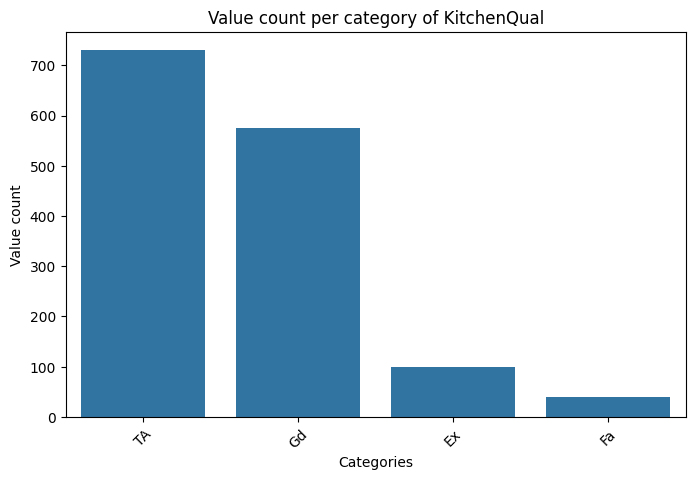

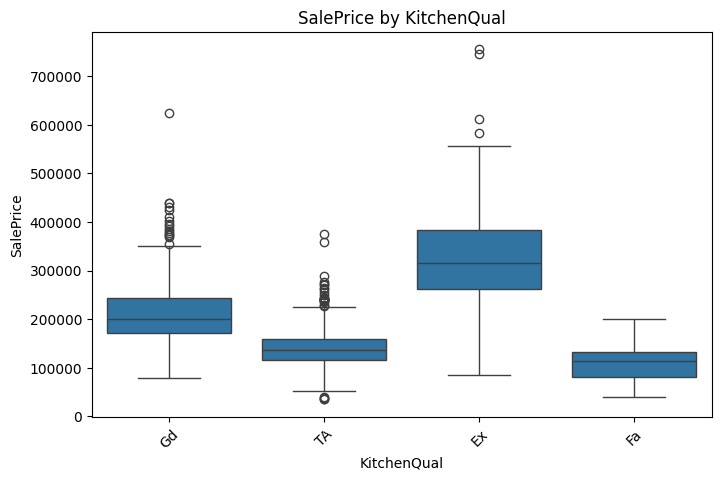

Functional:
- 7 unique categories
Percentage of values in top category: 93.14%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.95


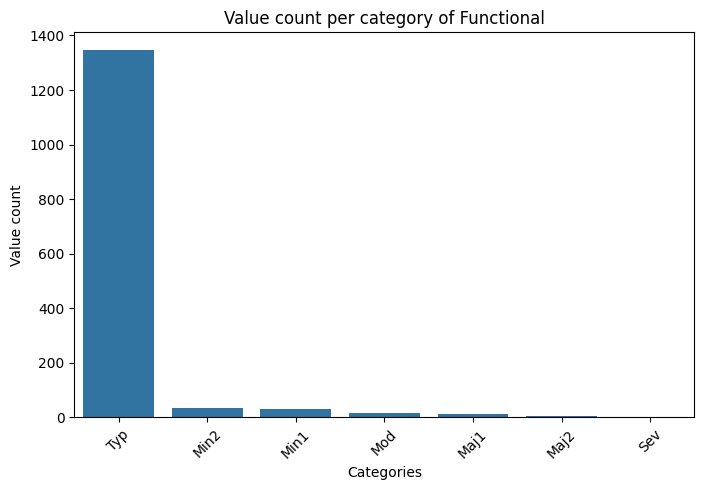

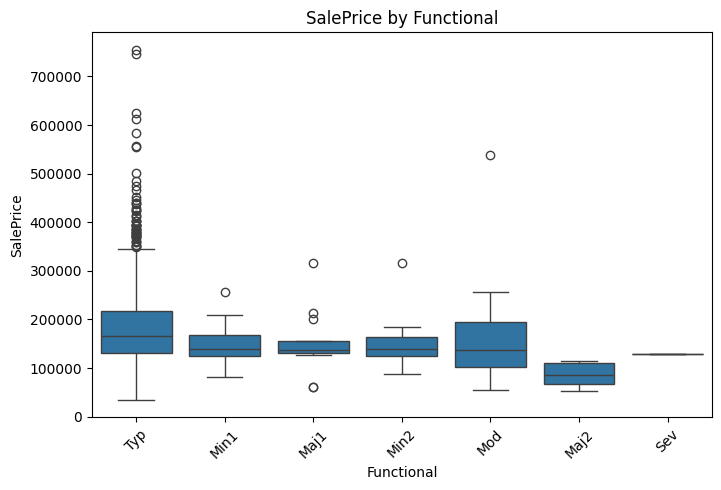

FireplaceQu:
- 6 unique categories
Percentage of values in top category: 47.30%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.17


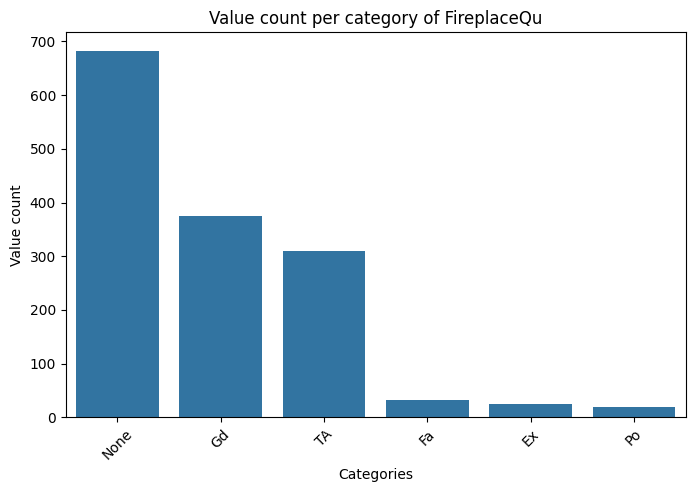

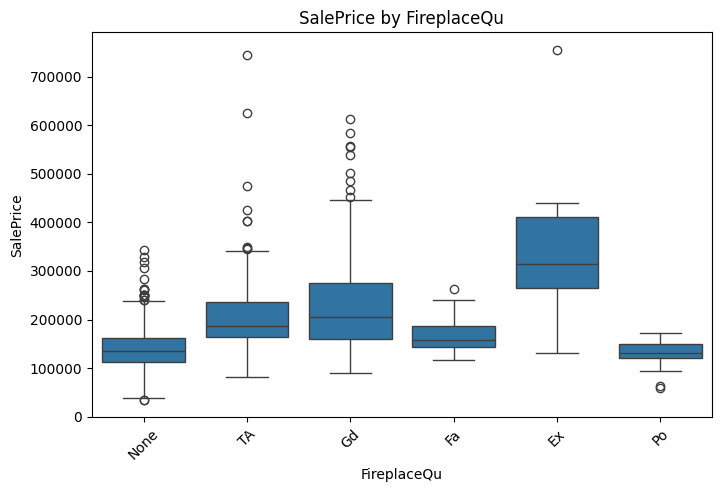

GarageType:
- 7 unique categories
Percentage of values in top category: 59.35%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.58


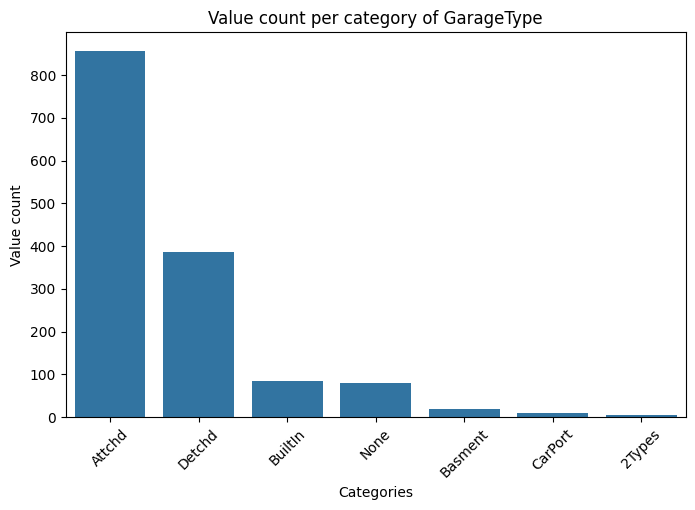

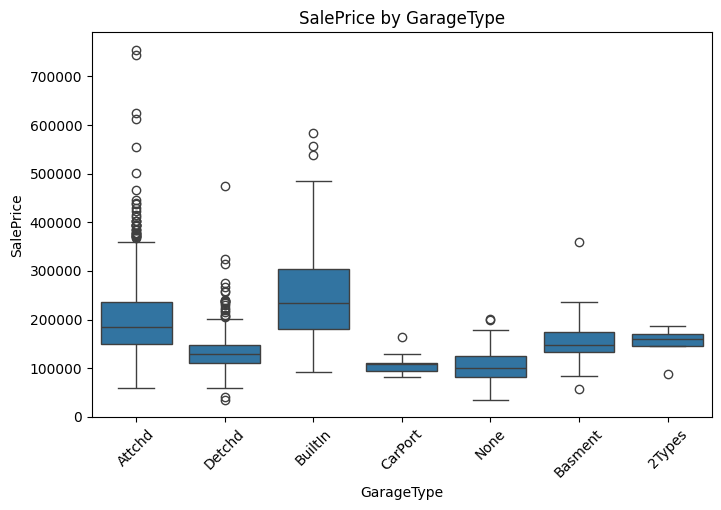

GarageFinish:
- 4 unique categories
Percentage of values in top category: 41.76%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.37


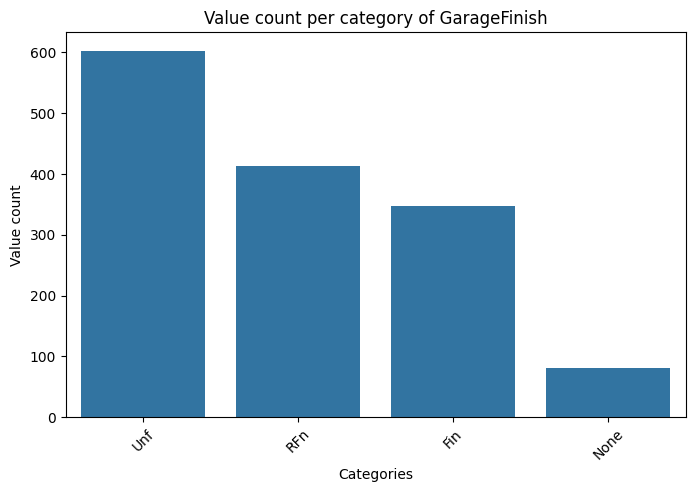

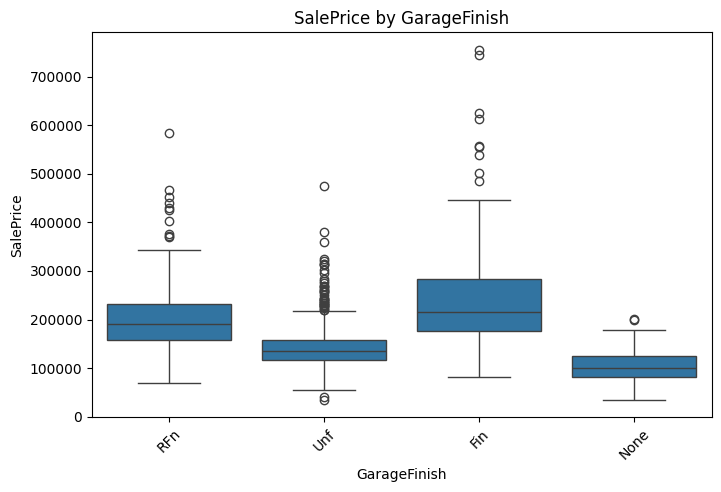

GarageQual:
- 6 unique categories
Percentage of values in top category: 89.68%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.34


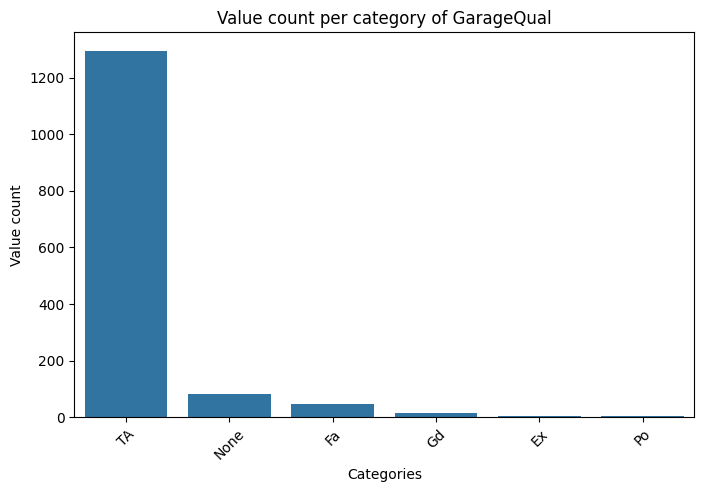

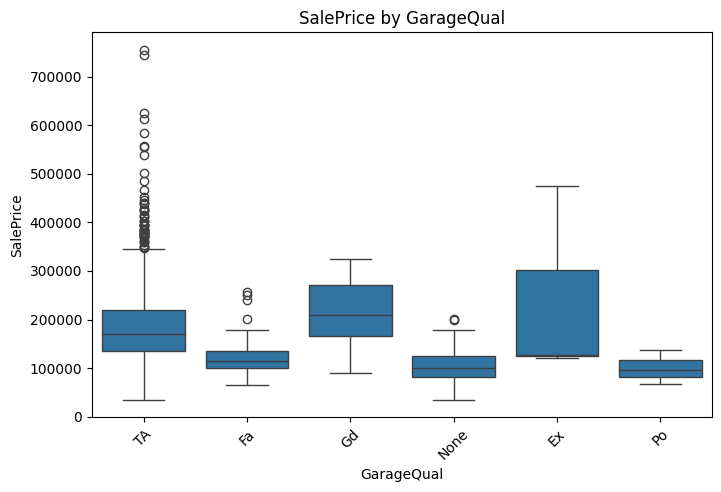

GarageCond:
- 6 unique categories
Percentage of values in top category: 90.72%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.83


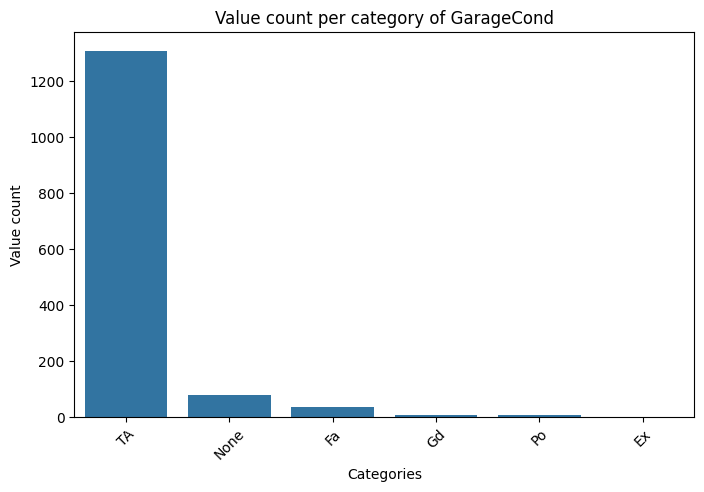

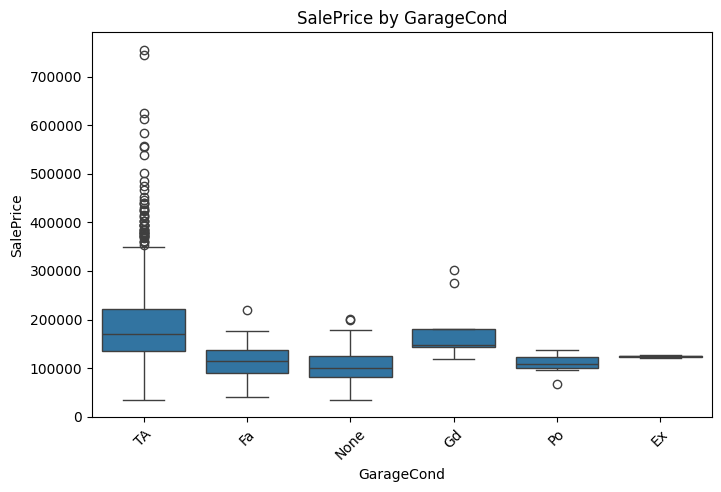

PavedDrive:
- 3 unique categories
Percentage of values in top category: 91.76%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.69


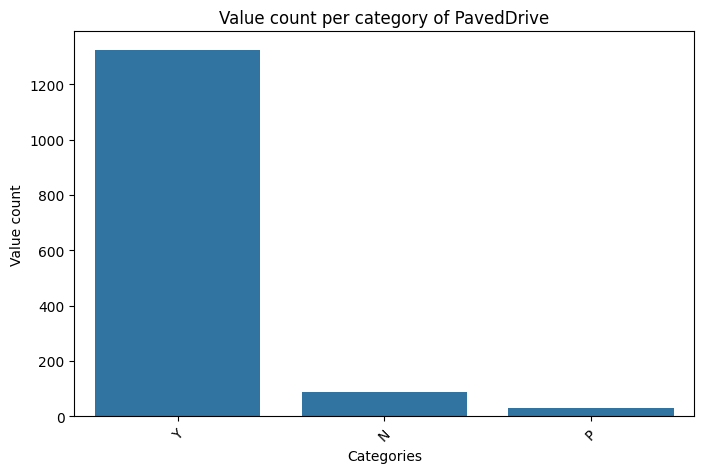

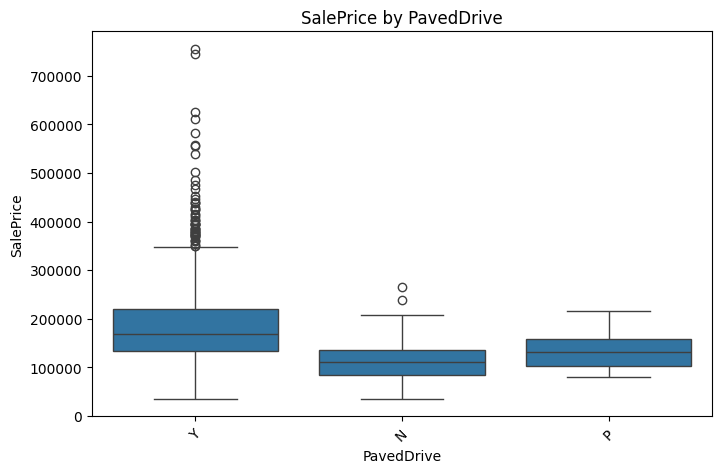

PoolQC:
- 4 unique categories
Percentage of values in top category: 99.52%
Flatness score (median range of SalePrice by category / SalePrice IQR): 3.90


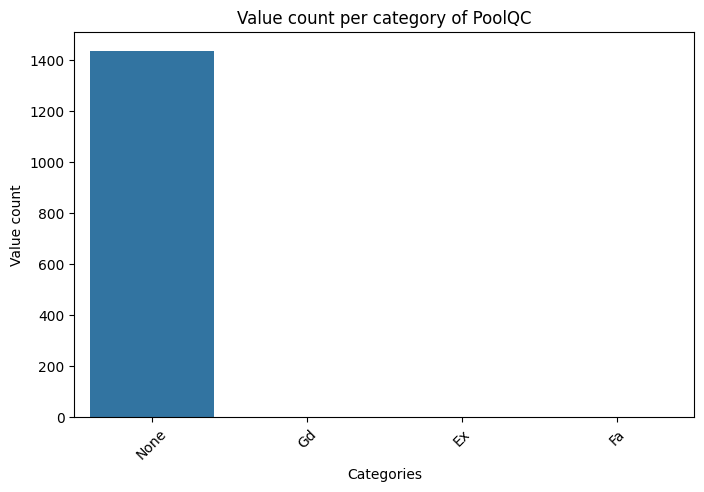

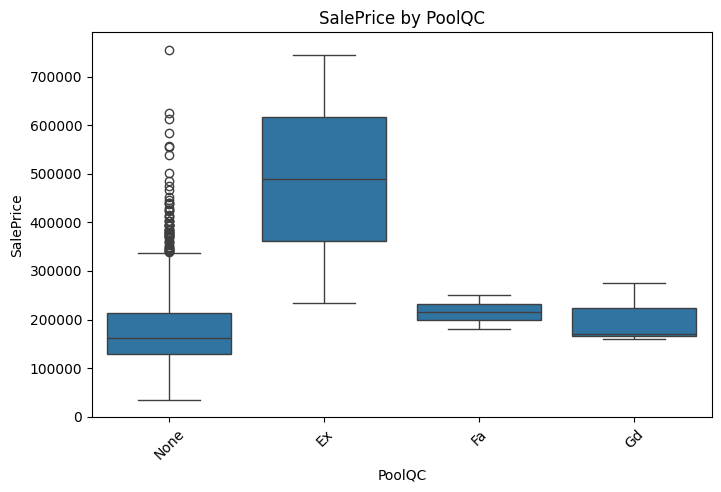

Fence:
- 5 unique categories
Percentage of values in top category: 80.54%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.51


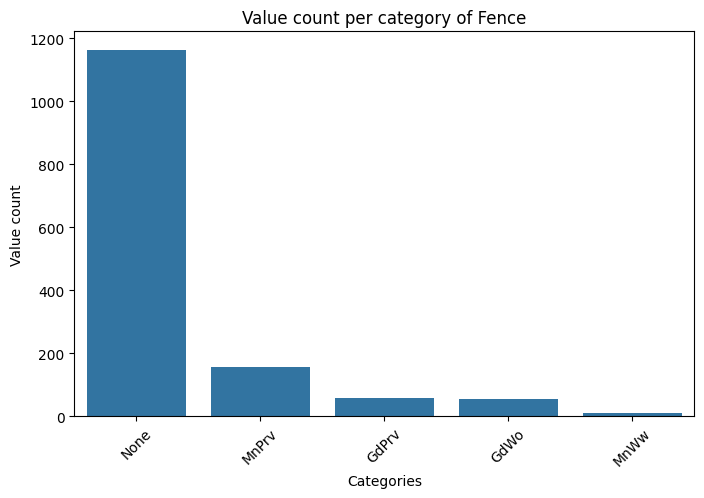

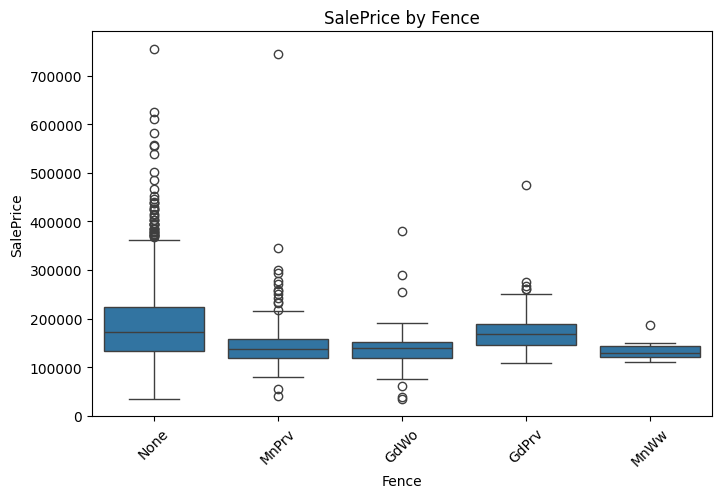

MiscFeature:
- 5 unique categories
Percentage of values in top category: 96.47%
Flatness score (median range of SalePrice by category / SalePrice IQR): 2.32


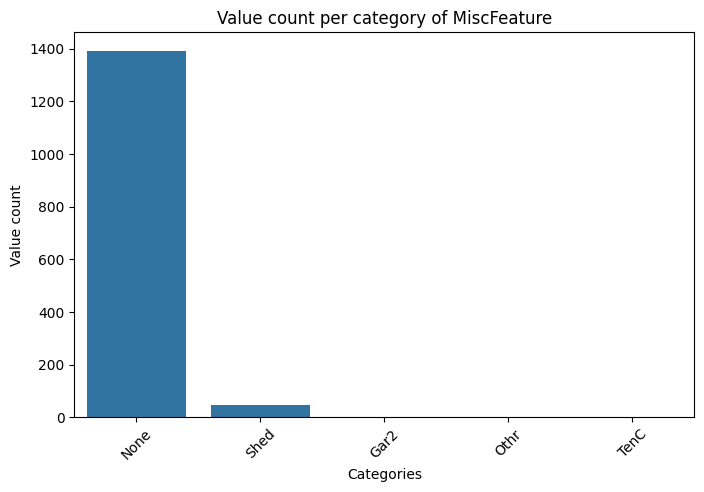

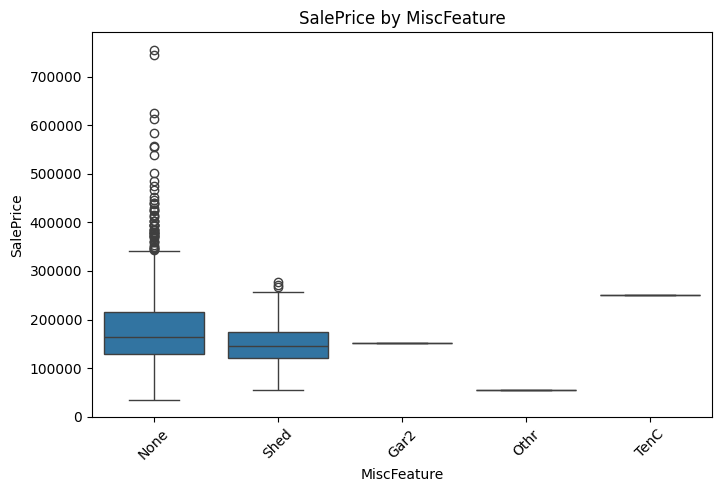

MoSold:
- 12 unique categories
Percentage of values in top category: 17.52%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.46


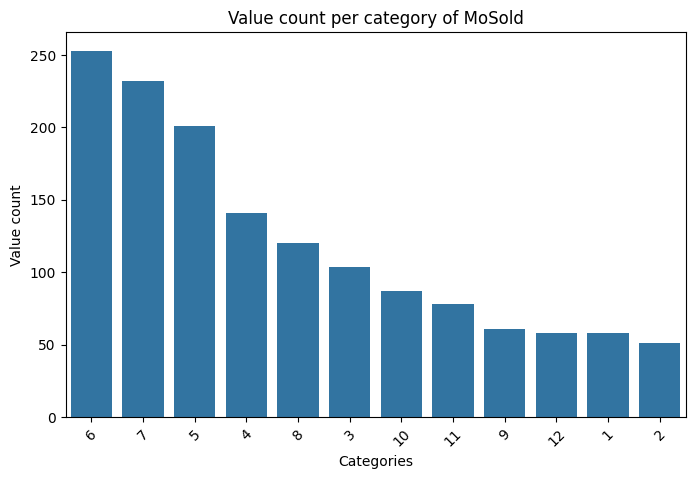

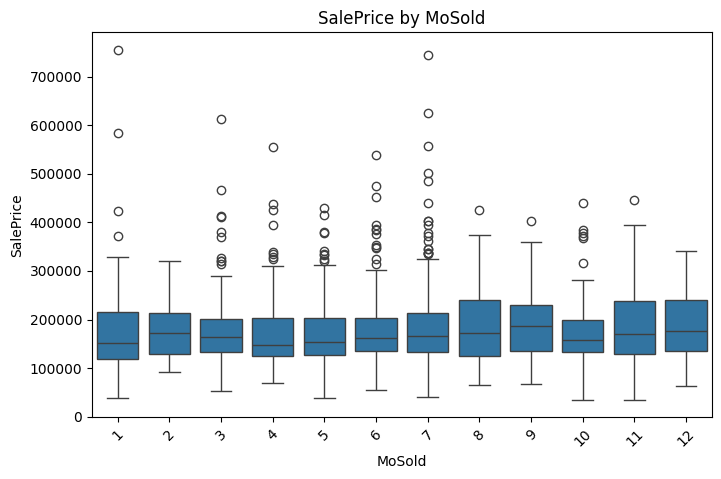

SaleType:
- 9 unique categories
Percentage of values in top category: 87.05%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.76


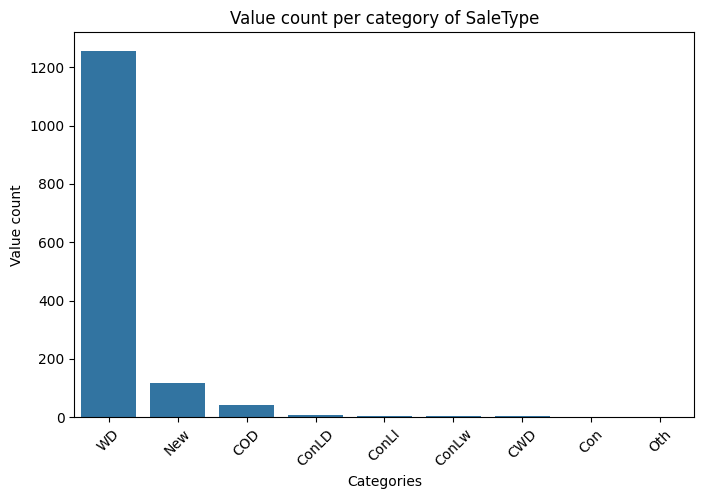

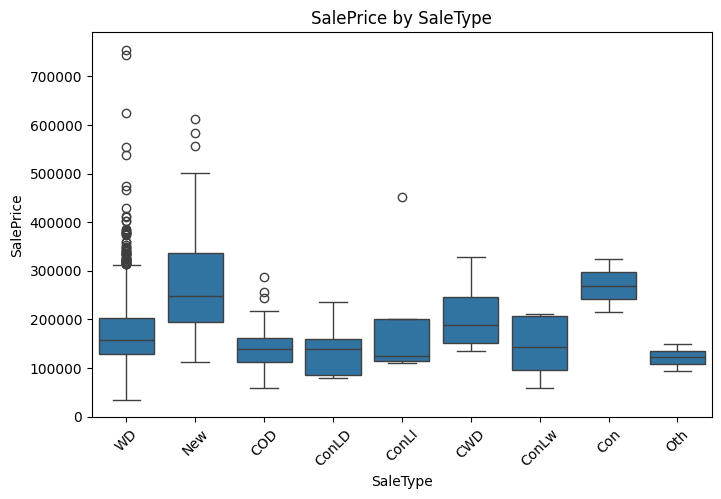

SaleCondition:
- 6 unique categories
Percentage of values in top category: 82.27%
Flatness score (median range of SalePrice by category / SalePrice IQR): 1.67


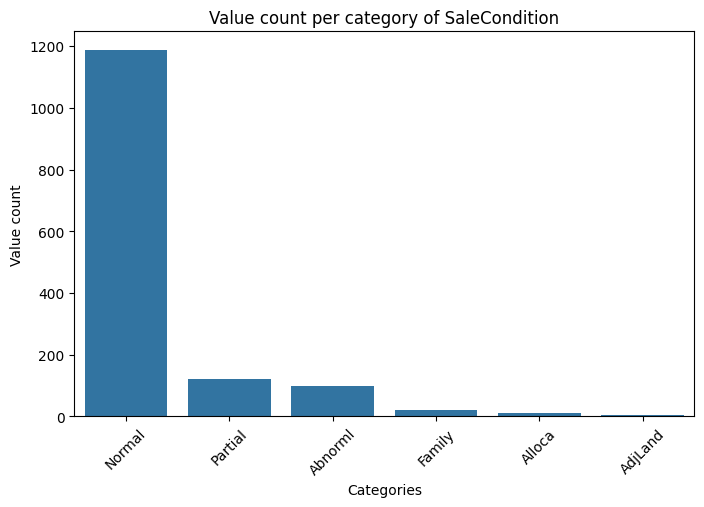

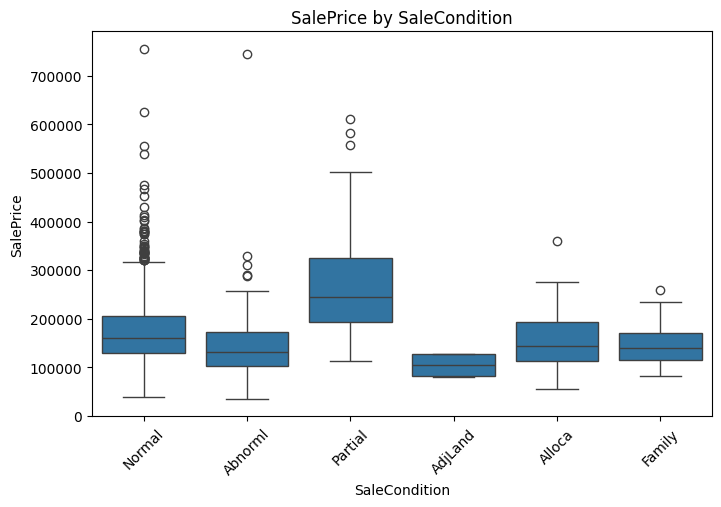

In [70]:
for col in cat_features:
    print(f'{col}:')
    vc = traindf[col].value_counts()
    print(f'- {len(vc)} unique categories')
    print(f'Percentage of values in top category: {traindf[col].value_counts(normalize=True).iloc[0] * 100:.2f}%')
    median_range = traindf.groupby(col)['SalePrice'].median().max() - traindf.groupby(col)['SalePrice'].median().min()
    flatness_score = median_range / SalePrice_IQR
    print(f'Flatness score (median range of SalePrice by category / SalePrice IQR): {flatness_score:.2f}')
    # Count plot
    plt.figure(figsize=(8, 5))
    sns.countplot(data=traindf, x=col, order=vc.index)
    plt.xticks(rotation=45)
    plt.title(f'Value count per category of {col}')
    plt.xlabel('Categories')
    plt.ylabel('Value count')
    plt.show()
    # Boxplot
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=col, y=traindf['SalePrice'], data=traindf)
    plt.title(f'SalePrice by {col}')
    plt.xticks(rotation=45)
    plt.show()

With this analysis we are looking for high cardinality features that should be taking into account when encoding, and low signal features based on flatness of target medians across categories, suggesting weak univariate predictive power.  

About high cardinality features, taking into account the size of our training dataset (~1500 examples), there are no cases that could be of concern, as the highest cardinality feature **Neighborhood** has 25 categories, while most features have 10 or less. Given this, one-hot encoding remains a viable option.  

And about low signal features, we will consider those with highly unbalanced distributions (>90% of values belonging to one category) and with a low flatness score.  
The flatness score is defined as the range of category medians of the target variable (**SalePrice**) divided by its interquartile range (IQR).  
This means a value of ~0 would mean minimal variation in target medians across categories, while a value of 1 would mean the range of category medians spans the whole IQR of the price.  
Given this, we will flag automatically those unbalanced features with a score <0.3, while those between 0.3 and 0.7 we will decide based on visual inspection of the plots.  

These are the features that match our requirements:  

| Feature | # categories | % values on top category | flatness score |
|---------|--------------|--------------------------|----------------|
|Street|2|99.58%|0.58|
|Alley|3|93.77%|0.63|
|Utilities|2|99.93%|0.3|
|LandSlope|3|94.60%|0.31|
|PavedDrive|3|91.76%|0.69|

As with the numerical features analysis, these features are flagged (in this case, as candidates for dropping due to low signal), but we will need to take into account the multivariate feature correlation, collinearity analysis, model prediction importance and domain-linked feature groups, before we make the final decision of dropping them or not.

### 2.5 Feature correlation

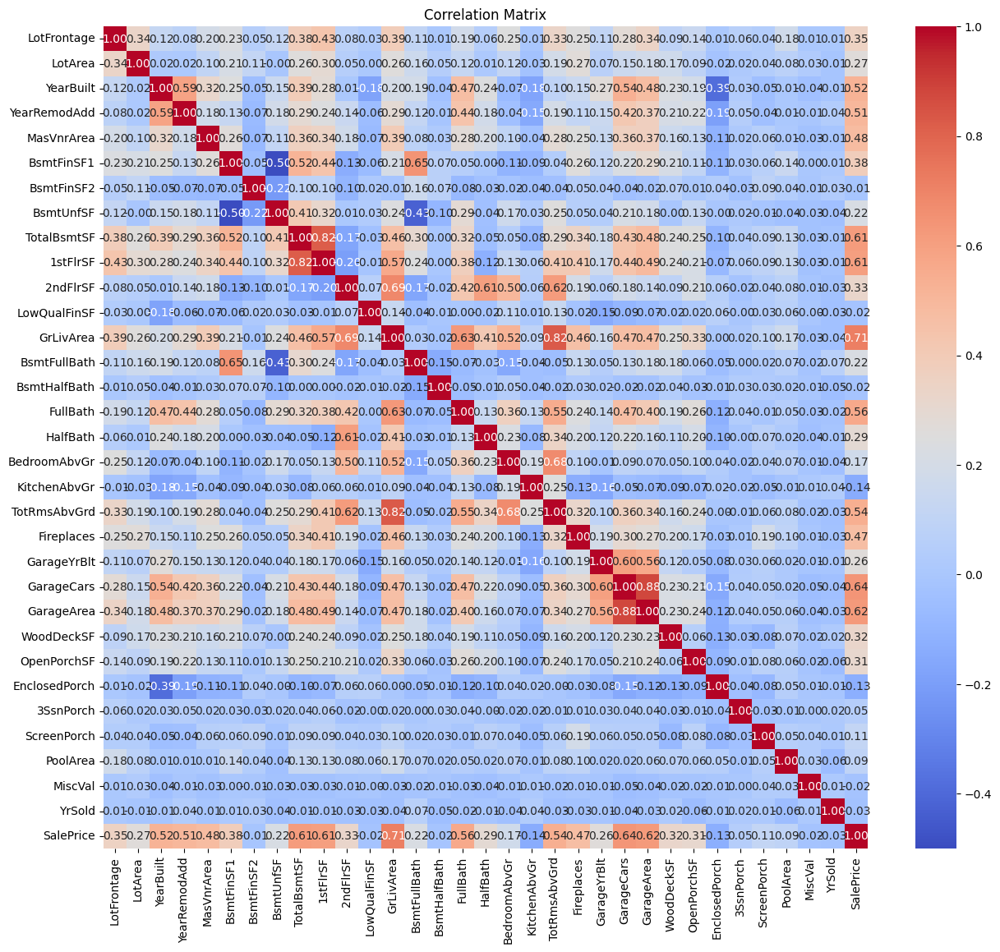

In [71]:
corr = traindf[num_features + ['SalePrice']].corr()
plt.figure(figsize=(15, 13))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

From the correlation matrix we can observe which features are the strongest linear predictors for the target variable **SalePrice**, and also we can see two pairs of highly correlated input features.  

**GarageArea** and **GarageCars** have very high mutual correlation (0.88), which is expected since one measures the area of the garage while the other measures the number of cars it can hold.  
As both have similar correlation with the target variable (0.62 and 0.64 respectively), we will flag **GarageCars** as a possible candidate to drop, given that **GarageArea** is a continuous variable and could potentially provide more useful information to the prediction task.

**GrLiveArea** and **TotRmsAbvGrd** are also highly correlated (0.82), which was to be expected too given that the number of rooms without counting bathrooms is directly related to the livable are of the house.  
As **GrLiveArea** has stronger colinearity with the target variable (0.71 vs 0.54), we will flag **TotRmsAbvGrd** as a possible candidates to drop due to potential redundancy.  

Next, we visualize the five most correlated features (without **GarageCars**) against SalePrice using scatterplots to inspect the relationship patterns:

Top 5 features correlated with SalePrice: ['GrLivArea', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath']


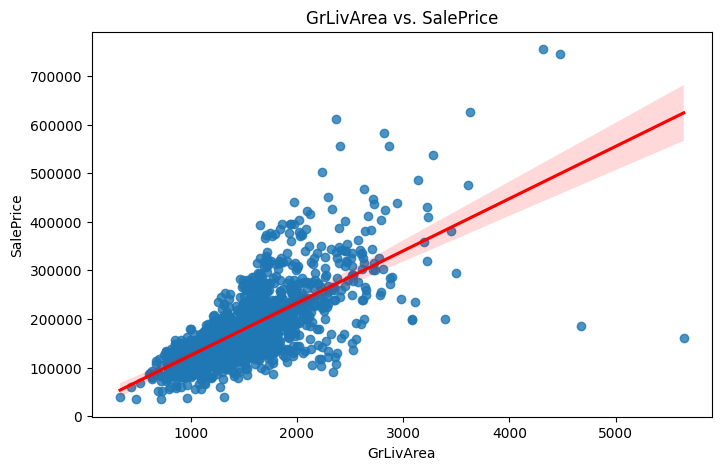

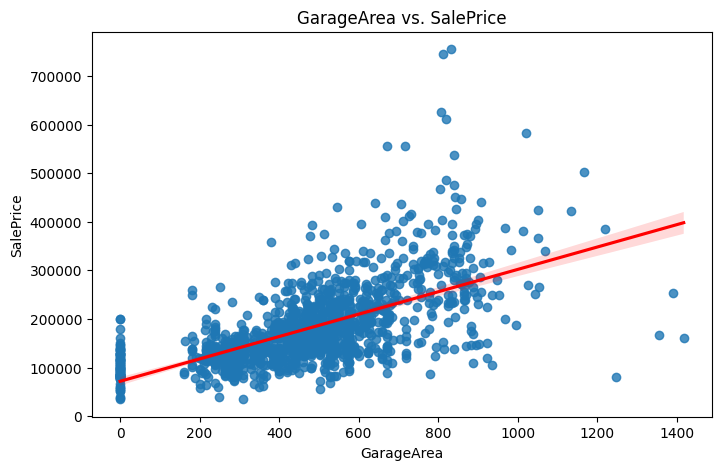

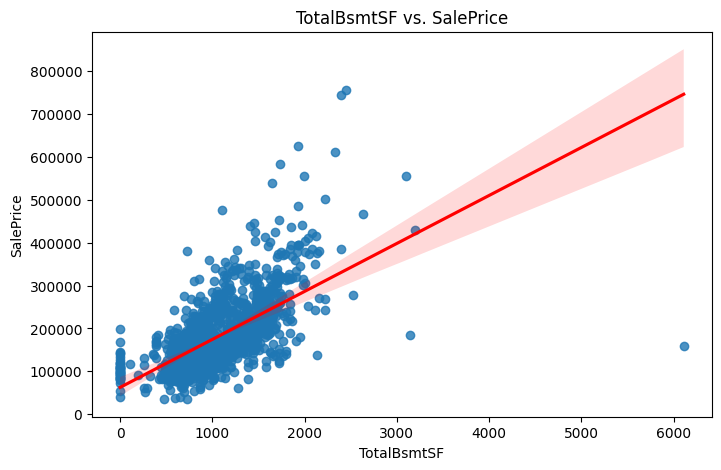

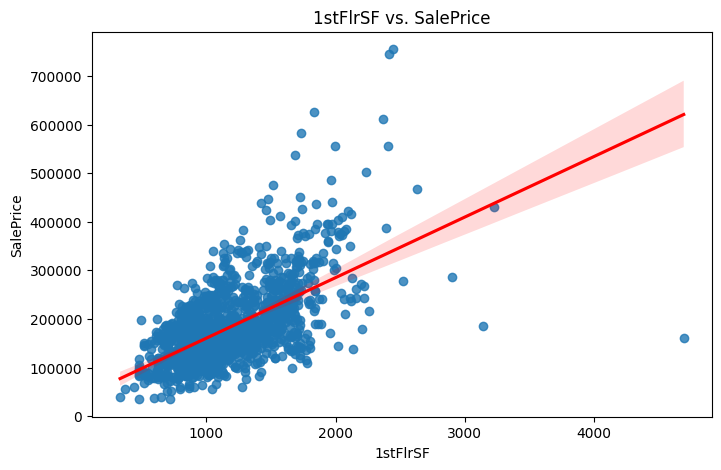

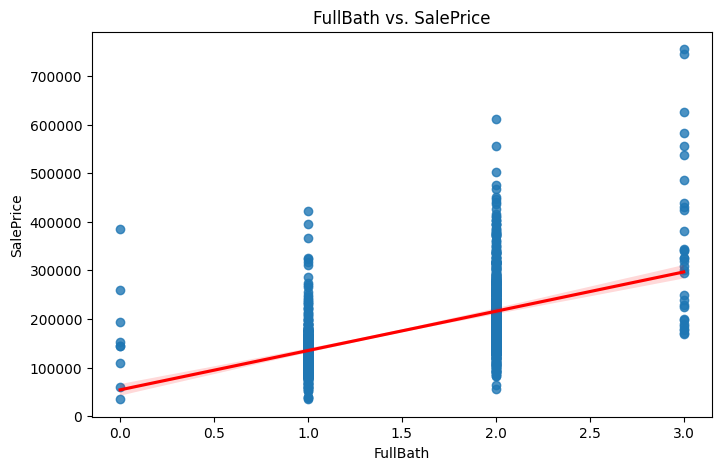

In [72]:
top_corr = corr['SalePrice'].drop(['SalePrice', 'GarageCars']).abs().sort_values(ascending=False).head(5).index.tolist()
print(f'Top 5 features correlated with SalePrice: {top_corr}')
for col in top_corr:
    plt.figure(figsize=(8, 5))
    sns.regplot(x=traindf[col], y=traindf['SalePrice'], line_kws={'color':'red'})
    plt.title(f'{col} vs. SalePrice')
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    plt.show()

After analysing the pair-wise linearity of the numerical features, lets calculate the VIF values to analyse any possible multicollinearity.  

In [73]:
def vif(df, num_features):
    """
    Calculate Variance Inflation Factor (VIF) for the numerical features of a dataset (Pandas dataframe).
    """
    X = df[num_features].copy()

    # Add constant term for intercept
    X= add_constant(X, has_constant='add')

    # Compute VIFs
    vif_df = pd.DataFrame({
        'Feature': X.columns,
        'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    })

    # Drop the constant term
    vif_df = vif_df[vif_df["Feature"] != "const"]

    # Sort by VIF in descending order
    vif_df = vif_df.sort_values(by="VIF", ascending=False).reset_index(drop=True)

    return vif_df

In [74]:
vif_results = vif(traindf, num_features)
vif_results.head(15)

/home/kev/ml-env/lib/python3.12/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,Feature,VIF
0,BsmtFinSF2,inf
1,BsmtUnfSF,inf
2,BsmtFinSF1,inf
3,GrLivArea,inf
4,LowQualFinSF,inf
5,2ndFlrSF,inf
6,1stFlrSF,inf
7,TotalBsmtSF,inf
8,GarageCars,5.944560
9,GarageArea,5.288135


We use 5 as a threshold to flag potential multicollinearity and 10 for more severe cases, following commonly used guidelines (Kutner et al., 2004).  
*(Kutner, M. H., Nachtsheim, C. J., & Neter, J. (2004). Applied Linear Regression Models (4th ed.). McGraw-Hill.)*

We have several features that measure surface areas with 'infinite' as VIF value given their direct relationship (the total basement area is the sum of the different basement areas, while **GrLivArea** is the sum of the livable areas above ground).  

Also with VIF > 5 we can see **GarageCars** and **GarageArea**, that as explaiend earlier with the correlation matrix, are highly related given that one measures the area and the other the number of cars it can fit.

## 3. Feature engineering  

### 3.1 New features

Most of the models we’ll be using (such as tree-based and deep learning models) are capable of learning interactions between features. However, explicitly providing these interactions through feature engineering can improve learning efficiency, reduce the risk of important relationships being missed, and often lead to better performance with less data.  

With this in mind, we will manually create new features based on available data that capture potentially useful relationships relevant to the task.

We are going to create the following on both sets of data:
- **TotalBathrooms**: Including basement ones
- **TotalSF**: Both floors plus basement
- **FinishedSF**: Total livable area (excluding unfinished basement)
- **Has2ndFloor**: Yes/No
- **HasBasement**: Yes/No
- **HasGarage**: Yes/No
- **HasPool**: Yes/No
- **HouseAge**: Years from when it was build till sale
- **GarageAge**: Years from when it was build till sale
- **RemodelAge**: Years from last remodelation till sale
- **WasRemodeled**: Yes/No
- **QualityIndex**: Ratio expressing overall quality and condition
- **LotRatio**: Ratio expressing relative house to land size (area)

In [75]:
traindf['TotalBathrooms'] = traindf['FullBath'] + (0.5 * traindf['HalfBath']) + traindf['BsmtFullBath'] + (0.5 * traindf['BsmtHalfBath'])
testdf['TotalBathrooms'] = testdf['FullBath'] + (0.5 * testdf['HalfBath']) + testdf['BsmtFullBath'] + (0.5 * testdf['BsmtHalfBath'])

traindf['TotalSF'] = traindf['TotalBsmtSF'] + traindf['1stFlrSF'] + traindf['2ndFlrSF']
testdf['TotalSF'] = testdf['TotalBsmtSF'] + testdf['1stFlrSF'] + testdf['2ndFlrSF']

traindf['TotalFinSF'] = traindf['BsmtFinSF1'] + traindf['BsmtFinSF2'] + traindf['1stFlrSF'] + traindf['2ndFlrSF']
testdf['TotalFinSF'] = testdf['BsmtFinSF1'] + testdf['BsmtFinSF2'] + testdf['1stFlrSF'] + testdf['2ndFlrSF']

traindf['Has2ndFloor'] = (traindf['2ndFlrSF'] > 0).astype(int)
testdf['Has2ndFloor'] = (testdf['2ndFlrSF'] > 0).astype(int)

traindf['HasBasement'] = (traindf['TotalBsmtSF'] > 0).astype(int)
testdf['HasBasement'] = (testdf['TotalBsmtSF'] > 0).astype(int)

traindf['HasGarage'] = (traindf['GarageArea'] > 0).astype(int)
testdf['HasGarage'] = (testdf['GarageArea'] > 0).astype(int)

traindf['HasPool'] = (traindf['PoolArea'] > 0).astype(int)
testdf['HasPool'] = (testdf['PoolArea'] > 0).astype(int)

traindf['HouseAge'] = traindf['YrSold'] - traindf['YearBuilt']
testdf['HouseAge'] = testdf['YrSold'] - testdf['YearBuilt']

traindf['GarageAge'] = traindf['YrSold'] - traindf['GarageYrBlt']
traindf.loc[traindf['GarageYrBlt'] == -1, 'GarageAge'] = -1 
testdf['GarageAge'] = testdf['YrSold'] - testdf['GarageYrBlt']
testdf.loc[testdf['GarageYrBlt'] == -1, 'GarageAge'] = -1 

traindf['RemodelAge'] = traindf['YrSold'] - traindf['YearRemodAdd']
traindf.loc[traindf['RemodelAge'] < 0, 'RemodelAge'] = 0
testdf['RemodelAge'] = testdf['YrSold'] - testdf['YearRemodAdd']
testdf.loc[testdf['RemodelAge'] < 0, 'RemodelAge'] = 0

traindf['WasRemodel'] = (traindf['YearRemodAdd'] != traindf['YearBuilt']).astype(int)
testdf['WasRemodel'] = (testdf['YearRemodAdd'] != testdf['YearBuilt']).astype(int)

traindf['QualityIndex'] = traindf['OverallQual'] * traindf['OverallCond']
testdf['QualityIndex'] = testdf['OverallQual'] * testdf['OverallCond']

traindf['LotRatio'] = traindf['GrLivArea'] / traindf['LotArea']
testdf['LotRatio'] = testdf['GrLivArea'] / testdf['LotArea']

#### 3.1.1 Feature analysis + correlation

We will follow the same steps as with the original features.  
First we will explore the analyse the newly created features individually and then we will check again the correlation between all features.

In [76]:
new_num = ['TotalBathrooms', 'TotalSF', 'TotalFinSF', 'HouseAge', 'GarageAge', 'RemodelAge', 'QualityIndex', 'LotRatio']
new_cat = ['Has2ndFloor', 'HasBasement', 'HasGarage', 'HasPool', 'WasRemodel']

TotalBathrooms:
count    1444.000000
mean        2.206371
std         0.782918
min         1.000000
25%         2.000000
50%         2.000000
75%         2.500000
max         6.000000
Name: TotalBathrooms, dtype: float64
Skewness: 0.2735975657624795
Kurtosis: -0.10823727695428964


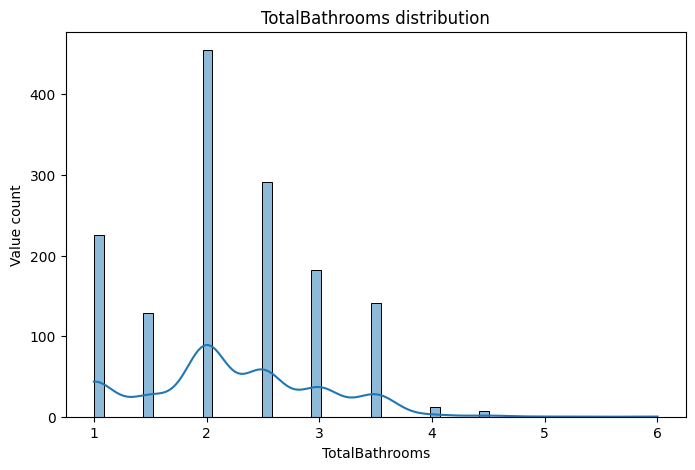

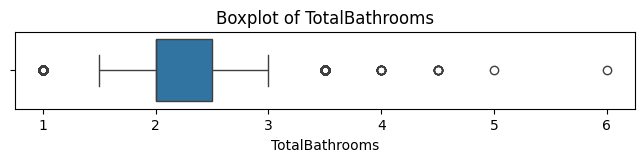

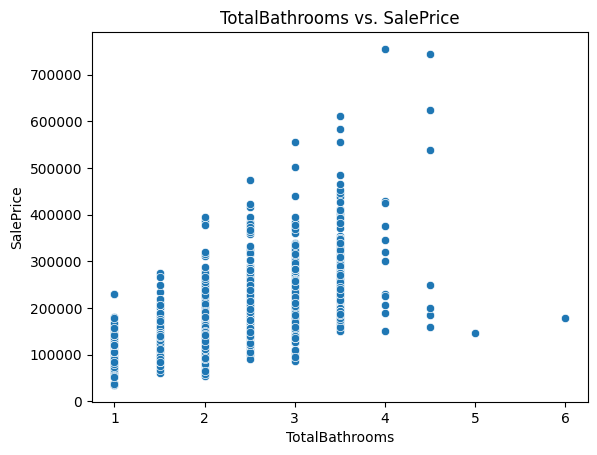

TotalSF:
count     1444.000000
mean      2563.333795
std        819.258732
min        334.000000
25%       2009.500000
50%       2470.500000
75%       3003.250000
max      11752.000000
Name: TotalSF, dtype: float64
Skewness: 1.795079954584537
Kurtosis: 12.935651415786023


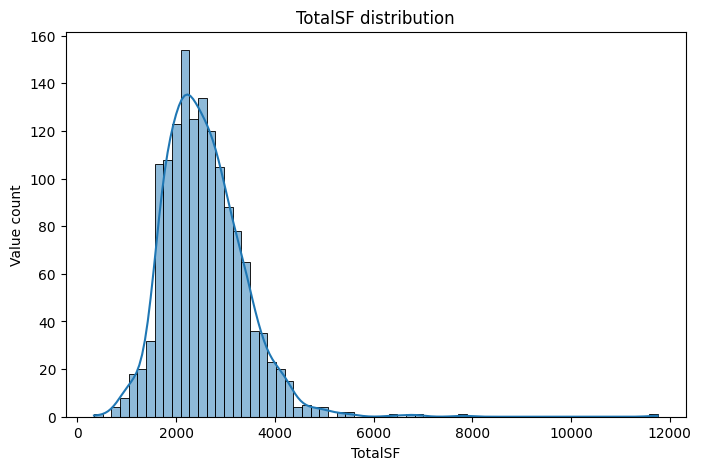

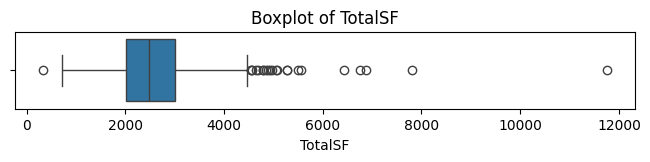

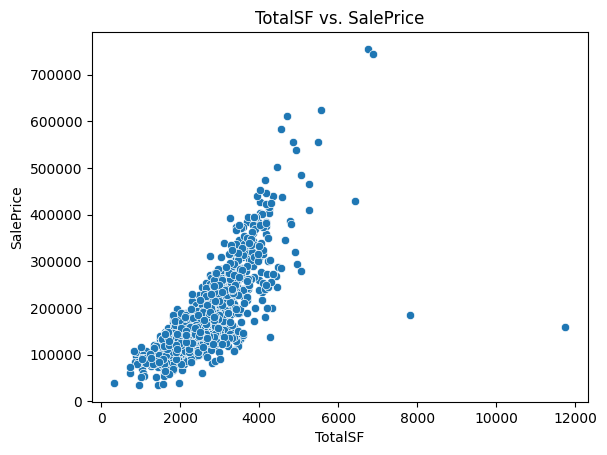

TotalFinSF:
count     1444.000000
mean      1997.155817
std        772.629921
min        334.000000
25%       1494.000000
50%       1862.500000
75%       2376.250000
max      11286.000000
Name: TotalFinSF, dtype: float64
Skewness: 2.1932765031597468
Kurtosis: 16.48860631468423


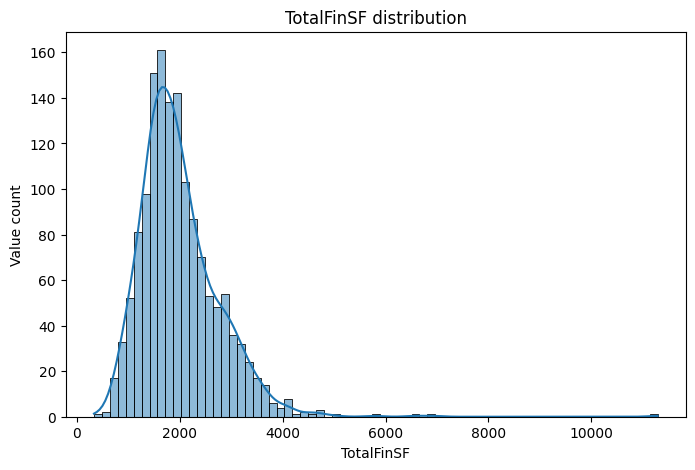

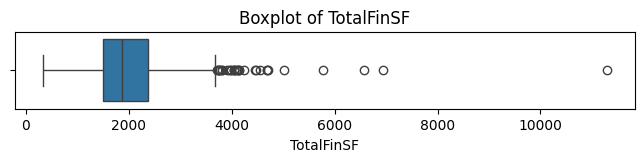

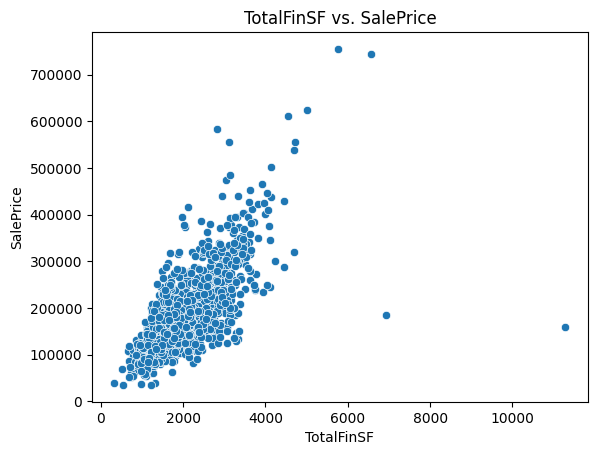

HouseAge:
count    1444.000000
mean       36.772853
std        30.265143
min         0.000000
25%         8.000000
50%        35.000000
75%        55.000000
max       136.000000
Name: HouseAge, dtype: float64
Skewness: 0.6025638992952712
Kurtosis: -0.44378997996841685


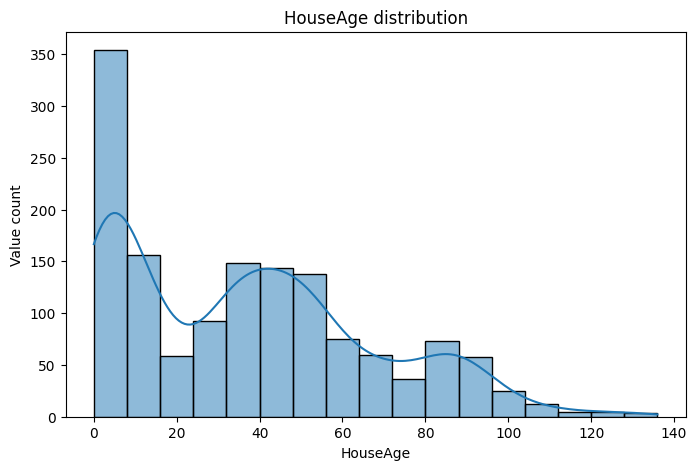

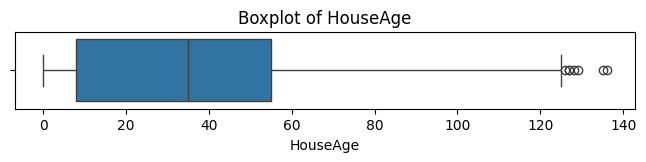

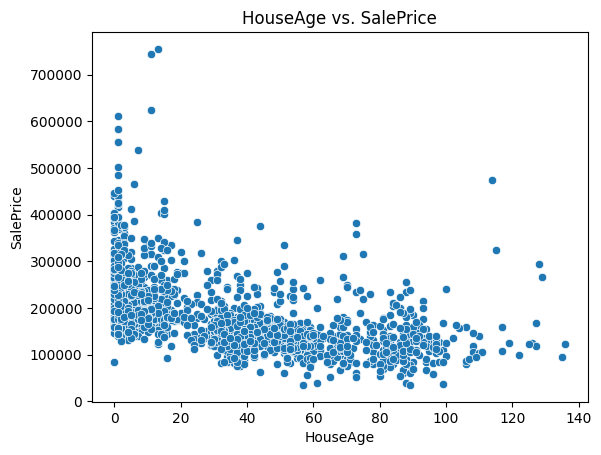

GarageAge:
count    1444.000000
mean       27.765928
std        25.035538
min        -1.000000
25%         5.000000
50%        24.000000
75%        46.000000
max       107.000000
Name: GarageAge, dtype: float64
Skewness: 0.6827107905957526
Kurtosis: -0.4109694766761627


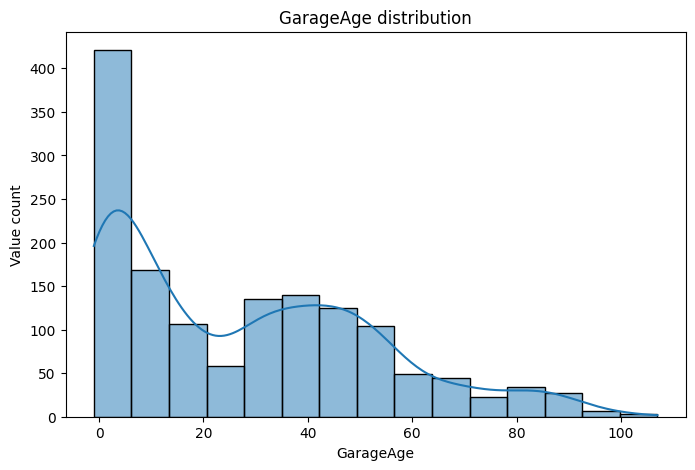

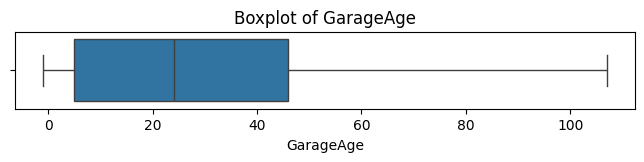

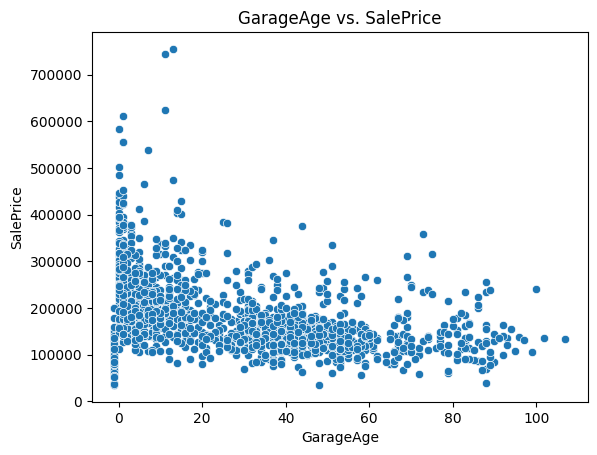

RemodelAge:
count    1444.000000
mean       23.040859
std        20.639442
min         0.000000
25%         4.000000
50%        14.000000
75%        41.000000
max        60.000000
Name: RemodelAge, dtype: float64
Skewness: 0.4972202236260768
Kurtosis: -1.2715450888679651


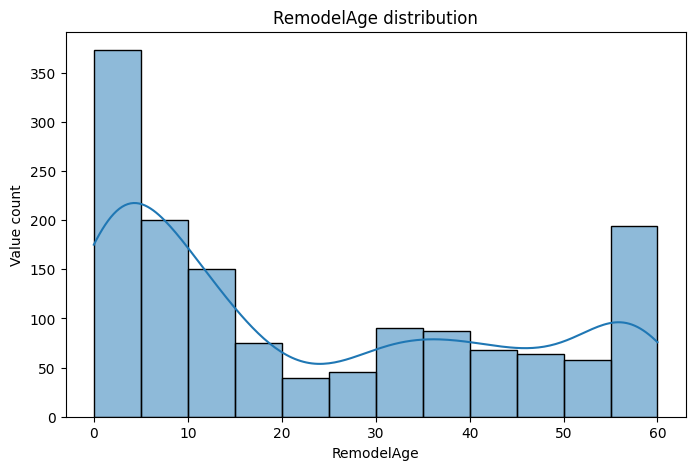

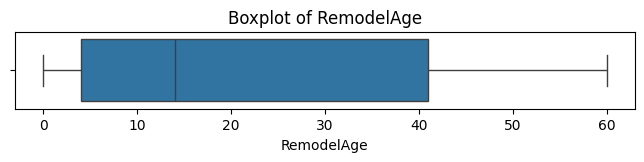

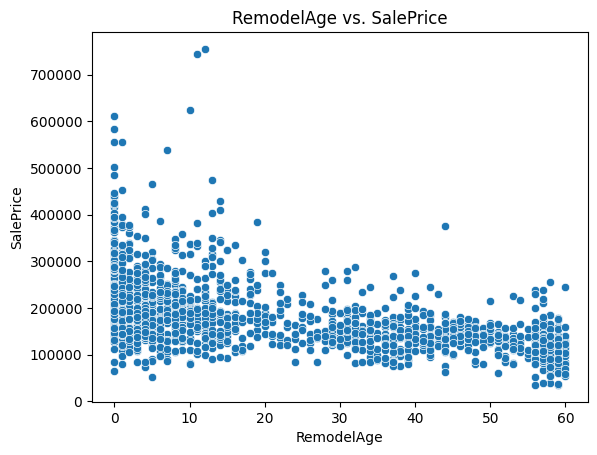

QualityIndex:
count    1444.000000
mean       33.867036
std         9.221779
min         1.000000
25%        30.000000
50%        35.000000
75%        40.000000
max        90.000000
Name: QualityIndex, dtype: float64
Skewness: 0.4420730589781433
Kurtosis: 2.8278238086752645


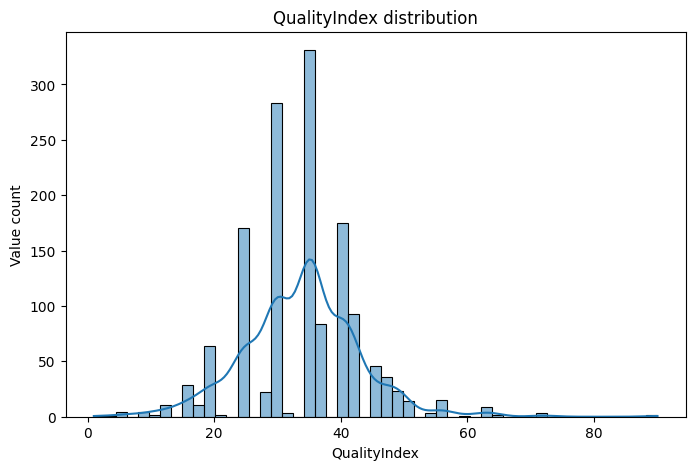

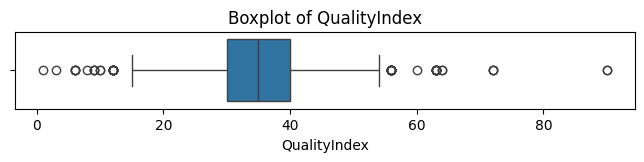

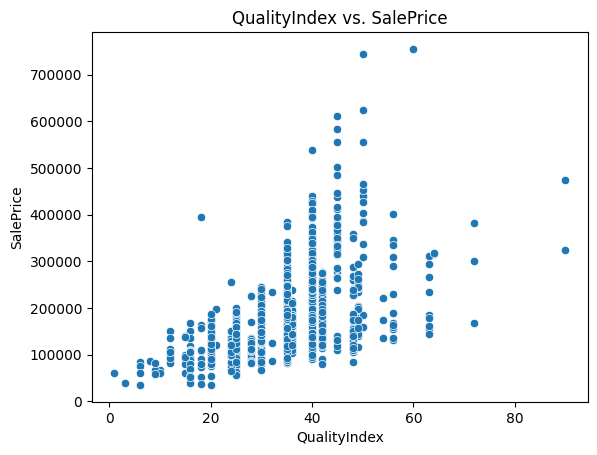

LotRatio:
count    1444.000000
mean        0.180894
std         0.112328
min         0.009459
25%         0.119181
50%         0.156195
75%         0.195149
max         0.945385
Name: LotRatio, dtype: float64
Skewness: 2.8398875462783795
Kurtosis: 10.2123246082243


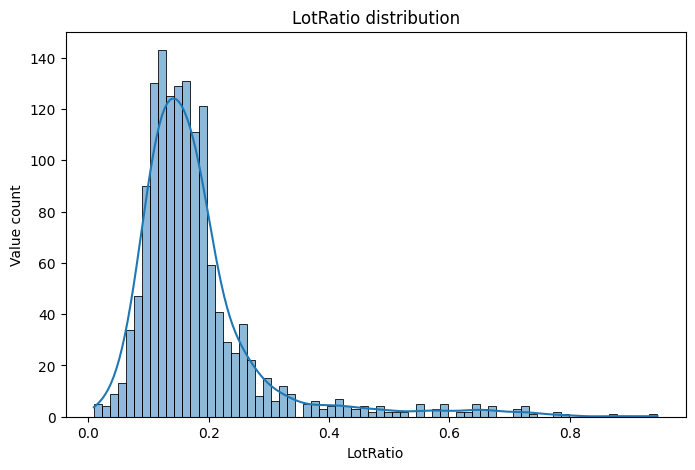

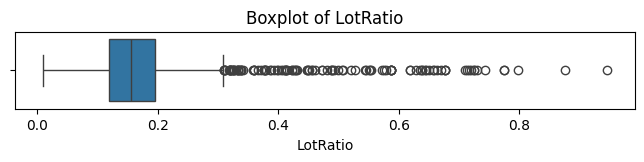

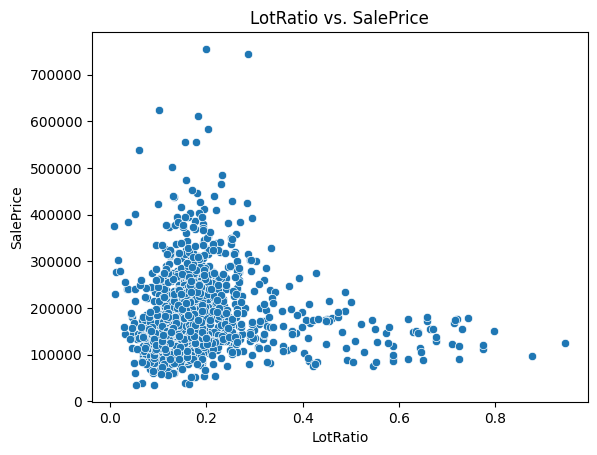

In [77]:
for col in new_num:
    print(f'{col}:')
    print(traindf[col].describe())
    print(f'Skewness: {traindf[col].skew()}')
    print(f'Kurtosis: {traindf[col].kurt()}')
    # Histogram with KDE
    plt.figure(figsize=(8, 5))
    sns.histplot(traindf[col], kde=True)
    plt.title(f'{col} distribution')
    plt.xlabel(col)
    plt.ylabel('Value count')
    plt.show()
    # Boxplot
    plt.figure(figsize=(8, 1))
    sns.boxplot(x=traindf[col])
    plt.title(f'Boxplot of {col}')
    plt.show()
    # Scatter plot against SalePrice
    sns.scatterplot(data=traindf, x=col, y=traindf['SalePrice'])
    plt.title(f'{col} vs. SalePrice')
    plt.show()


Feature: TotalSF
Original:
count     1444.000000
mean      2563.333795
std        819.258732
min        334.000000
25%       2009.500000
50%       2470.500000
75%       3003.250000
max      11752.000000
Name: TotalSF, dtype: float64
Skewness: 1.795079954584537
Kurtosis: 12.935651415786023

Log-transformed:
count    1444.000000
mean        7.801147
std         0.313210
min         5.811141
25%         7.605641
50%         7.812176
75%         8.007450
max         9.371779
Name: TotalSF, dtype: float64
Skewness: -0.35852262269163554
Kurtosis: 2.0235321402488657


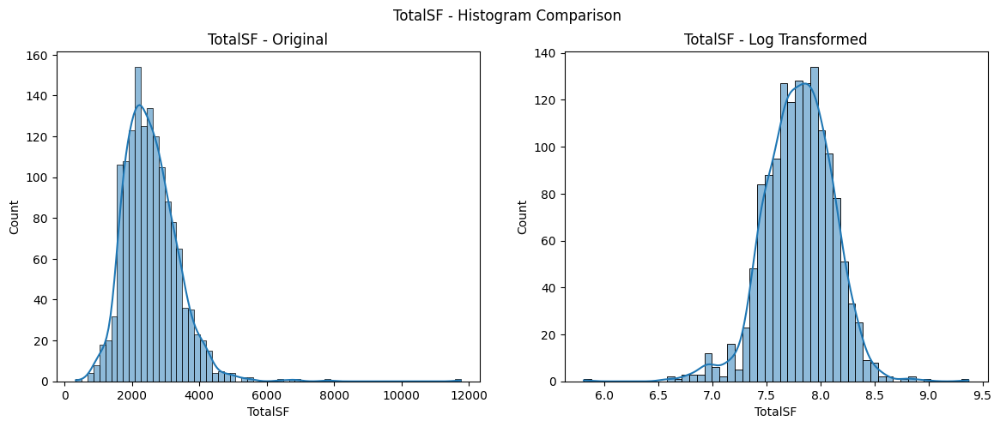

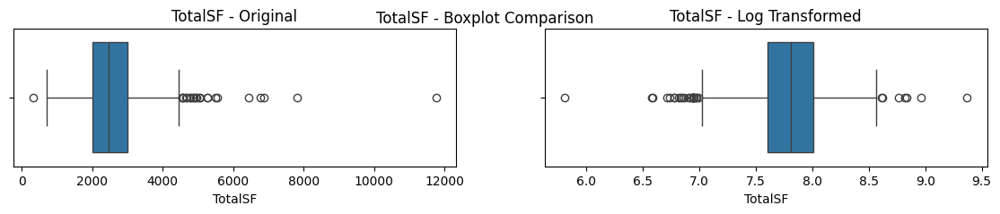

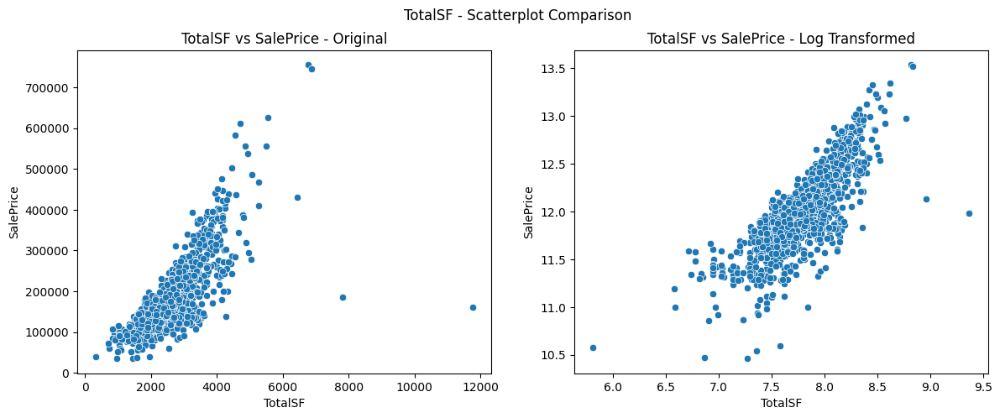


Feature: TotalFinSF
Original:
count     1444.000000
mean      1997.155817
std        772.629921
min        334.000000
25%       1494.000000
50%       1862.500000
75%       2376.250000
max      11286.000000
Name: TotalFinSF, dtype: float64
Skewness: 2.1932765031597468
Kurtosis: 16.48860631468423

Log-transformed:
count    1444.000000
mean        7.533179
std         0.363958
min         5.811141
25%         7.309212
50%         7.529675
75%         7.773279
max         9.331318
Name: TotalFinSF, dtype: float64
Skewness: -0.05720094789344715
Kurtosis: 0.7293235955997814


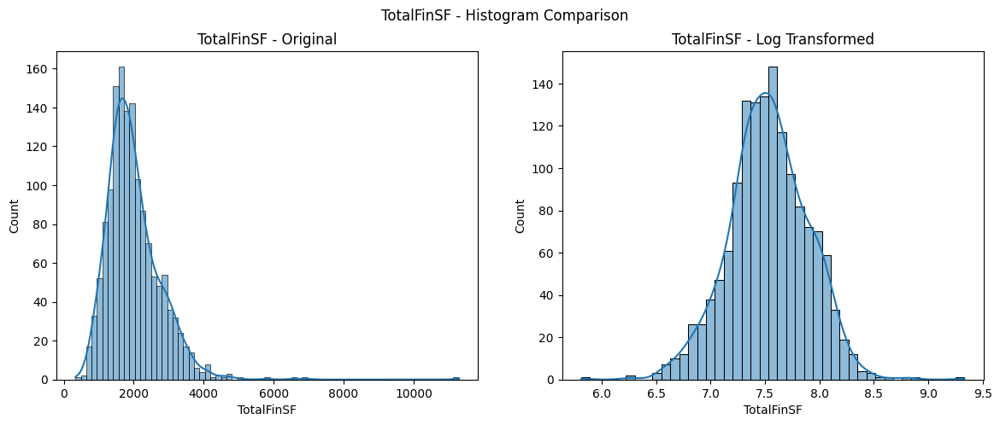

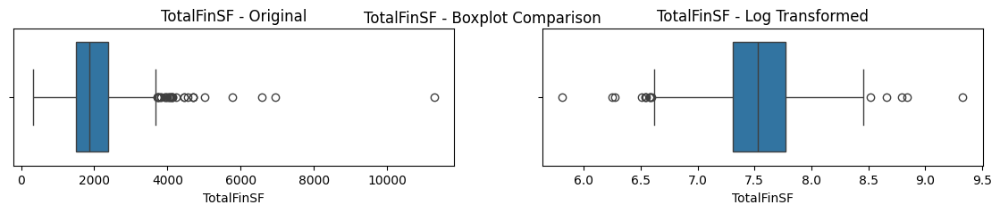

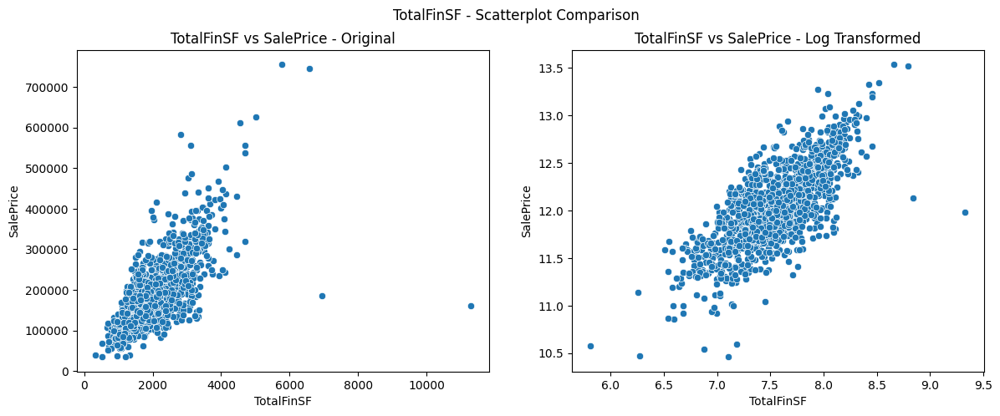


Feature: QualityIndex
Original:
count    1444.000000
mean       33.867036
std         9.221779
min         1.000000
25%        30.000000
50%        35.000000
75%        40.000000
max        90.000000
Name: QualityIndex, dtype: float64
Skewness: 0.4420730589781433
Kurtosis: 2.8278238086752645

Log-transformed:
count    1444.000000
mean        3.479306
std         0.319033
min         0.000000
25%         3.401197
50%         3.555348
75%         3.688879
max         4.499810
Name: QualityIndex, dtype: float64
Skewness: -2.187480518379524
Kurtosis: 14.604533140651938


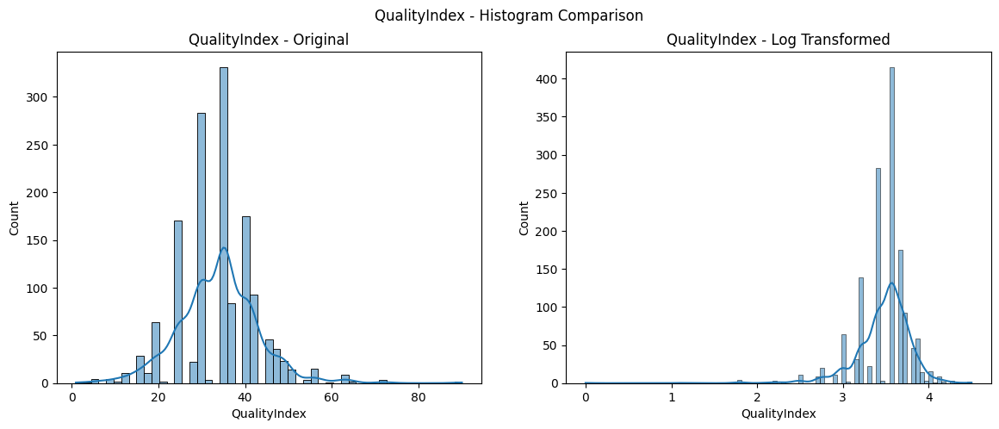

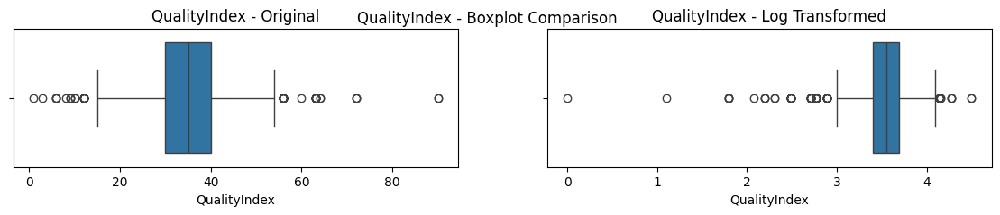

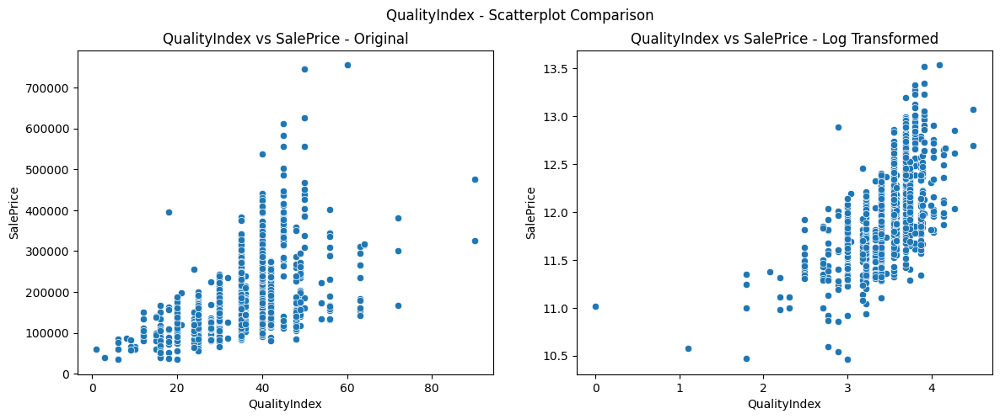


Feature: LotRatio
Original:
count    1444.000000
mean        0.180894
std         0.112328
min         0.009459
25%         0.119181
50%         0.156195
75%         0.195149
max         0.945385
Name: LotRatio, dtype: float64
Skewness: 2.8398875462783795
Kurtosis: 10.2123246082243

Log-transformed:
count    1444.000000
mean       -1.841952
std         0.497100
min        -4.660790
25%        -2.127114
50%        -1.856651
75%        -1.633991
max        -0.056163
Name: LotRatio, dtype: float64
Skewness: 0.10866881760703027
Kurtosis: 3.195883199867009


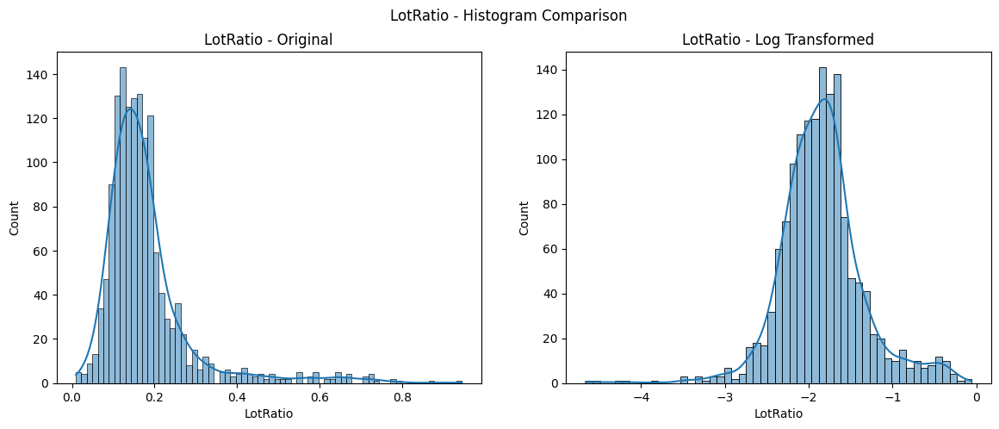

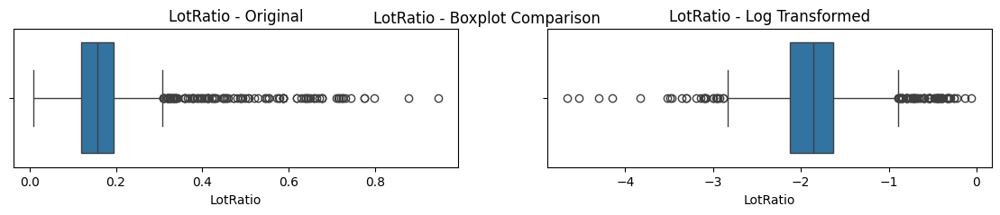

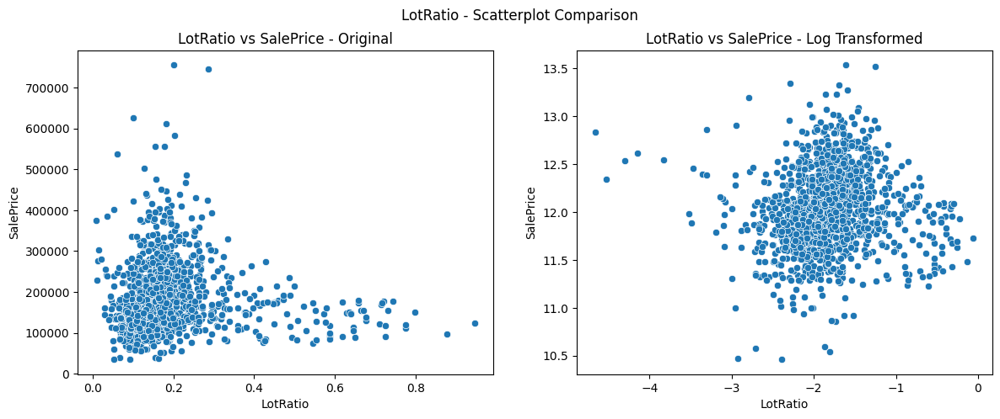

In [78]:
for col in ['TotalSF', 'TotalFinSF', 'QualityIndex', 'LotRatio']:
    # Prepare data
    original = traindf[col]
    log_transformed = np.log(traindf[col])

    # Summary stats
    print(f'\nFeature: {col}')
    print('Original:')
    print(original.describe())
    print(f'Skewness: {original.skew()}')
    print(f'Kurtosis: {original.kurt()}')
    
    print('\nLog-transformed:')
    print(log_transformed.describe())
    print(f'Skewness: {log_transformed.skew()}')
    print(f'Kurtosis: {log_transformed.kurt()}')

    # Histogram comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.histplot(original, kde=True, ax=axes[0])
    axes[0].set_title(f'{col} - Original')
    sns.histplot(log_transformed, kde=True, ax=axes[1])
    axes[1].set_title(f'{col} - Log Transformed')
    plt.suptitle(f'{col} - Histogram Comparison')
    plt.show()

    # Boxplot comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 2))
    sns.boxplot(x=original, ax=axes[0])
    axes[0].set_title(f'{col} - Original')
    sns.boxplot(x=log_transformed, ax=axes[1])
    axes[1].set_title(f'{col} - Log Transformed')
    plt.suptitle(f'{col} - Boxplot Comparison')
    plt.show()

    # Scatterplot comparison
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    sns.scatterplot(x=original, y=traindf['SalePrice'], ax=axes[0])
    axes[0].set_title(f'{col} vs SalePrice - Original')
    sns.scatterplot(x=log_transformed, y=np.log(traindf['SalePrice']), ax=axes[1])
    axes[1].set_title(f'{col} vs SalePrice - Log Transformed')
    plt.suptitle(f'{col} - Scatterplot Comparison')
    plt.show()

Has2ndFloor:
- 2 unique categories
Percentage of values in top category: 56.72%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.32


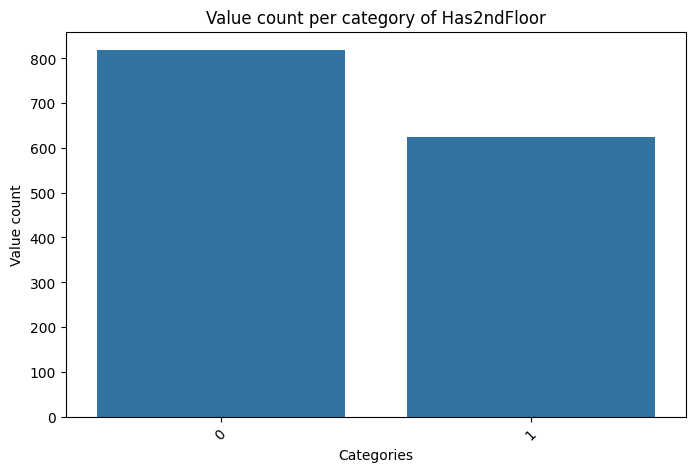

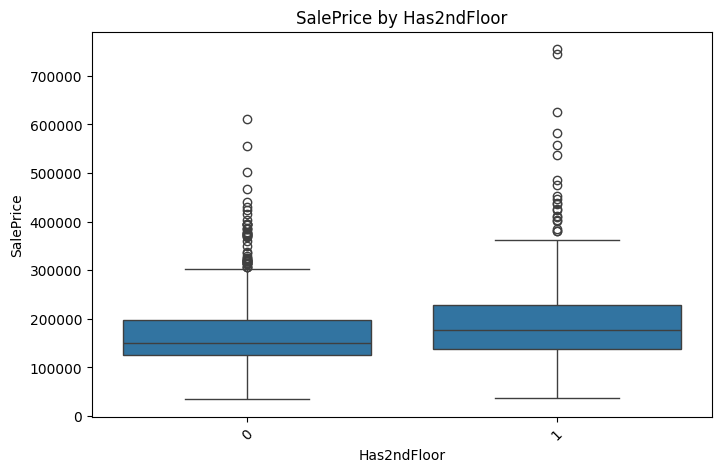

HasBasement:
- 2 unique categories
Percentage of values in top category: 97.44%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.75


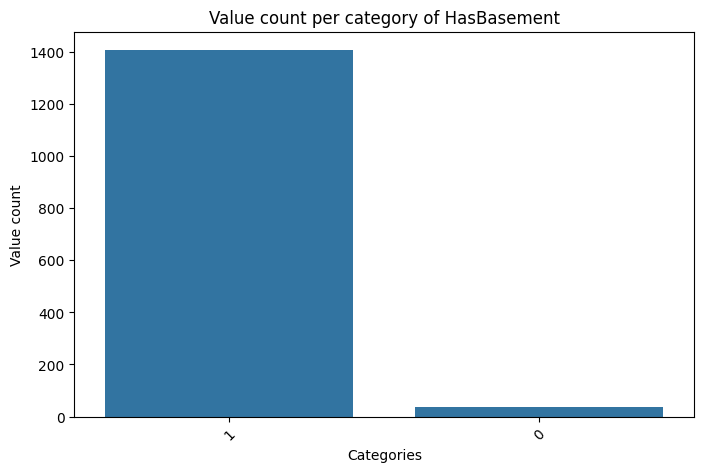

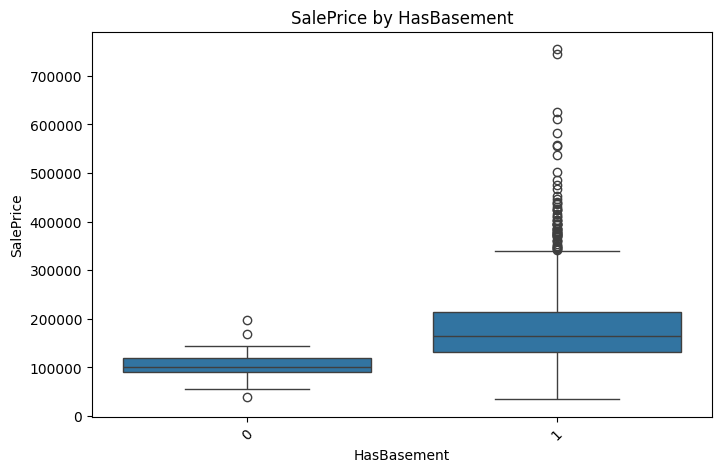

HasGarage:
- 2 unique categories
Percentage of values in top category: 94.39%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.80


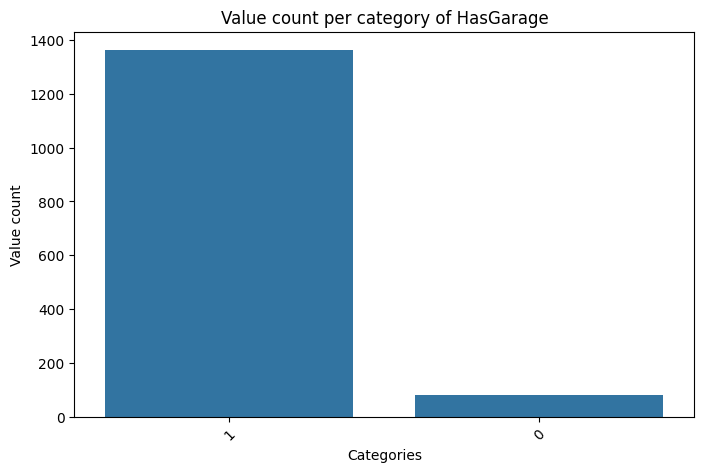

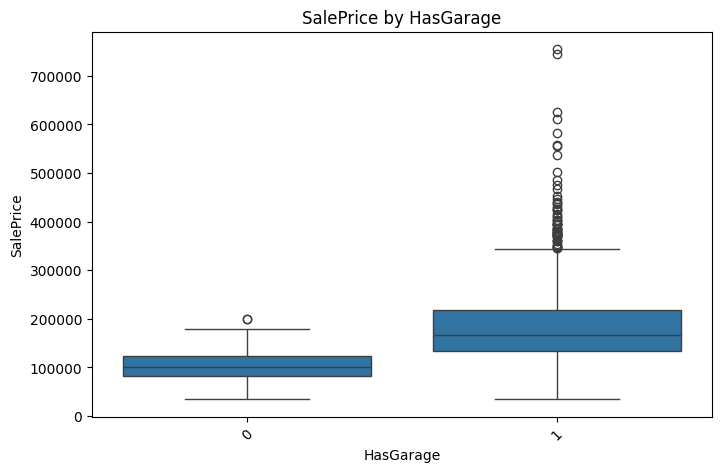

HasPool:
- 2 unique categories
Percentage of values in top category: 99.52%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.87


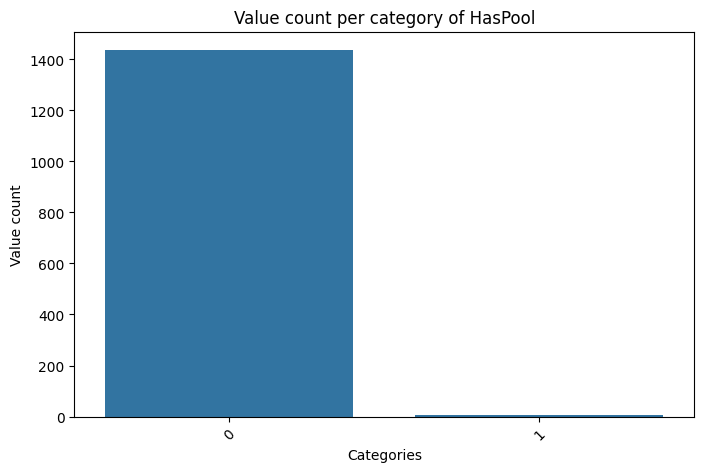

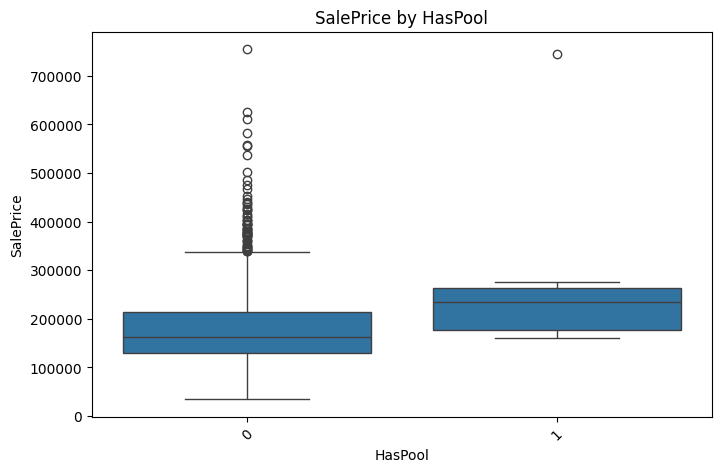

WasRemodel:
- 2 unique categories
Percentage of values in top category: 52.22%
Flatness score (median range of SalePrice by category / SalePrice IQR): 0.17


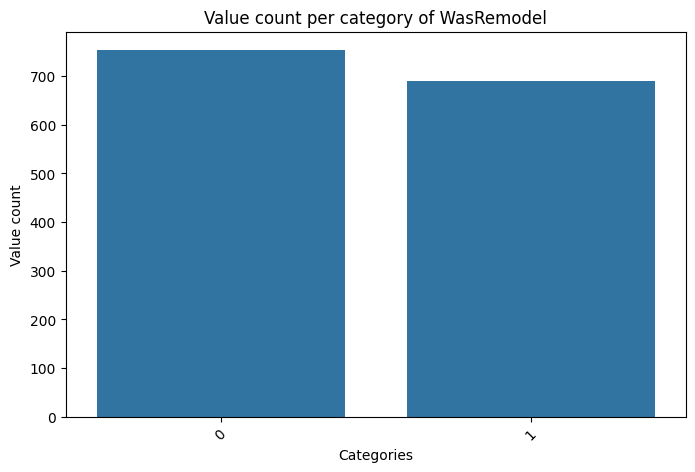

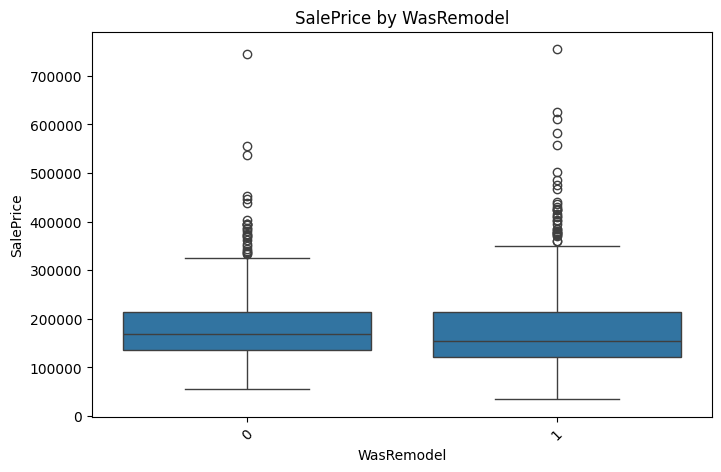

In [79]:
for col in new_cat:
    print(f'{col}:')
    vc = traindf[col].value_counts()
    print(f'- {len(vc)} unique categories')
    print(f'Percentage of values in top category: {traindf[col].value_counts(normalize=True).iloc[0] * 100:.2f}%')
    median_range = traindf.groupby(col)['SalePrice'].median().max() - traindf.groupby(col)['SalePrice'].median().min()
    flatness_score = median_range / SalePrice_IQR
    print(f'Flatness score (median range of SalePrice by category / SalePrice IQR): {flatness_score:.2f}')
    # Count plot
    plt.figure(figsize=(8, 5))
    sns.countplot(data=traindf, x=col, order=vc.index)
    plt.xticks(rotation=45)
    plt.title(f'Value count per category of {col}')
    plt.xlabel('Categories')
    plt.ylabel('Value count')
    plt.show()
    # Boxplot
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=col, y=traindf['SalePrice'], data=traindf)
    plt.title(f'SalePrice by {col}')
    plt.xticks(rotation=45)
    plt.show()

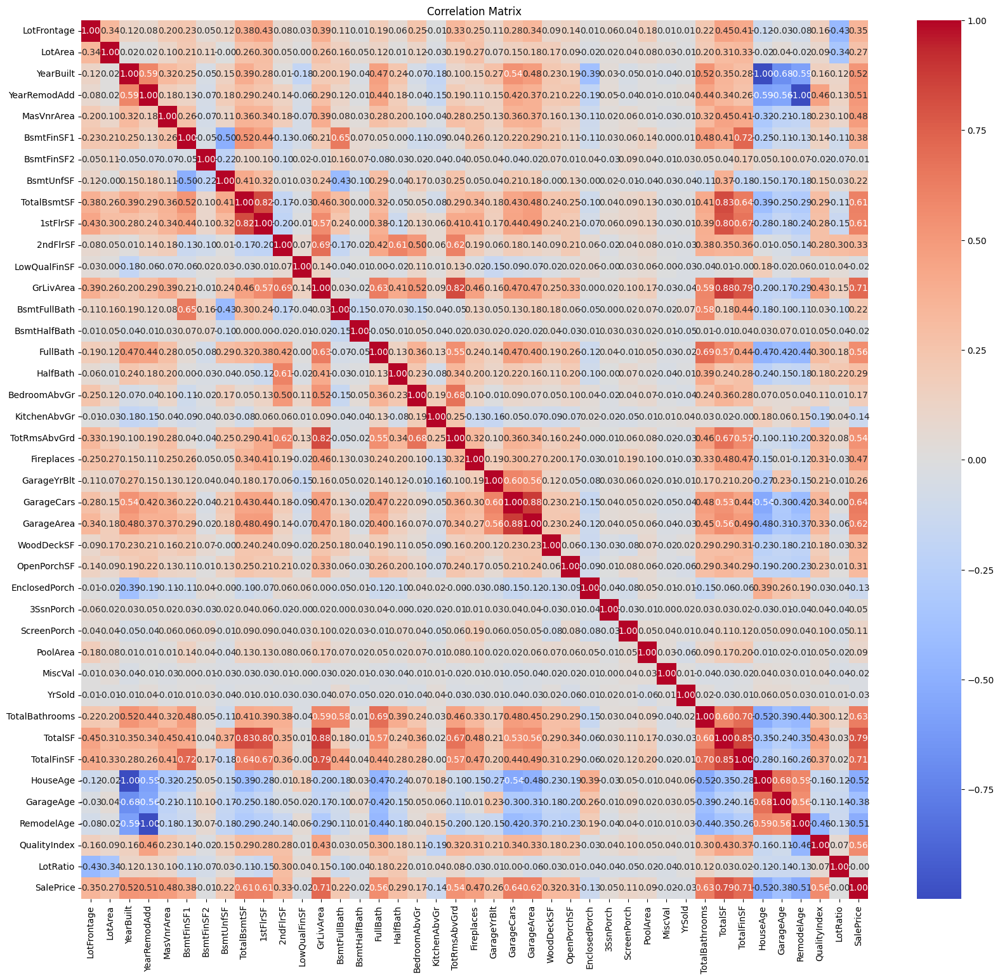

In [80]:
corr = traindf[num_features + new_num + ['SalePrice']].corr()
plt.figure(figsize=(20, 18))
sns.heatmap(corr, cmap='coolwarm', annot=True, fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

Let's analyze the correlation of the newly created features, as the original ones were already discussed on the main EDA section.  

We can separate these features in three main groups:  

First, **QualityIndex** and **LotRatio** have no strong linear correlation with any features, so we will not take any further action.  

Second, the 'age' and 'year' features are redundant, and **HouseAge** and **RedmodelAge** have r = -1 with **YearBuilt** and **YearRemodAdd** respectively. Given that the 'age' features provide the same information, with one less feature, and in a more meaningful format, we will flag as candidates for dropping **YearBuilt**, **YearRemodAdd**, **GarageYrBlt** and **YrSold**, in exchange we will keep **HouseAge**, **GarageAge** and **RemodelAge**.  


Third, the 'livable area' features:  
We have already noted the high correlation between **GrLivArea** and **TotRmsAbvGr** during the EDA of the original features.  
From the new ones, **TotalSF** shows high correlation (r > 0.8) with **TotalBsmtSF**, **1stFlrSF** and **GrLivArea**, and **TotalFinSF** with **GrLivArea** and **TotalSF**.  
This was to be expected given that:  
**TotalBsmtSF** = BsmtFinSF1 + BsmtFinSF2 + BsmtUnfSF  
**GrLivArea** = 1stFlrSF + 2ndFlrSF  
**TotalSF** = GrLivArea + TotalBsmtSF  
**TotalFinSF** = TotalSF - BsmtUnfSF  
As such, we will flag all these related features as possible low signal candidates in order to test different combinations and see what brings the best result.

Top 5 features correlated with SalePrice: ['TotalSF', 'GrLivArea', 'TotalFinSF', 'TotalBathrooms', 'GarageArea']


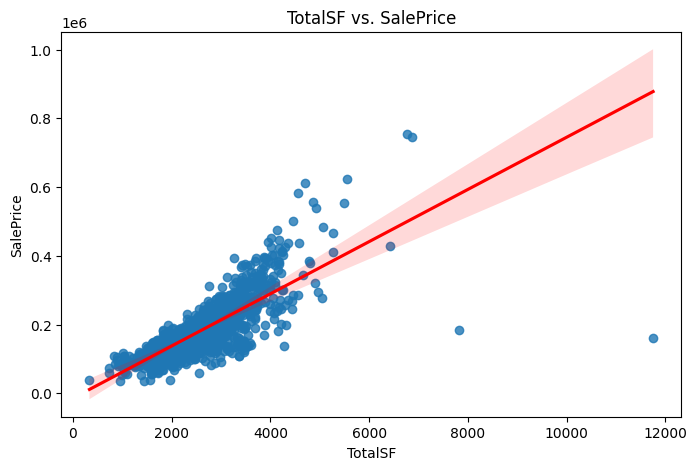

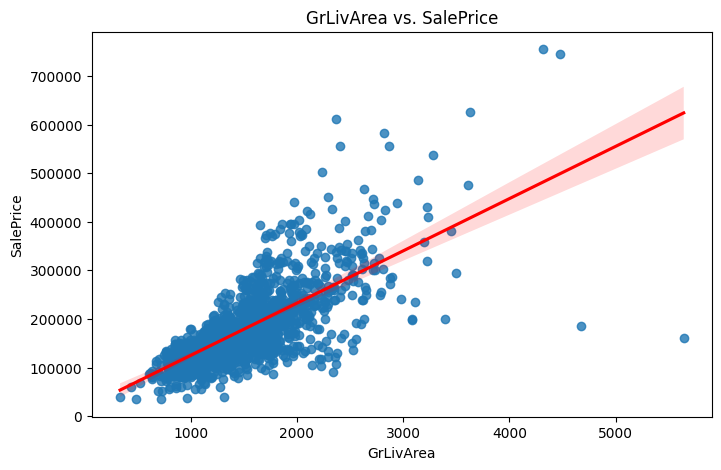

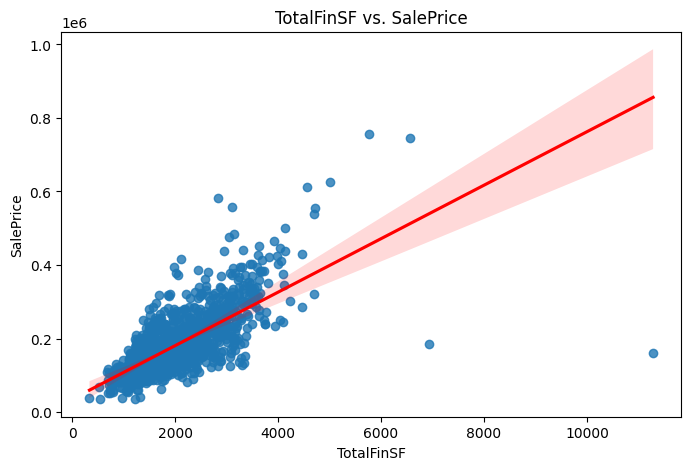

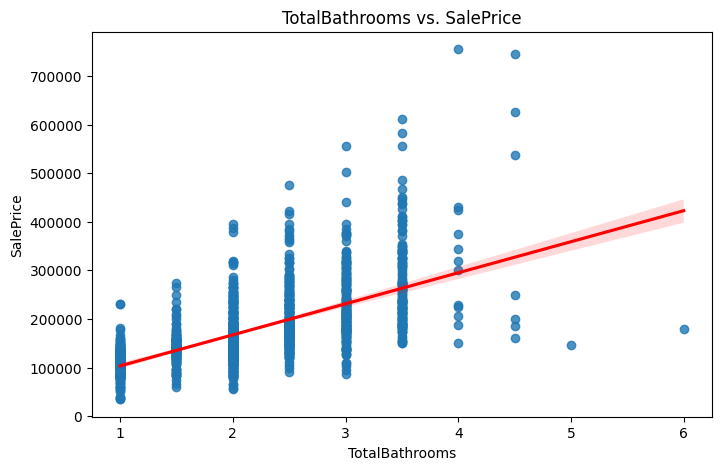

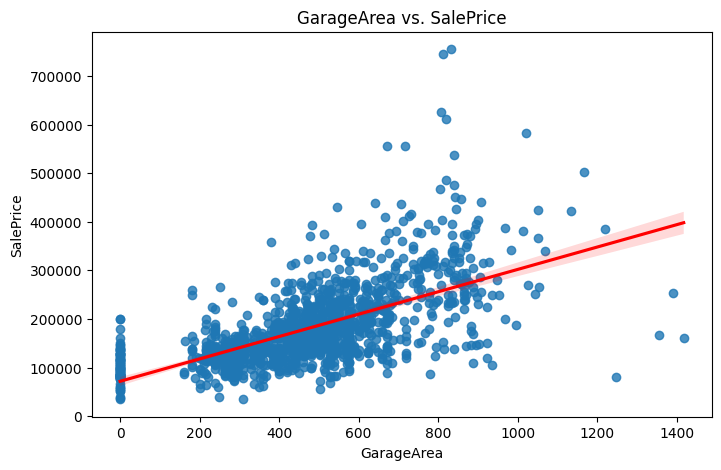

In [81]:
top_corr = corr['SalePrice'].drop(['SalePrice', 'GarageCars']).abs().sort_values(ascending=False).head(5).index.tolist()
print(f'Top 5 features correlated with SalePrice: {top_corr}')
for col in top_corr:
    plt.figure(figsize=(8, 5))
    sns.regplot(x=traindf[col], y=traindf['SalePrice'], line_kws={'color':'red'})
    plt.title(f'{col} vs. SalePrice')
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    plt.show()

And finally, lets check multicollinearity with the newly added features.

In [82]:
new_vif_results = vif(traindf, num_features + new_num)
new_vif_results.head(25)

/home/kev/ml-env/lib/python3.12/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,Feature,VIF
0,YearBuilt,inf
1,BsmtUnfSF,inf
2,BsmtFinSF2,inf
3,BsmtFinSF1,inf
4,LowQualFinSF,inf
5,2ndFlrSF,inf
6,1stFlrSF,inf
7,TotalBsmtSF,inf
8,HalfBath,inf
9,TotalSF,inf


As expected, the new features created as well as those used to create them, show high VIF values. But besides those, there is nothing unexpected to note.  

### 3.2 Domain-driven transformations

From the EDA with the original features, as well as the one done after we created some new ones, we have gathered a list of flagged candidates for either possibly benefiting of being log-transformed, or for being low signal features that could be dropped to simplify our models without losing predictive value.  

In order to evaluate and choose what actions we should perform, we have skipped sections **3.2 Domain-driven transformations** and **3.3 Drop unneeded columns** (with the exception of dropping the **Id** column), and we have trained and finetuned our models with all the features (original and new) without doing the final evaluation on the holdout set (only using the dev set).  

Now, we will use the performance of those models as baseline to measure what effect our actions have.    
For simplicity, we will only use our baseline (Ridge, linear) and Catboost (tree-based, and best performer) in the comparison:

Candidates for log transformation:

Log-transform candidates (log(x))  
Continuous, positively skewed (skew > 1), strictly positive:  
**LotFrontage**  
**LotArea**  
**1stFlrSF**  
**GrLivArea**  
**TotalSF**  
**TotalFinSF**  

Log-transform candidates (log1p(x))  
Continuous, positively skewed, ≥0, with moderate zero presence:  
**BsmtFinSF1**  
**TotalBsmtSF**  

Table tracking the results of our iterations:

In [83]:
transform_log = pd.read_csv('../outputs/transform_log.csv')
transform_log

,Step,Feature,Change,Ridge_dev_RMSE,Catboost_dev_RMSE,Decision
0,0,Baseline,-,0.160938,0.131526,-
1,1,LotFrontage,log(x),0.160772,0.131526,Keep
2,2,LotArea,log(x),0.150456,0.131526,Keep
3,3,1stFlrSF,log(x),0.150326,0.131526,Keep
4,4,GrLivArea,log(x),0.150229,0.131524,Keep
5,5,TotalSF,log(x),0.140368,0.131524,Keep
6,6,TotalFinSF,log(x),0.132261,0.131521,Keep
7,7,BsmtFinSF1,log1p(x),0.134126,0.131521,Revert
8,8,TotalBsmtSF,log1p(x),0.132160,0.131521,Keep


Final log-transformations chosen:

In [84]:
# Training set log transformations
traindf['LotFrontage'] = np.log(traindf['LotFrontage'])
traindf['LotArea'] = np.log(traindf['LotArea'])
traindf['1stFlrSF'] = np.log(traindf['1stFlrSF'])
traindf['GrLivArea'] = np.log(traindf['GrLivArea'])
traindf['TotalSF'] = np.log(traindf['TotalSF'])
traindf['TotalFinSF'] = np.log(traindf['TotalFinSF'])
traindf['TotalBsmtSF'] = np.log1p(traindf['TotalBsmtSF'])

# Test set log transformations
testdf['LotFrontage'] = np.log(testdf['LotFrontage'])
testdf['LotArea'] = np.log(testdf['LotArea'])
testdf['1stFlrSF'] = np.log(testdf['1stFlrSF'])
testdf['GrLivArea'] = np.log(testdf['GrLivArea'])
testdf['TotalSF'] = np.log(testdf['TotalSF'])
testdf['TotalFinSF'] = np.log(testdf['TotalFinSF'])
testdf['TotalBsmtSF'] = np.log1p(testdf['TotalBsmtSF'])

### 3.3 Drop unneeded columns

First, we will drop the **Id** column in both datasets, as it offers no useful information for this task.

In [85]:
traindf.drop('Id', axis=1, inplace=True)
test_id = testdf['Id'] # Save the Id column for submission later
testdf.drop('Id', axis=1, inplace=True)

Following the same process as with the log-transform candidates, we will evaluate the effect of dropping the low signal candidates, but we will need to use the insights gained so far together with the feature importance (based on our Catboost model) and domain knowledge, to avoid eliminating meaningful feature interactions.  

Low-signal candidates:   
Variables with no apparent trend in scatterplots, low variance or value density, redundant, or highly correlated with one or several features, which have potential for being dropped without impacting negatively the performance of our models, and maybe even improving it in some models.  
**MasVnrArea**  
**BsmtFinSF2**  
**LowQualFinSF**  
**OpenPorch**  
**EnclosedPorch**  
**3SsnPorch**  
**Screenporch**  
**MiscVal**  
**YrSold**  
**Street**  
**Alley**  
**Utilities**  
**LandSlope**  
**PavedDrive**  
**TotRmsAbvGrd**  
**GarageCars**  
**YrSold**  
**LotRatio**  
**YearBuilt**  
**YearRemodAdd**  
**GarageYrBlt**  
\+ 'livable area' features

Given that the number of candidates is high, we need to separate and group them, so we can deal with them in a more systematic approach.

Independent features (with no direct domain interactions):  
We will drop them individually.  
**MasVnrArea** + **MasVnrType** - We add the type of masonry veneer, as it would not make sense to drop the size but not the type.  
**MiscVal** + **MiscFeature** - Same with the miscellaneous feature and its value.  
**Street**  
**Alley**  
**Utilities**  
**LandSlope**  
**LotRatio**  
**PavedDrive**  
**GarageCars**  
**OpenPorchSF**  
**3SsnPorch**  
**EnclosedPorch**  
**ScreenPorch**  

'Year' features, replaced by 'Age' features as discussed in the correlation analysis of the new features:  
We will drop them as a group, and individually, and we will keep the best option.  
**YearBuilt**  
**YearRemodAdd**  
**GarageYrBlt**  
**YrSold**  

'Livable area' features: 
We will drop all base features, then all calculated features, and then we will drop them individually and keep the best option.  
Base features:  
**TotRmsAbvGrd**  
**1stFlrSF**  
**2ndFlrSF**  
**LowQualFinSF**  
**BsmtFinSF1**  
**BsmtFinSF2**  
**BsmtUnfSF**  
Computed features (sum of other areas):  
**TotalBsmtSF**  
**GrLivArea**  
**TotalSF** (engineered feature)  
**TotalFinSF**  (engineered feature)  
As this group has a high number of related features (as confirmed by the correlation matrix and VIF values), we will not drop them individually but instead we will try testing these subsets:  
-Base features only  
-Computed features only  
-All except engineered features  
-All except GrLivArea  
And after that we might consider dropping individual features depending on the results observed.  

In [86]:
drop_log = pd.read_csv('../outputs/drop_log.csv')
drop_log

,Step,Features,Change,Ridge_dev_RMSE,Catboost_dev_RMSE,Ridge_Decision,Catboost_Decision,Notes
0,0,Baseline,-,0.132160,0.131521,-,-,-
1,1,"MasVnrArea, MasVnrType",drop,0.132343,0.134136,Revert,Revert,-
2,2,"MiscVal, MiscFeature",drop,0.132182,0.130235,Revert,Keep,-
3,3,Street,drop,0.132169,0.131879,Revert,Revert,-
4,4,Alley,drop,0.131501,0.130613,Keep,Revert,-
5,5,Utilities,drop,0.131404,0.129169,Keep,Keep,-
6,6,LandSlope,drop,0.131547,0.130943,Revert,Revert,-
7,7,LotRatio,drop,0.131291,0.131992,Keep,Revert,-
8,8,PavedDrive,drop,0.131178,0.131422,Keep,Revert,-
9,9,GarageCars,drop,0.133614,0.130026,Revert,Revert,-


In [87]:
drop_linear = ['Alley', 'Utilities', 'LotRatio', 'PavedDrive', 'OpenPorchSF', '3SsnPorch', 'EnclosedPorch', 'YearRemodAdd', 'TotRmsAbvGrd', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'GrLivArea', 'BsmtFinType1', 'BsmtFinType2']
drop_tree = ['MiscVal', 'MiscFeature', 'Utilities', 'OpenPorchSF']

And we will save both engineered datasets (with the log transformations but without dropping any features).

In [88]:
train_eng_output_path = '../data/processed/train_engineered.csv'  # Output file path
traindf.to_csv(train_eng_output_path, index=False)

test_eng_output_path = '../data/processed/test_engineered.csv'  # Output file path
testdf.to_csv(test_eng_output_path, index=False)

## 4. Preprocessing

We are working with tabular data that includes both numerical and categorical features.  
Depending on the model type, specific preprocessing (like encoding categorical variables or normalizing numerical features) may be necessary.  

Since each model handles input data differently (some may not benefit from certain transformations or may even be incompatible with them), we will normaliza and/or encode variables when needed, separately for each model.

However, to ensure a fair comparison, we will apply some common transformations beforehand to create our shared 'starting point'.

### 4.1 Log-transform target variable

Let's transform our target variable **SalePrice**.

In [89]:
traindf['SalePrice'] = np.log(traindf['SalePrice']).astype(np.float32)

### 4.2 Sanitize variables data types

To avoid mixed data types problems, specially with the neural networks models, we will sanitize the data by making sure all data has the following format:  
- Numerical variables: float32
- Categorical variables: String

First we will update our lists containing which features are numerical and which categorical, to include the changes made on the **Feature engineering** section.

In [90]:
cat_features = [
    'MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
    'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
    'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st',
    'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
    'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',
    'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
    'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence',
    'MiscFeature', 'MoSold', 'SaleType', 'SaleCondition', 'Has2ndFloor', 'HasBasement',
    'HasGarage', 'HasPool', 'WasRemodel'
]

# Updated lists of categorical features for both sets of chosen features (section 3.3)
cat_features_linear = [x for x in cat_features if x not in drop_linear]
cat_features_tree = [x for x in cat_features if x not in drop_tree]


num_features = [
    'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
    'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
    'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
    'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars',
    'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
    'ScreenPorch', 'PoolArea', 'MiscVal', 'YrSold', 'TotalBathrooms', 'TotalSF',
    'TotalFinSF', 'HouseAge', 'GarageAge', 'RemodelAge', 'QualityIndex', 'LotRatio'
]

# Updated lists of numerical features for both sets of chosen features (section 3.3)
num_features_linear = [x for x in num_features if x not in drop_linear]
num_features_tree = [x for x in num_features if x not in drop_tree]

In [91]:
print(f'Number of categorical features: {len(cat_features)}')
print(f'Number of categorical features (linear selection): {len(cat_features_linear)}')
print(f'Number of categorical features (tree-based selection): {len(cat_features_tree)}\n')

print(f'Number of numerical features: {len(num_features)}')
print(f'Number of numerical features (linear selection): {len(num_features_linear)}')
print(f'Number of numerical features (tree-based selection): {len(num_features_tree)}')

Number of categorical features: 52
Number of categorical features (linear selection): 47
Number of categorical features (tree-based selection): 50

Number of numerical features: 40
Number of numerical features (linear selection): 27
Number of numerical features (tree-based selection): 38


And now we will loop over the features changing types where necessary.

In [92]:
for cat in cat_features:
    traindf[cat] = traindf[cat].astype(str)
    testdf[cat] = testdf[cat].astype(str)

for num in num_features:
    traindf[num] = traindf[num].astype(np.float32)
    testdf[num] = testdf[num].astype(np.float32)

### 4.3 Train/dev/holdout data split

Our dataset is relatively small. As mentioned earlier, while a 'test' set has been provided, it does not include the target variable or results.  
This test set will be used only as unseen data for making final predictions—it will not be used for training or evaluation during model development.  

Given this, we need to split our available training data. With approximately 1,500 examples, we will use a 70/20/10 split:

- 70% for training (**train set**)
- 20% for evaluation and fine-tuning during development (**dev set**)
- 10% for final evaluation to assess overfitting and compare models (**holdout set**)

In [93]:
Y = traindf['SalePrice']
X = traindf.drop('SalePrice', axis=1)

In [94]:
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size=0.3, random_state=33)
X_dev, X_hold, Y_dev, Y_hold = train_test_split(X_temp, Y_temp, test_size=1/3, random_state=33)

With the split done, the last step will be to duplicate the X sets and perform the drop of each set of features defined in section 3.3.

In [95]:
X_train_linear = X_train.drop(columns=drop_linear)
X_train_tree = X_train.drop(columns=drop_tree)

X_dev_linear = X_dev.drop(columns=drop_linear)
X_dev_tree = X_dev.drop(columns=drop_tree)

X_hold_linear = X_hold.drop(columns=drop_linear)
X_hold_tree = X_hold.drop(columns=drop_tree)

## 5. Modeling

### 5.1 Baseline model (Ridge regressor)

We will use Scikit-Learn to build a simple linear model.  

In this case we will use Ridge Regression instead of linear regression due to the high number of features (the regularization could help avoid overfitting).

First we will define the preprocessor that will encode the categorical variables using one-hot encoding.  
The numerical variables will not be scaled or normalized as it is not necessary for this model.  

In [96]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), cat_features_linear),
        # numerical columns are passed through unchanged
        ('num', 'passthrough', num_features_linear)
    ]
)

We will build the model, and fit it to our training data.  
Because this is just a baseline model used for comparison, we will leave the alpha parameter as its default value (1.0), and will not try to improve it any further.

In [97]:
Ridge_model = Pipeline([
    ('preprocess', preprocessor),
    ('model', Ridge(alpha=1.0))
])

In [98]:
# Fit the model
Ridge_model.fit(X_train_linear, Y_train)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['MSSubClass', 'MSZoning',
                                                   'Street', 'LotShape',
                                                   'LandContour', 'LotConfig',
                                                   'LandSlope', 'Neighborhood',
                                                   'Condition1', 'Condition2',
                                                   'BldgType', 'HouseStyle',
                                                   'OverallQual', 'OverallCond',
                                                   'RoofStyle', 'RoofMatl',
                                                   'Exterior1st', 'Exterior2nd',
                                                   'MasVnrType', 'E...
                                                  ['LotFrontage', 'LotArea',
                                                   'YearBuilt', 'MasVnrArea',
                                                   'TotalBsmtSF',
                                                   'BsmtFullBath',
                                                   'BsmtHalfBath', 'FullBath',
                                                   'HalfBath', 'BedroomAbvGr',
                                                   'KitchenAbvGr', 'Fireplaces',
                                                   'GarageYrBlt', 'GarageCars',
                                                   'GarageArea', 'WoodDeckSF',
                                                   'ScreenPorch', 'PoolArea',
                                                   'MiscVal', 'YrSold',
                                                   'TotalBathrooms', 'TotalSF',
                                                   'TotalFinSF', 'HouseAge',
                                                   'GarageAge', 'RemodelAge',
                                                   'QualityIndex'])])),
                ('model', Ridge())])

Now lets evaluate the model on our dev set:

In [99]:
# Predict on dev set
Y_pred = Ridge_model.predict(X_dev_linear)

In [100]:
Ridge_dev_rmse_log = root_mean_squared_error(Y_dev, Y_pred)
Ridge_dev_rmse_dollars = root_mean_squared_error(np.expm1(Y_dev), np.expm1(Y_pred))
print(f'Ridge RMSE (log scale): {Ridge_dev_rmse_log:.4f}')
print(f'Random Forest RMSE (dollars): {Ridge_dev_rmse_dollars:.4f}')

Ridge RMSE (log scale): 0.1261
Random Forest RMSE (dollars): 29241.7075


And also on our holdout set for comparison purposes:

In [101]:
# Predict on hold set
Y_pred = Ridge_model.predict(X_hold_linear)

In [102]:
Ridge_hold_rmse_log = root_mean_squared_error(Y_hold, Y_pred)
Ridge_hold_rmse_dollars = root_mean_squared_error(np.expm1(Y_hold), np.expm1(Y_pred))
print(f'Ridge RMSE (log scale): {Ridge_hold_rmse_log:.4f}')
print(f'Ridge RMSE (dollars): {Ridge_hold_rmse_dollars:.4f}')

Ridge RMSE (log scale): 0.1038
Ridge RMSE (dollars): 23169.6180


Finally, we will store the results for the model comparison later on, and save our final model.

In [103]:
model_summary = []

model_summary.append({
    'model': 'Ridge Regression',
    'dev_rmse_log': Ridge_dev_rmse_log,
    'dev_rmse_dollars': Ridge_dev_rmse_dollars,
    'holdout_rmse_log': Ridge_hold_rmse_log,
    'holdout_rmse_dollars': Ridge_hold_rmse_dollars
})

In [104]:
joblib.dump(Ridge_model, '../models/ridge_model.pkl')

del Ridge_model

# Ridge_model = joblib.load('../models/ridge_model.pkl')

### 5.2 Random forest model

We will use TensorFLow Decision Forests to build our Random Forest model.  

TFDF can handle internally the encoding of categorical features, and as such we will be using the engineered (and previously cleaned) datasets directly with no preprocessing.

We will begin with a basic Random Forest model with reasonable hyperparams:

In [ ]:
RF_model = tfdf.keras.RandomForestModel(
    task=tfdf.keras.Task.REGRESSION,        # Define the task (Regression)
    num_trees=300,                          # Number of trees in the forest
    max_depth=10,                           # Maximum depth of trees
    min_examples=5,                         # Minimum number of examples per leaf node
    categorical_algorithm='CART',           # Algorithm for handling categorical features
    compute_oob_variable_importances=True,  # Compute out-of-bag variable importances
)

In [ ]:
RF_model.fit(tfdf.keras.pd_dataframe_to_tf_dataset(
    pd.concat([X_train_tree, Y_train], axis=1), 
    task=tfdf.keras.Task.REGRESSION, label='SalePrice'))

Lets check the out-of-bag performance metrics (train set).

In [107]:
RF_inspector = RF_model.make_inspector()
print(RF_inspector.evaluation())

Evaluation(num_examples=1010, accuracy=None, loss=None, rmse=0.13573409710967843, ndcg=None, aucs=None, auuc=None, qini=None)


And finally lets make the predictions with the dev set and evaluate how our model performed.

In [108]:
Y_pred = RF_model.predict(tfdf.keras.pd_dataframe_to_tf_dataset(X_dev_tree))

1/1 [==============================] - 0s 71ms/step


In [109]:
RF_dev_rmse_log = root_mean_squared_error(Y_dev, Y_pred)
RF_dev_rmse_dollars = root_mean_squared_error(np.expm1(Y_dev), np.expm1(Y_pred))

print(f'Random Forest RMSE (log scale): {RF_dev_rmse_log:.4f}')
print(f'Random Forest RMSE (dollars): {RF_dev_rmse_dollars:.4f}')

Random Forest RMSE (log scale): 0.1348
Random Forest RMSE (dollars): 29428.3789


Our basic Random Forest is being outperformed by our baseline Ridge model:  
- Ridge dev RMSE (log scale): 0.1262
- RandomForest dev RMSE (log scale): 0.1354  

But let's finetune our Random Forest model so we can compare them properly.

In [110]:
del RF_model # Free up memory

In [111]:
# Function to evaluate the Random Forest model with different hyperparameters

def evaluate_rf_model(num_trees, max_depth, min_examples):
    RF_model = tfdf.keras.RandomForestModel(
        task=tfdf.keras.Task.REGRESSION,             # Define the task (Regression)
        num_trees=num_trees,                         # Number of trees in the forest
        max_depth=max_depth,                         # Maximum depth of trees
        min_examples=min_examples,                   # Minimum number of examples per leaf node
        categorical_algorithm='CART',                # Algorithm for handling categorical features
        compute_oob_variable_importances=False,      # Compute out-of-bag variable importances
    )

    # Fit the model to the training data
    RF_model.fit(tfdf.keras.pd_dataframe_to_tf_dataset(
        pd.concat([X_train_tree, Y_train], axis=1), 
        task=tfdf.keras.Task.REGRESSION, label='SalePrice'), verbose=0)

    # Predict on dev set and calculate RMSE
    Y_pred = RF_model.predict(tfdf.keras.pd_dataframe_to_tf_dataset(X_dev_tree))
    rmse = root_mean_squared_error(Y_dev, Y_pred)

    # Clean up the model to free memory
    del RF_model

    return rmse

In [ ]:
# Create a list to store the results
RF_tuning = []

# Loop through different hyperparameters
for trees in [100, 300, 500]:
    for depth in [8, 10, 12, 15]:
        for minex in [1, 2, 3, 5]:
            # Evaluate model and get RMSE
            rmse = evaluate_rf_model(trees, depth, minex)
            
            # Append the results to the list
            RF_tuning.append({
                'num_trees': trees,
                'max_depth': depth,
                'min_examples': minex,
                'rmse': rmse
            })

# Convert the results to a DataFrame and sort by RMSE
RF_tuning_df = pd.DataFrame(RF_tuning)
RF_tuning_df = RF_tuning_df.sort_values(by='rmse')

In [113]:
# Display the results
print(RF_tuning_df)

    num_trees  max_depth  min_examples      rmse
25        300         12             2  0.134056
28        300         15             1  0.134304
12        100         15             1  0.134492
23        300         10             5  0.134785
30        300         15             3  0.134786
29        300         15             2  0.134808
14        100         15             3  0.134890
26        300         12             3  0.134907
45        500         15             2  0.134935
15        100         15             5  0.135098
41        500         12             2  0.135152
46        500         15             3  0.135207
13        100         15             2  0.135268
7         100         10             5  0.135295
9         100         12             2  0.135335
20        300         10             1  0.135368
24        300         12             1  0.135377
31        300         15             5  0.135441
44        500         15             1  0.135457
40        500       

Lets now fit our final Random Forest model with the best performing set of hyperparameters:  
- num_trees = 300
- max_depth = 12
- min_examples = 2

In [114]:
RF_model = tfdf.keras.RandomForestModel(
    task=tfdf.keras.Task.REGRESSION,        # Define the task (Regression)
    num_trees=300,                          # Number of trees in the forest
    max_depth=12,                           # Maximum depth of trees
    min_examples=2,                         # Minimum number of examples per leaf node
    categorical_algorithm='CART',           # Algorithm for handling categorical features
    compute_oob_variable_importances=True,  # Compute out-of-bag variable importances
)

Use /tmp/tmp3zogyjxm as temporary training directory


In [ ]:
RF_model.fit(tfdf.keras.pd_dataframe_to_tf_dataset(
    pd.concat([X_train_tree, Y_train], axis=1), 
    task=tfdf.keras.Task.REGRESSION, label='SalePrice'))

Lets check the performance on the training set:

In [116]:
RF_inspector = RF_model.make_inspector()
print(RF_inspector.evaluation())

Evaluation(num_examples=1010, accuracy=None, loss=None, rmse=0.1347143656212732, ndcg=None, aucs=None, auuc=None, qini=None)


And evaluate on both the dev and the holdout sets:

In [117]:
Y_pred = RF_model.predict(tfdf.keras.pd_dataframe_to_tf_dataset(X_dev_tree))

1/1 [==============================] - 0s 80ms/step


In [118]:
RF_dev_rmse_log = root_mean_squared_error(Y_dev, Y_pred)
RF_dev_rmse_dollars = root_mean_squared_error(np.expm1(Y_dev), np.expm1(Y_pred))

print(f'Random Forest RMSE (log scale): {RF_dev_rmse_log:.4f}')
print(f'Random Forest RMSE (dollars): {RF_dev_rmse_dollars:.4f}')

Random Forest RMSE (log scale): 0.1341
Random Forest RMSE (dollars): 29395.4902


In [119]:
Y_pred = RF_model.predict(tfdf.keras.pd_dataframe_to_tf_dataset(X_hold_tree))

1/1 [==============================] - 0s 65ms/step


In [120]:
RF_hold_rmse_log = root_mean_squared_error(Y_hold, Y_pred)
RF_hold_rmse_dollars = root_mean_squared_error(np.expm1(Y_hold), np.expm1(Y_pred))

print(f'Random Forest RMSE (log scale): {RF_hold_rmse_log:.4f}')
print(f'Random Forest RMSE (dollars): {RF_hold_rmse_dollars:.4f}')

Random Forest RMSE (log scale): 0.1196
Random Forest RMSE (dollars): 25385.0449


Performance has not worsened on the holdout set (it got even better but that is probably just due to the small holdout sample), which means we are probably not overfitting the data.  

As the final step, we will store the performance metrics for the final comparison, and save our model so we can load it up again anytime without wasting time training it.

In [121]:
model_summary.append({
    'model': 'Random Forest',
    'dev_rmse_log': RF_dev_rmse_log,
    'dev_rmse_dollars': RF_dev_rmse_dollars,
    'holdout_rmse_log': RF_hold_rmse_log,
    'holdout_rmse_dollars': RF_hold_rmse_dollars
})

In [ ]:
RF_model.save('../models/rf_model')	

del RF_model

# Load the model
# RF_model = tfdf.keras.models.load_model('../models/rf_model')

### 5.3 Catboost model

The next model we are going to train is going to be a gradient boosting model, specifically the regressor model of the CatBoost framework.  

Gradient boosting models work exceptionally well with tabular data, like other tree-based models, and for a dataset such as this one, small in size and with a relatively big number of categorical features, CatBoost models outperform most models even without much finetuning.  

Given the type of task and data, this is probably going to be our best performing model, but let's not jump ahead of ourselves and proceed as usual, and we will see what happens by the end.

Before training any models, we need to transform our data to the appropiate format native to this framework:

In [123]:
# Create Pools (CatBoost's data structure)
train_pool = Pool(data=X_train_tree, label=Y_train, cat_features=cat_features_tree)
dev_pool = Pool(data=X_dev_tree, label=Y_dev, cat_features=cat_features_tree)
hold_pool = Pool(data=X_hold_tree, label=Y_hold, cat_features=cat_features_tree)

Now we will train a basic model with reasonable hyperparams to check that everything works before trying to finetune it

In [124]:
# Define and create the model
def create_CB_model(lr, depth, l2reg, random_seed=33, verbose=100):
    CB_model = CatBoostRegressor(
        iterations=3000,
        early_stopping_rounds=50,
        learning_rate=lr,
        depth=depth,
        l2_leaf_reg=l2reg,
        bagging_temperature=1.0,
        eval_metric='RMSE',
        random_seed=random_seed,
        verbose=verbose  # Print progress after how many iterations
    )
    return CB_model

In [125]:
# Create basic model
CB_model = create_CB_model(0.1, 6, 3)

In [ ]:
# Fit the model
CB_model.fit(train_pool, eval_set=dev_pool, use_best_model=True)

And now we can check the RMSE obtained with the dev set:

In [127]:
CB_model.get_best_score()['validation']['RMSE']

0.13510901938660133

As with the Random Forest, our basic model is outperformed by our baseline model, and also by our tuned Random Forest.  
But just as we did withe the latter, we will finetune its hyperparams to try to boost its performance.

First we will create the list of parameters to iterate over.  
Note that we wont be trying different numbers of iterations, because we set a farly big number of iterations (3000) with early stopping, so it will automatically stop if and when it plateaus or start overfitting.

In [128]:
del CB_model # Delete the basic model we just created

In [129]:
lr_values = [0.01, 0.02, 0.03, 0.04, 0.05]
depth_values = [4, 5, 6, 8]
L2_values = [1, 3, 5]

And then we will use a nested loop to try all the combinations while storing the performance metrics for comparison:

In [130]:
catboost_results = []

for lr in lr_values:
    for depth in depth_values:
        for l2reg in L2_values:
            # Define and train model
            CB_model = create_CB_model(lr, depth, l2reg, verbose=0)
            
            # Fit the model
            CB_model.fit(train_pool, eval_set=dev_pool, use_best_model=True)

            # Get rmse value
            rmse = CB_model.get_best_score()['validation']['RMSE']

            # Store results
            catboost_results.append({
                'learning_rate': lr,
                'depth': depth,
                'L2_leaf_reg': l2reg,
                'rmse': rmse})
            
            # Clean up memory
            del CB_model

# Convert to DataFrame
catboost_results_df = pd.DataFrame(catboost_results)

# Sort by best RMSE
catboost_results_df = catboost_results_df.sort_values(by='rmse')

# Show best settings:
print('\nTop 10 settings by RMSE:')
catboost_results_df.head(10)


Top 10 settings by RMSE:


,learning_rate,depth,L2_leaf_reg,rmse
30,0.03,6,1,0.127800
18,0.02,6,1,0.129588
0,0.01,4,1,0.129645
4,0.01,5,3,0.129971
6,0.01,6,1,0.130221
39,0.04,5,1,0.130946
15,0.02,5,1,0.131322
31,0.03,6,3,0.131554
13,0.02,4,3,0.131714
1,0.01,4,3,0.131867


Given this, our chosen hyperparams are the following:  
- learning_rate = 0.03
- depth = 6
- L2_leaf_reg = 1.0
- bagging_temperature = 1.0 (default, as results showed no change)

Now we will train this with different random_seeds to check for stability, to ensure that our performance is not due to a lucky match.

In [131]:
random_seeds = [11, 33, 42, 55, 64]

for seed in random_seeds:
    # Define and train model
    CB_model = create_CB_model(0.03, 6, 1, random_seed=seed, verbose=0)

    # Fit the model
    CB_model.fit(train_pool, eval_set=dev_pool, use_best_model=True)

    # Get rmse value
    rmse = CB_model.get_best_score()['validation']['RMSE']

    print(f'Random seed {seed}: RMSE = {rmse:.4f}')
    # Clean up
    del CB_model

Random seed 11: RMSE = 0.1295
Random seed 33: RMSE = 0.1278
Random seed 42: RMSE = 0.1355
Random seed 55: RMSE = 0.1291
Random seed 64: RMSE = 0.1293


The performance is roughly similar for most seeds, which means we can proceed forward with building our final CatBoost model.

In [132]:
# Create final model
CB_model = create_CB_model(0.03, 6, 1, verbose=100)

# Fit the model
CB_model.fit(train_pool, eval_set=dev_pool, use_best_model=True)

0:	learn: 0.3883775	test: 0.4017635	best: 0.4017635 (0)	total: 6.22ms	remaining: 18.7s
100:	learn: 0.1244207	test: 0.1504614	best: 0.1504614 (100)	total: 482ms	remaining: 13.8s
200:	learn: 0.0979680	test: 0.1349672	best: 0.1349672 (200)	total: 954ms	remaining: 13.3s
300:	learn: 0.0841273	test: 0.1310081	best: 0.1310081 (300)	total: 1.43s	remaining: 12.8s
400:	learn: 0.0733399	test: 0.1295988	best: 0.1295988 (400)	total: 1.91s	remaining: 12.4s
500:	learn: 0.0655318	test: 0.1286039	best: 0.1286039 (500)	total: 2.39s	remaining: 11.9s
600:	learn: 0.0591089	test: 0.1282025	best: 0.1281367 (596)	total: 2.88s	remaining: 11.5s
700:	learn: 0.0543628	test: 0.1279384	best: 0.1278964 (693)	total: 3.37s	remaining: 11s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.1278001
bestIteration = 723

Shrink model to first 724 iterations.


In [133]:
feature_importance = pd.DataFrame({
    'Feature': X_train_tree.columns,
    'Importance': CB_model.get_feature_importance(type='FeatureImportance'),
    'Permutation Importance': CB_model.get_feature_importance(type='PredictionValuesChange', data=dev_pool)
}).sort_values(by='Permutation Importance', ascending=False)
feature_importance.head(15)

,Feature,Importance,Permutation Importance
76,TotalSF,18.499935,17.894744
25,ExterQual,8.011414,8.365360
77,TotalFinSF,7.119793,7.390150
86,QualityIndex,6.686853,7.227329
15,OverallQual,6.872291,6.586381
44,GrLivArea,4.673188,4.717135
51,KitchenQual,2.798544,2.787956
1,MSZoning,2.316869,2.706954
28,BsmtQual,2.399040,2.635468
75,TotalBathrooms,2.198489,2.427603


And now we can evaluate the final performance on both dev and holdout sets:

In [134]:
Y_pred = CB_model.predict(dev_pool)

In [135]:
CB_dev_rmse_log = root_mean_squared_error(Y_dev, Y_pred)
CB_dev_rmse_dollars = root_mean_squared_error(np.expm1(Y_dev), np.expm1(Y_pred))
print(f'CatBoost RMSE (log scale): {CB_dev_rmse_log:.4f}')
print(f'CatBoost RMSE (dollars): {CB_dev_rmse_dollars:.4f}')

CatBoost RMSE (log scale): 0.1278
CatBoost RMSE (dollars): 29334.8635


In [136]:
Y_pred = CB_model.predict(hold_pool)

In [137]:
CB_hold_rmse_log = root_mean_squared_error(Y_hold, Y_pred)
CB_hold_rmse_dollars = root_mean_squared_error(np.expm1(Y_hold), np.expm1(Y_pred))
print(f'CatBoost RMSE (log scale): {CB_hold_rmse_log:.4f}')
print(f'CatBoost RMSE (dollars): {CB_hold_rmse_dollars:.4f}')

CatBoost RMSE (log scale): 0.0979
CatBoost RMSE (dollars): 21478.3730


And finally, we will store the results and export our model:

In [138]:
model_summary.append({
    'model': 'CatBoost model',
    'dev_rmse_log': CB_dev_rmse_log,
    'dev_rmse_dollars': CB_dev_rmse_dollars,
    'holdout_rmse_log': CB_hold_rmse_log,
    'holdout_rmse_dollars': CB_hold_rmse_dollars
})

In [139]:
CB_model.save_model('../models/catboost_model.cbm')

del CB_model

# Load the model
# CB_model = CatBoostRegressor()
# CB_model.load_model('../models/catboost_model.cbm')

### 5.4 MLP model

For our next model, we will use a neural network model, with a basic MLP architecture.

First the model will normalize all numerical features, and it will encode the categorical ones.  
Given the amount of categorical variables and their cardinality (most under 10, but a few of them go between 15 and 20, with **Neighborhood** having 25 categories), maybe embedding would be a better option than one-hot encoding, but given that the cardinality in general is not that high, and that this model is probably going to be outperformed by others, we will keep it simpler with one-hot.  


After preprocessing the input it will then use 2 fully connected layers, with 128 and 64 hidden units, and with 'Relu' as activation function.  

As output layer given that this is a regression task, it will have a fully connected layer with one unit and no activation.

In [140]:
def MLP_instance(num_features, cat_features, X_train):
    # Input layer
    # This will create a dictionary which contains an input layer per feature, to help us preprocess them individually
    inputs = {}
    for name in num_features + cat_features:
        inputs[name] = Input(shape=(1,), name=name, dtype='float32' if name in num_features else 'string')

    # Preprocessing for numerical
    norm_layers = {}
    for feature in num_features:
        norm = Normalization() # Create a Normalization layer
        norm.adapt(X_train[feature].values.reshape(-1, 1))  # Gets the mean and variance of the training data, reshape needed to transform (n_samples,) to (n_samples, 1)
        norm_layers[feature] = norm(inputs[feature]) # Apply normalization to the input feature

    # Preprocessing for categorical
    cat_layers = {}
    for feature in cat_features:
        lookup = StringLookup(output_mode='int') # Layer to map strings to integers
        #lookup.adapt(tf.convert_to_tensor(X_train[feature].astype(str).tolist())) # Learns all unique values (categories) of the feature to map them to integers
        lookup.adapt(X_train[feature].values)
        vocab_size = lookup.vocabulary_size() # Number of unique values (categories) in the feature + 1 for the UNK token
        encoding = CategoryEncoding(output_mode='one_hot', num_tokens=vocab_size) # Layer to convert the integer encoded feature to one-hot encoding
        
        int_encoded = lookup(inputs[feature]) # Apply the lookup layer to the features
        one_hot_encoded = encoding(int_encoded) # Apply the encoding layer to the integer encoded feature
        cat_layers[feature] = one_hot_encoded # Store the one-hot encoded tensor to the dict

    # Combine all features
    all_features = list(norm_layers.values()) + list(cat_layers.values())
    x = Concatenate()(all_features)

    # MLP
    x = Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    x = Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    output = Dense(1)(x)

    model = Model(inputs=inputs, outputs=output)

    return model

We will train the model once to make sure everything is working, and for that first of all we need to create the basic model.

In [141]:
MLP_model = MLP_instance(num_features_linear, cat_features_linear, X_train_linear)

Now let's configure it to use Adam as optimization algorithm, using MSE as loss function and we will use RMSE as metric.

In [142]:
MLP_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse', metrics=[RootMeanSquaredError()])

We need to transform our training data to the format TF expects (dict of column name - array of values).

In [143]:
X_train_inputs = {
    col: X_train_linear[col].values for col in num_features_linear + cat_features_linear
}

And finally lets train the model:

In [ ]:
MLP_model.fit(X_train_inputs, Y_train.values, epochs=20, batch_size=32)

We will apply the same transformation to the dev set for the evaluation:

In [145]:
X_dev_inputs = {
    col: X_dev_linear[col].values for col in num_features_linear + cat_features_linear
}

In [146]:
loss, rmse = MLP_model.evaluate(X_dev_inputs, Y_dev.values)
print(f'MLP RMSE (log scale): {rmse:.4f}, loss: {loss:.4f}')

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0673 - root_mean_squared_error: 0.2090  
MLP RMSE (log scale): 0.2103, loss: 0.0673


The model is working fine but with poor performance compared to even our baseline model.  

But for comparison purposes, we will finetune it to see how much of an improvement we can get and to confirm whether or not this model can offer competitive results compared with the others.  

Given the small dataset instead of using doing cross validation with k-fold, which would reduce even more the training data, we will keep it simpler with a manual grid search, looping through different random seeds to reduce variance on the results.  

We will repeat the process (build-train-evaluate) for different sets of values (number of epochs, batch sizes and learning rates) and we will do it with different seeds averaging the performance metrics obtained (mean of RMSE and its standard deviation). This is necessary to improve generalization and ensure we dont get a good result just due to luck with a lucky initial state (random seed).  

In [147]:
# Callbacks for early stopping and learning rate scheduler
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=7, restore_best_weights=True
)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6
)

In [148]:
epochs_list = [100, 300]
batch_sizes = [16, 32, 64]
learning_rates = [1e-3, 1e-2]
random_seeds = [11, 33, 42, 55, 64]

In [149]:
del MLP_model # Clear the model from memory
tf.keras.backend.clear_session()

In [150]:
MLP_results = [] # Create an empty list to store results

# Grid search loop
for lr in learning_rates:
    for bs in batch_sizes:
        for ep in epochs_list:
            val_rmse_list = [] # List to store RMSE for each random seed
            epochs_trained_list = [] # List to store number of epochs trained for each random seed
            for seed in random_seeds:
                
                tf.keras.utils.set_random_seed(seed)

                # New model instance
                MLP_model = MLP_instance(num_features_linear, cat_features_linear, X_train_linear)

                # Compile model
                MLP_model.compile(
                    optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                    loss='mse',
                    metrics=[RootMeanSquaredError()]
                )

                # Fit the model
                trained_model = MLP_model.fit(
                    X_train_inputs, Y_train.values,
                    validation_data=(X_dev_inputs, Y_dev.values),
                    epochs=ep,
                    batch_size=bs,
                    callbacks=[early_stop, lr_scheduler],
                    verbose=0
                )

                # Evaluate
                loss, rmse = MLP_model.evaluate(X_dev_inputs, Y_dev.values, verbose=0)

                val_rmse_list.append(rmse) # Append RMSE to the list
                epochs_trained_list.append(len(trained_model.history['loss'])) # Append number of epochs trained to the list

                del MLP_model # Clear the model from memory
                tf.keras.backend.clear_session() # Clear the session to free up resources

            # Store result in a dict and append to the results list
            MLP_results.append({
                'learning_rate': lr,
                'batch_size': bs,
                'epochs_requested': ep,
                'epochs_trained_mean': np.mean(epochs_trained_list),
                'epochs_trained_std': np.std(epochs_trained_list),
                'val_rmse_mean': np.mean(val_rmse_list),
                'val_rmse_std': np.std(val_rmse_list),
            })

# Convert to DataFrame
MLP_results_df = pd.DataFrame(MLP_results)

# Sort by best RMSE
MLP_results_df = MLP_results_df.sort_values(by='val_rmse_mean')

# Show best settings:
print('\nTop 10 settings by RMSE:')
MLP_results_df.head(10)


Top 10 settings by RMSE:


,learning_rate,batch_size,epochs_requested,epochs_trained_mean,epochs_trained_std,val_rmse_mean,val_rmse_std
6,0.010,16,100,73.8,23.827715,0.157013,0.006381
7,0.010,16,300,113.8,95.203781,0.157094,0.006312
9,0.010,32,300,75.8,25.182534,0.159355,0.004550
8,0.010,32,100,72.0,19.068298,0.159563,0.004827
11,0.010,64,300,56.2,22.489108,0.164139,0.004571
10,0.010,64,100,56.2,22.489108,0.164139,0.004571
3,0.001,32,300,63.2,7.194442,0.187395,0.010398
2,0.001,32,100,63.2,7.194442,0.187395,0.010398
1,0.001,16,300,42.4,18.564482,0.188964,0.009103
0,0.001,16,100,42.4,18.564482,0.188964,0.009103


We will go forward with the best option and train again the model for a final evaluation on the holdout set, for later comparison with the other models.

Model building and training:

In [ ]:
MLP_model = MLP_instance(num_features_linear, cat_features_linear, X_train_linear)
MLP_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mse', metrics=[RootMeanSquaredError()])
MLP_model.fit(X_train_inputs, Y_train.values, validation_data=(X_dev_inputs, Y_dev.values), epochs=300, batch_size=16, callbacks=[early_stop, lr_scheduler])

Model evaluation on the dev set:

In [152]:
Y_pred = MLP_model.predict(X_dev_inputs)

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step


In [153]:
MLP_dev_rmse_log = root_mean_squared_error(Y_dev, Y_pred)
MLP_dev_rmse_dollars = root_mean_squared_error(np.expm1(Y_dev), np.expm1(Y_pred))
print(f'MLP RMSE (log scale): {MLP_dev_rmse_log:.4f}')
print(f'MLP RMSE (dollars): {MLP_dev_rmse_dollars:.4f}')

MLP RMSE (log scale): 0.1565
MLP RMSE (dollars): 31488.3359


And finally, we will transform the holdout set just as we did with the train and dev sets, and perform the last evaluation on it:

In [154]:
X_hold_inputs = {
    col: X_hold_linear[col].values for col in num_features_linear + cat_features_linear
}

In [155]:
Y_pred = MLP_model.predict(X_hold_inputs)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


In [156]:
MLP_hold_rmse_log = root_mean_squared_error(Y_hold, Y_pred)
MLP_hold_rmse_dollars = root_mean_squared_error(np.expm1(Y_hold), np.expm1(Y_pred))
print(f'MLP RMSE (log scale): {MLP_hold_rmse_log:.4f}')
print(f'MLP RMSE (dollars): {MLP_hold_rmse_dollars:.4f}')

MLP RMSE (log scale): 0.1451
MLP RMSE (dollars): 24203.2539


Finally, lets store our performance results and save our MLP model:

In [157]:
model_summary.append({
    'model': 'MLP model',
    'dev_rmse_log': MLP_dev_rmse_log,
    'dev_rmse_dollars': MLP_dev_rmse_dollars,
    'holdout_rmse_log': MLP_hold_rmse_log,
    'holdout_rmse_dollars': MLP_hold_rmse_dollars
})

In [158]:
MLP_model.save('../models/mlp_model.keras')

del MLP_model
tf.keras.backend.clear_session()

# Load the model
# MLP_model = tf.keras.models.load_model('../models/mlp_model.keras', custom_objects={'RootMeanSquaredError': RootMeanSquaredError})

### 5.5 Multi Level Dense Layer NN model

Multi Level Dense Layer Neural Network

In [159]:
def MLDL_instance(num_features, cat_features, X_train):
    # Input layer
    # This will create a dictionary which contains an input layer per feature, to help us preprocess them individually
    inputs = {}
    for name in num_features + cat_features:
        inputs[name] = Input(shape=(1,), name=name, dtype='float32' if name in num_features else 'string')

    # Preprocessing for numerical
    norm_layers = {}
    for feature in num_features:
        norm = Normalization() # Create a Normalization layer
        norm.adapt(X_train[feature].values.reshape(-1, 1))  # Gets the mean and variance of the training data, reshape needed to transform (n_samples,) to (n_samples, 1)
        norm_layers[feature] = norm(inputs[feature]) # Apply normalization to the input feature

    # Preprocessing for categorical
    cat_layers = {}
    for feature in cat_features:
        lookup = StringLookup(output_mode='int') # Layer to map strings to integers
        lookup.adapt(X_train[feature].values) # Learns all unique values (categories) of the feature to map them to integers
        
        vocab_size = lookup.vocabulary_size() # Number of unique values (categories) in the feature + 1 for the UNK token
        encoding = CategoryEncoding(output_mode='one_hot', num_tokens=vocab_size) # Layer to convert the integer encoded feature to one-hot encoding
        
        int_encoded = lookup(inputs[feature]) # Apply the lookup layer to the features
        one_hot_encoded = encoding(int_encoded) # Apply the encoding layer to the integer encoded feature
        cat_layers[feature] = one_hot_encoded # Store the one-hot encoded tensor to the dict

    # Combine all features
    all_features = list(norm_layers.values()) + list(cat_layers.values())
    x = Concatenate()(all_features)

    # Split into 3 branches for multi-level dense layers
    branch_1 = Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    branch_1 = Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(branch_1)
    branch_1 = Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(branch_1)

    branch_2 = Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)

    branch_3 = Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)

    # Merge branches
    merged = Concatenate()([branch_1, branch_2, branch_3])
    merged = Dense(8, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(1e-4))(merged)
    output = Dense(1)(merged)

    model = Model(inputs=inputs, outputs=output)

    return model

In [160]:
# Callbacks for early stopping and learning rate scheduler
early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=7, restore_best_weights=True
)
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6
)

In [ ]:
MLDL_model = MLDL_instance(num_features_linear, cat_features_linear, X_train_linear)
MLDL_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
                     loss='mse',
                     metrics=[RootMeanSquaredError()])

MLDL_model.fit(X_train_inputs, Y_train.values,
                 validation_data=(X_dev_inputs, Y_dev.values),
                 epochs=100,
                 batch_size=16,
                 callbacks=[early_stop, lr_scheduler])

In [162]:
loss, rmse = MLDL_model.evaluate(X_dev_inputs, Y_dev.values)
print(f'Multi Level Dense Layer NN RMSE (log scale): {rmse:.4f}, loss: {loss:.4f}')

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0459 - root_mean_squared_error: 0.1465 
Multi Level Dense Layer NN RMSE (log scale): 0.1507, loss: 0.0468


In [163]:
epochs_list = [100, 300]
batch_sizes = [16, 32, 64]
learning_rates = [0.01, 0.02, 0.03]
random_seeds = [11, 33, 42, 55, 64]

In [164]:
del MLDL_model # Clear the model from memory
tf.keras.backend.clear_session()

In [165]:
MLDL_results = [] # Create an empty list to store results

# Grid search loop
for lr in learning_rates:
    for bs in batch_sizes:
        for ep in epochs_list:
            val_rmse_list = [] # List to store RMSE for each random seed
            epochs_trained_list = [] # List to store number of epochs trained for each random seed
            for seed in random_seeds:
                
                tf.keras.utils.set_random_seed(seed)

                # New model instance
                MLDL_model = MLDL_instance(num_features_linear, cat_features_linear, X_train_linear)

                # Compile model
                MLDL_model.compile(
                    optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
                    loss='mse',
                    metrics=[RootMeanSquaredError()]
                )

                # Fit the model
                trained_model = MLDL_model.fit(
                    X_train_inputs, Y_train.values,
                    validation_data=(X_dev_inputs, Y_dev.values),
                    epochs=ep,
                    batch_size=bs,
                    callbacks=[early_stop, lr_scheduler],
                    verbose=0
                )

                # Evaluate
                loss, rmse = MLDL_model.evaluate(X_dev_inputs, Y_dev.values, verbose=0)

                val_rmse_list.append(rmse) # Append RMSE to the list
                epochs_trained_list.append(len(trained_model.history['loss'])) # Append number of epochs trained to the list

                del MLDL_model # Clear the model from memory
                tf.keras.backend.clear_session() # Clear the session to free up resources

            # Store result in a dict and append to the results list
            MLDL_results.append({
                'learning_rate': lr,
                'batch_size': bs,
                'epochs_requested': ep,
                'epochs_trained_mean': np.mean(epochs_trained_list),
                'epochs_trained_std': np.std(epochs_trained_list),
                'val_rmse_mean': np.mean(val_rmse_list),
                'val_rmse_std': np.std(val_rmse_list),
            })

# Convert to DataFrame
MLDL_results_df = pd.DataFrame(MLDL_results)

# Sort by best RMSE
MLDL_results_df = MLDL_results_df.sort_values(by='val_rmse_mean')

# Show best settings:
print('\nTop 10 settings by RMSE:')
MLDL_results_df.head(10)


Top 10 settings by RMSE:


,learning_rate,batch_size,epochs_requested,epochs_trained_mean,epochs_trained_std,val_rmse_mean,val_rmse_std
8,0.02,32,100,96.8,6.400000,0.153084,0.006212
9,0.02,32,300,128.2,27.766166,0.154058,0.006911
12,0.03,16,100,100.0,0.000000,0.156287,0.006345
15,0.03,32,300,227.6,89.320994,0.157409,0.010363
14,0.03,32,100,100.0,0.000000,0.157680,0.008192
10,0.02,64,100,99.8,0.400000,0.160472,0.012676
6,0.02,16,100,95.8,8.400000,0.160931,0.008101
11,0.02,64,300,157.0,73.715670,0.161739,0.012048
2,0.01,32,100,84.8,20.350921,0.162706,0.012276
3,0.01,32,300,91.2,26.977027,0.163131,0.012479


In [166]:
tf.keras.utils.set_random_seed(33)

In [ ]:
MLDL_model = MLDL_instance(num_features_linear, cat_features_linear, X_train_linear)
MLDL_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.02), loss='mse', metrics=[RootMeanSquaredError()])
MLDL_model.fit(X_train_inputs, Y_train.values, validation_data=(X_dev_inputs, Y_dev.values), epochs=300, batch_size=32, callbacks=[early_stop, lr_scheduler])

In [168]:
Y_pred = MLDL_model.predict(X_dev_inputs)

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step


In [169]:
MLDL_dev_rmse_log = root_mean_squared_error(Y_dev, Y_pred)
MLDL_dev_rmse_dollars = root_mean_squared_error(np.expm1(Y_dev), np.expm1(Y_pred))
print(f'MLDL RMSE (log scale): {MLDL_dev_rmse_log:.4f}')
print(f'MLDL RMSE (dollars): {MLDL_dev_rmse_dollars:.4f}')

MLDL RMSE (log scale): 0.1599
MLDL RMSE (dollars): 37251.5664


In [170]:
Y_pred = MLDL_model.predict(X_hold_inputs)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


In [171]:
MLDL_hold_rmse_log = root_mean_squared_error(Y_hold, Y_pred)
MLDL_hold_rmse_dollars = root_mean_squared_error(np.expm1(Y_hold), np.expm1(Y_pred))
print(f'MLDL RMSE (log scale): {MLDL_hold_rmse_log:.4f}')
print(f'MLDL RMSE (dollars): {MLDL_hold_rmse_dollars:.4f}')

MLDL RMSE (log scale): 0.1397
MLDL RMSE (dollars): 29574.3926


In [172]:
model_summary.append({
    'model': 'MLDL model',
    'dev_rmse_log': MLDL_dev_rmse_log,
    'dev_rmse_dollars': MLDL_dev_rmse_dollars,
    'holdout_rmse_log': MLDL_hold_rmse_log,
    'holdout_rmse_dollars': MLDL_hold_rmse_dollars
})

In [173]:
MLDL_model.save('../models/mldl_model.keras')

del MLDL_model
tf.keras.backend.clear_session()

# Load the model
# MLDL_model = tf.keras.models.load_model('../models/mldl_model.keras', custom_objects={'RootMeanSquaredError': RootMeanSquaredError})

## 6. Model comparison

We have been storing the metrics of the tuned models, lets order them by performance and see how they compare.

In [174]:
model_summary_df = pd.DataFrame(model_summary)
model_summary_df = model_summary_df.sort_values(by='holdout_rmse_log') # Sort by best RMSE (log scale) on the holdout set

model_summary_df

,model,dev_rmse_log,dev_rmse_dollars,holdout_rmse_log,holdout_rmse_dollars
2,CatBoost model,0.127800,29334.863534,0.097920,21478.372962
0,Ridge Regression,0.126094,29241.707536,0.103780,23169.617999
1,Random Forest,0.134056,29395.490234,0.119552,25385.044922
4,MLDL model,0.159853,37251.566406,0.139702,29574.392578
3,MLP model,0.156515,31488.335938,0.145095,24203.253906


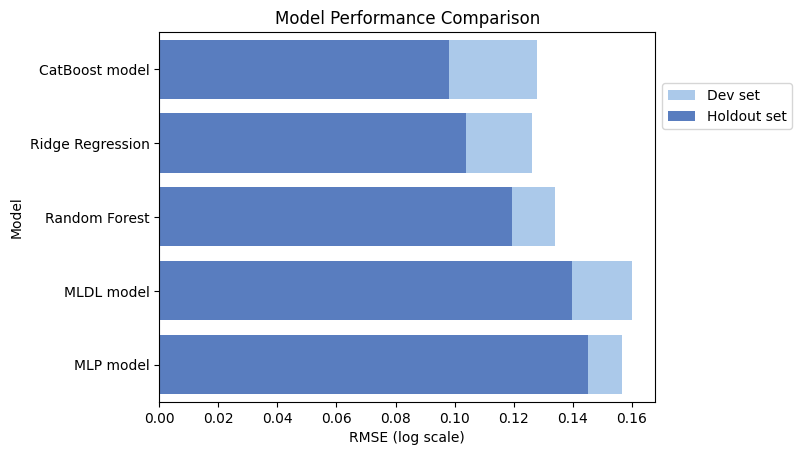

In [175]:
# Plot the dev RMSEs for each model
sns.set_color_codes("pastel")
sns.barplot(x="dev_rmse_log", y="model", data=model_summary_df,
            label="Dev set", color="b", order=model_summary_df['model'])

# Plot the holdout RMSEs for each model
sns.set_color_codes("muted")
sns.barplot(x="holdout_rmse_log", y="model", data=model_summary_df,
            label="Holdout set", color="b")


plt.legend(ncol=1, loc="center left", bbox_to_anchor=(1.0, 0.8), frameon=True)

plt.xlabel('RMSE (log scale)')
plt.ylabel('Model')
plt.title('Model Performance Comparison')

plt.show()

From the start, given that this was a regression task with tabular data and a relatively small dataset (~1500 examples before split), we expected tree-based models to outperform neural networks and simple linear models.  

Initially, our tree-based models (~0.135 RMSE) did outperform the others, while our baseline Ridge model (~0.145 RMSE) still outperformed the neural network models (~0.17 RMSE), which matched our expectations.  

However, after several iterations of improving EDA and especially feature engineering and selection, all models improved, most notably Ridge and the neural networks. This suggests that the data contains strong, mostly linear relationships with the target, giving an advantage to a regularized linear model like Ridge.  

In our final results, CatBoost still performs best on the holdout set, but Ridge comes in a close second, even slightly outperforming CatBoost on the dev set. This outcome highlights the importance of thorough data analysis and feature engineering, as simpler models can sometimes match or even surpass more complex ones when the data structure allows.  

Based on these results, **our final chosen model is the CatBoost regressor**, as it achieved the best generalization on unseen data.  

In [176]:
# Save the model summary to a CSV file
model_summary_df.to_csv('../outputs/comparison_summary.csv', index=False)

# Load the model summary
# model_summary_df = pd.read_csv('../outputs/comparison_summary.csv')

## 7. Final model prediction & submission

### 7.1 Retrain on full training set

Before using our model to predict the prices from the properties on the test set for submission, we will retrain the model using the same parameters, but with all the available training data.  

First let's prepare the data and create the pools needed for both training and prediction.

In [177]:
# Y was already defined as Y=traindf['SalePrice'] earlier in the code
# 'SalePrice' was already dropped from X when defining it as X=traindf.drop('SalePrice', axis=1)

# Drop the selected columns for tree-based models from the training and test dataframes
X.drop(columns=drop_tree, inplace=True)
testdf.drop(columns=drop_tree, inplace=True)

In [178]:
# Create Pools (CatBoost's data structure)
X_pool = Pool(data=X, label=Y, cat_features=cat_features_tree)
test_pool = Pool(data=testdf, cat_features=cat_features_tree)

Now we will train the model again, with the same parameters we used for our best performing model, but with a couple exceptions:
- **use_best_model** and **early_stopping_rounds** cannot be used anymore, as we dont have a dataset to use for evaluation
- **iterations** was set very high (3000) because we were using early stopping, now that we cannot do that because we lack an evaluation set, we will take the number of iterations used in our best model (687) and we will increase it slightly (+ ~10% = 750) given that we have a bigger training dataset and we can allow more iterations before risking overfitting.

In [179]:
# Create final model
Final_model = CatBoostRegressor(
    iterations=750,  # Number of boosting iterations
    # The best model was trained with 3000 iterations and early stopping, and achieved best results at 687 iterations
    # Given that our data has increased in size, we will increase the number of iterations to 750 (+ ~10%)
    learning_rate=0.03,
    depth=6,
    l2_leaf_reg=1,
    bagging_temperature=1.0,
    eval_metric='RMSE',
    random_seed=33,
    verbose=100  # Print progress after how many iterations
)

# Fit the model
Final_model.fit(X_pool)

0:	learn: 0.3909216	total: 7.18ms	remaining: 5.38s
100:	learn: 0.1255822	total: 430ms	remaining: 2.76s
200:	learn: 0.0979779	total: 878ms	remaining: 2.4s
300:	learn: 0.0875046	total: 1.33s	remaining: 1.98s
400:	learn: 0.0798132	total: 1.79s	remaining: 1.56s
500:	learn: 0.0733863	total: 2.24s	remaining: 1.11s
600:	learn: 0.0676355	total: 2.68s	remaining: 665ms
700:	learn: 0.0627697	total: 3.13s	remaining: 219ms
749:	learn: 0.0607096	total: 3.35s	remaining: 0us


With our model ready, we can check the feature importance values to see which turned out to be the most predictive.  
We can use this as a final sanity check, as we should get roughly similar results as what we saw earlier for the final Catboost model (with the split data).

In [180]:
final_feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': Final_model.get_feature_importance(type='FeatureImportance'),
}).sort_values(by='Importance', ascending=False)
final_feature_importance.head(15)

,Feature,Importance
76,TotalSF,21.928648
86,QualityIndex,8.950654
77,TotalFinSF,6.521935
51,KitchenQual,4.101355
15,OverallQual,3.874782
44,GrLivArea,2.970047
82,HouseAge,2.827981
57,GarageYrBlt,2.534117
17,YearBuilt,2.468483
75,TotalBathrooms,2.333454


In [181]:
Final_model.save_model('../models/Final_model.cbm')
# Load the model
# Final_model = CatBoostRegressor()
# Final_model.load_model('../models/Final_model.cbm')

### 7.2 Predict on test set

Now, we will use the test data to make our final prediction, and join those values with their ID's that we saved earlier on.

In [182]:
test_pred = Final_model.predict(test_pool)

In [183]:
del Final_model # Free up memory

In [184]:
test_pred_df = pd.DataFrame({
    'Id': test_id,
    'SalePrice': test_pred  # Convert predictions back to original scale
})

### 7.3 Reverse log-transformation

Now that we do not need to worry about data distribution or model convergence, we should reverse the log transformation of the results, so we can get the values in dollars.  

This is not only done for interpretability, but also because it is required for submission on the competition.  

In [185]:
test_pred_df['SalePrice'] = np.expm1(test_pred_df['SalePrice'])  # Convert log predictions back to original scale

### 7.4 Generate submission

As our final step, we will export our predicitons to a file, with the same content format and file type required by Kaggle.

In [186]:
test_pred_df.head()

,Id,SalePrice
0,1461,120789.035270
1,1462,163266.007771
2,1463,187628.270793
3,1464,196560.812107
4,1465,183218.249905


In [187]:
test_pred_df.to_csv('../outputs/submission.csv', index=False)

### 7.5 Final thoughts

This notebook completes the main scope of the project: a thorough comparison of different modeling approaches for the Ames housing dataset, with a focus on reproducibility and fair evaluation.  

In the future, I may explore further improvements, such as allowing CatBoost to handle missing values natively (rather than manual imputation, which was chosen here for fair model comparison), or experimenting with ensemble methods (combining Ridge and CatBoost predictions, as our best performers) to potentially boost performance.  

These directions could provide additional insights and further optimize predictive accuracy, building on the foundation established here.